In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path
import sys
import seaborn as sns
import cobra
import scipy.stats as st
import scipy
sys.path.append('../../code/')
import leakage

/var/folders/h6/4b_zz_cd5d92w2ycp017ytn00000gp/T/ipykernel_72145/3721680507.py:1: DeprecationWarning: 
Pyarrow will become a required dependency of pandas in the next major release of pandas (pandas 3.0),
(to allow more performant data types, such as the Arrow string type, and better interoperability with other libraries)
but was not found to be installed on your system.
If this would cause problems for you,
please provide us feedback at https://github.com/pandas-dev/pandas/issues/54466
        
  import pandas as pd


In [2]:
folder = Path('/Users/ssulheim/Library/CloudStorage/OneDrive-UniversitédeLausanne/UNIL/leakage/experimental work/sintef_sept_23/exometabolome')

In [3]:
fn = folder / 'SM_Quantitative_Results.xlsx'
mapping_fn = folder / 'met_to_bigg.csv'
od_fn = folder / '..' / 'REL-F-U37-23_OD_TV.xlsx'

## Read mapping

In [4]:
mapping_dict = pd.read_csv(mapping_fn, index_col = 0).to_dict()['BiGG ID']

In [5]:
mapping_dict

{'SEBACOYL-L-CARNITINE (C10-DC)': nan,
 'DEOXYCARNITINE (DEOXY-C0)': 'gbbtn',
 'GLUTARYLCARNITINE (C5-DC)': nan,
 'ALPHA-AMINOBUTYRATE': nan,
 'CREATINE': 'crn',
 'ALPHA-AMINOADIPATE': nan,
 'CIS-ACONITATE': 'acon_C',
 'CITRATE': 'cit',
 'HEXOSES including Glucose and Fructose': 'fru',
 'GLUTARATE': nan,
 'ISOCITRATE': 'icit',
 'LACTATE': 'lac__L',
 'MALATE': 'mal__L',
 'NAD': 'nad',
 'SUCCINATE': 'succ',
 'TRANS-ACONITATE': 'acon_T',
 'ASPARAGINE': 'asn__L',
 'ASPARTATE': 'asp__L',
 'BETA-ALANINE': 'ala_B',
 'GAMMA-AMINOBUTYRATE': '4abut',
 'GLUTAMATE': 'glu__L',
 'GLUTAMINE': 'gln__L',
 'GLYCINE': 'gly',
 'ISOLEUCINE': 'ile__L',
 'LEUCINE': 'leu__L',
 'LYSINE': 'lys__L',
 'METHIONINE': 'met__L',
 'PHENYLALANINE': 'phe__L',
 'PIPECOLIC ACID': nan,
 'PROLINE': 'pro__L',
 'SERINE': 'ser__L',
 'TYROSINE': 'tyr__L',
 'VALINE': 'val__L',
 'ALANINE': 'ala__L',
 'PYRUVATE': 'pyr',
 'CITRULLINE': 'citr__L',
 'HISTIDINE': 'his__L',
 'MALONYLCARNITINE (C3:DC)': nan,
 'FRUCTOSE-6-PHOSPHATE': 'f6

## Read OD and convert to biomass

In [6]:
od_df = pd.read_excel(od_fn, skiprows=2, nrows=21)
od_df.drop(index = 0, inplace=True)

In [7]:
rel_to_info = {
    'REL01': {'M': 'M1', 'CS': 'Galactose'},
    'REL02': {'M': 'M2', 'CS': 'Galactose'},
    'REL03': {'M': 'M3', 'CS': 'Galactose'},
    'REL04': {'M': 'M5', 'CS': 'L-malate'},
    'REL05': {'M': 'M6', 'CS': 'L-malate'},
    'REL06': {'M': 'M7', 'CS': 'L-malate'},
    'REL07': {'M': 'M9', 'CS': 'L-alanine'},
    'REL08': {'M': 'M10', 'CS': 'L-alanine'},
    'REL09': {'M': 'M11', 'CS': 'L-alanine'}
    }
M_to_rel = {dic['M']:rel for rel, dic in rel_to_info.items()}


In [8]:
od_df.rename(columns={'Unnamed: 0': 'Timestamp', 'Unnamed: 1': 'Time', 'Unnamed: 2': 'Hours'}, inplace=True)

In [9]:
od_df

,Timestamp,Time,Hours,REL01,REL02,REL03,REL04,REL05,REL06,REL07,REL08,REL09
1,2023-09-13 00:00:00,09:00:00,0,0.044,0.044,0.015,0.046,0.041,0.029,0.034,0.036,0.019
2,2023-09-13 00:00:00,11:00:00,2.0,0.09,0.09,0.07,0.09,0.07,0.08,0.05,0.05,0.05
3,2023-09-13 00:00:00,13:00:00,4.0,0.17,0.17,0.12,0.17,0.11,0.14,0.08,0.08,0.07
4,2023-09-13 00:00:00,15:00:00,6,0.31,0.32,0.2,0.36,0.26,0.28,0.11,0.12,0.11
5,2023-09-13 00:00:00,17:00:00,8.0,0.58,0.58,0.45,0.87,0.56,0.58,0.16,0.16,0.15
6,2023-09-13 00:00:00,18:15:00,9.25,NaN,NaN,NaN,1.6,1.1,1.2,NaN,NaN,NaN
7,2023-09-13 00:00:00,19:00:00,10.0,1.14,1.04,0.65,2.19,1.52,1.82,0.24,0.23,0.22
8,2023-09-13 00:00:00,20:00:00,11.0,1.26,1.27,0.8,2.75,2.15,2.41,0.29,0.29,0.29
9,2023-09-13 00:00:00,21:00:00,12,1.63,1.6,0.94,2.57,2.35,2.72,0.34,0.33,0.32
10,2023-09-13 00:00:00,22:00:00,13,2.17,2,1.194,2.4,2.407,2.509,NaN,NaN,NaN


In [10]:
gDW_per_OD = {
    'Galactose': 0.35, # gDW/L,
    'L-malate':  0.28,
    'L-alanine': 0.3
}

In [11]:
gdw_df = pd.DataFrame()
gdw_df['Hours'] = od_df['Hours']

In [12]:
for rel, dic in rel_to_info.items():
    gdw_df[rel] = od_df[rel]*gDW_per_OD[dic['CS']]

## Read exometabolome

In [13]:
df = pd.read_excel(fn, nrows=46)

In [14]:
df.columns = [x.rstrip(' ') for x in df.columns]
df.drop(index = 0, inplace=True)

In [15]:
data_columns = ['PHENYLALANINE', 'LEUCINE',
       'ISOLEUCINE', 'METHIONINE', 'GAMMA-AMINOBUTYRATE', 'PROLINE',
       'TYROSINE', 'VALINE', 'PIPECOLIC ACID', 'ALPHA-AMINOBUTYRATE',
       'BETA-ALANINE', 'ALANINE', 'CREATINE', 'ALPHA-AMINOADIPATE',
       'GLYCINE', 'GLUTAMINE', 'GLUTAMATE', 'SERINE', 'ASPARAGINE',
       'ASPARTATE', 'LYSINE', 'PYRUVATE', 'LACTATE',
       'HEXOSES including Glucose and Fructose', 'NAD', 'GLUTARATE',
       'SUCCINATE', 'MALATE', 'CIS-ACONITATE', 'CITRATE', 'ISOCITRATE',
       'TRANS-ACONITATE']
control_samples = ['\xa0 M9 Alanine_001', 'M9 Alanine_002', '\xa0\xa0 M9 Alanine_003',
       ' M9 Galactose_001', ' M9 Galactose_002', ' M9 Galactose_003',
       'M9 malate_001', 'M9 malate_002', 'M9 malate_003']
control_samples = ['\xa0 M9 Alanine_001', 'M9 Alanine_002', '\xa0\xa0 M9 Alanine_003',
       ' M9 Galactose_001', ' M9 Galactose_002', ' M9 Galactose_003',
       'M9 malate_001', 'M9 malate_002', 'M9 malate_003']

In [16]:
control_idx = df['USER CODE'].isin(control_samples)

In [17]:
df.tail()

,Sample_ID,USER CODE,Class 1,Class 2,SEBACOYL-L-CARNITINE (C10-DC),DEOXYCARNITINE (DEOXY-C0),GLUTARYLCARNITINE (C5-DC),PHENYLALANINE,LEUCINE,ISOLEUCINE,...,LACTATE,HEXOSES including Glucose and Fructose,NAD,GLUTARATE,SUCCINATE,MALATE,CIS-ACONITATE,CITRATE,ISOCITRATE,TRANS-ACONITATE
41,SM_MPTA_112023_ FreshMedia_M9 Galactose_002_41,M9 Galactose_002,Galactose,T0,0.113341,ND,0.084389,0.007935,ND,ND,...,4.28256,37352.790874,ND,ND,ND,0.131436,ND,ND,ND,ND
42,SM_MPTA_112023_ FreshMedia_M9 Galactose_003_42,M9 Galactose_003,Galactose,T0,0.087333,ND,ND,0.001259,ND,ND,...,1.50591,40693.20641,ND,ND,ND,2.256583,ND,ND,ND,ND
43,SM_MPTA_112023_ FreshMedia_M9 malate_001_43,M9 malate_001,L-malate,T0,0.107367,ND,0.212538,0.051862,ND,ND,...,18.173573,ND,ND,4.731919,967.347454,26034.910584,ND,ND,ND,ND
44,SM_MPTA_112023_ FreshMedia_M9 malate_002_44,M9 malate_002,L-malate,T0,0.092292,ND,0.283112,0.049358,ND,0.063293,...,9.968043,ND,ND,3.847096,625.067213,26893.54499,ND,ND,ND,ND
45,SM_MPTA_112023_ FreshMedia_M9 malate_003_45,M9 malate_003,L-malate,T0,0.102741,ND,ND,0.040061,ND,0.039175,...,11.473287,ND,ND,3.510805,648.210703,29258.014474,ND,ND,ND,ND


# Drop columns that are not interesting (doesn't map to model)

In [18]:
df.drop(columns = ['SEBACOYL-L-CARNITINE (C10-DC)', 'DEOXYCARNITINE (DEOXY-C0)',
       'GLUTARYLCARNITINE (C5-DC)'], inplace=True)

## Outliers in medium measurements

We have double checked Malate and indeed, the higher values of Malate observed in the highlighted samples is due to a carry-over from the fresh media Malate. All samples were blinded randomized for the analysis and SM_MPTA_112023_39_Galactose-T8_M3_3; SM_MPTA_112023_ FreshMedia_M9 Alanine_003_39 and also SM_MPTA_112023_88_L-alanine-T18_M9_31 were injected just after the A M9_malate sample. What explains the 10-fold difference observed.
 
We have a LC-MS and autosampler wash step before and after each injection in order to minimize / reduce the carry-over but in this case the concentration of Malate in the Malate-fresh media was to high in comparison to the other values.


In [19]:
df.loc[39, ['SUCCINATE', 'MALATE']] = 'ND'
df['MALATE'] = 'ND'
# Also errors with malate
# Galactose-T12_M1_4, Galactose-T8_M3, Galactose-T14_M2, Galactose-T14_M3, Galactose-T6_M2, Galactose-T12_M2, L-alanine-T18_M11, L-alanine-T18_M9

In [20]:
df.rename(columns = {'Class 1':'Carbon source', 'Class 2':'Timepoint-tag'}, inplace=True)

## Read medium values

In [21]:
control_df = df.loc[control_idx,:].copy()
# control_df.fillna(0, inplace = True)
control_df.replace('ND', np.nan, inplace=True)
medium_dict = control_df.groupby(by = 'Carbon source').mean(data_columns).to_dict(orient = 'index')



/var/folders/h6/4b_zz_cd5d92w2ycp017ytn00000gp/T/ipykernel_72145/3108561955.py:3: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  control_df.replace('ND', np.nan, inplace=True)


In [22]:
control_df = control_df[['Carbon source']+data_columns]

In [23]:
dfl = df.loc[:,:].melt(id_vars=['Sample_ID', 'USER CODE', 'Carbon source', 'Timepoint-tag'], value_vars=data_columns, value_name='Concentration', var_name = 'Metabolite')

In [24]:
dfl.replace('ND', np.nan, inplace=True)

/var/folders/h6/4b_zz_cd5d92w2ycp017ytn00000gp/T/ipykernel_72145/2439169259.py:1: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  dfl.replace('ND', np.nan, inplace=True)


In [25]:
dfl

,Sample_ID,USER CODE,Carbon source,Timepoint-tag,Metabolite,Concentration
0,SM_MPTA_112023_28_Galactose-T6_M1_1,#28: Galactose-T6 M1,Galactose,T1,PHENYLALANINE,0.002685
1,SM_MPTA_112023_29_Galactose-T6_M2_2,#29: Galactose-T6 M2,Galactose,T1,PHENYLALANINE,NaN
2,SM_MPTA_112023_39_Galactose-T8_M3_3,#39: Galactose-T8 M3,Galactose,T1,PHENYLALANINE,NaN
3,SM_MPTA_112023_55_Galactose-T12_M1_4,#55: Galactose-T12 M1,Galactose,T2,PHENYLALANINE,0.014445
4,SM_MPTA_112023_56_Galactose-T12_M2_5,#56: Galactose-T12 M2,Galactose,T2,PHENYLALANINE,0.026071
...,...,...,...,...,...,...
1435,SM_MPTA_112023_ FreshMedia_M9 Galactose_002_41,M9 Galactose_002,Galactose,T0,TRANS-ACONITATE,NaN
1436,SM_MPTA_112023_ FreshMedia_M9 Galactose_003_42,M9 Galactose_003,Galactose,T0,TRANS-ACONITATE,NaN
1437,SM_MPTA_112023_ FreshMedia_M9 malate_001_43,M9 malate_001,L-malate,T0,TRANS-ACONITATE,NaN
1438,SM_MPTA_112023_ FreshMedia_M9 malate_002_44,M9 malate_002,L-malate,T0,TRANS-ACONITATE,NaN


In [26]:
dfl['Hours'] = [int(x[1].split('-T')[-1]) if 'T' in x[1] else 0 for x in dfl['USER CODE'].str.split(' ') ]
dfl['M'] = [x[-1] for x in dfl['USER CODE'].str.split(' ')]
# dfl['Carbon source'] = dfl['Class 1']

In [27]:
dfl['Timepoint'] = dfl['Timepoint-tag'].str.strip('T').astype(int)


dfl['M'] = [x[-1] for x in dfl['USER CODE'].str.split(' ')]

In [28]:
dfl.loc[dfl.Timepoint != 4,:]

,Sample_ID,USER CODE,Carbon source,Timepoint-tag,Metabolite,Concentration,Hours,M,Timepoint
0,SM_MPTA_112023_28_Galactose-T6_M1_1,#28: Galactose-T6 M1,Galactose,T1,PHENYLALANINE,0.002685,6,M1,1
1,SM_MPTA_112023_29_Galactose-T6_M2_2,#29: Galactose-T6 M2,Galactose,T1,PHENYLALANINE,NaN,6,M2,1
2,SM_MPTA_112023_39_Galactose-T8_M3_3,#39: Galactose-T8 M3,Galactose,T1,PHENYLALANINE,NaN,8,M3,1
3,SM_MPTA_112023_55_Galactose-T12_M1_4,#55: Galactose-T12 M1,Galactose,T2,PHENYLALANINE,0.014445,12,M1,2
4,SM_MPTA_112023_56_Galactose-T12_M2_5,#56: Galactose-T12 M2,Galactose,T2,PHENYLALANINE,0.026071,12,M2,2
...,...,...,...,...,...,...,...,...,...
1435,SM_MPTA_112023_ FreshMedia_M9 Galactose_002_41,M9 Galactose_002,Galactose,T0,TRANS-ACONITATE,NaN,0,Galactose_002,0
1436,SM_MPTA_112023_ FreshMedia_M9 Galactose_003_42,M9 Galactose_003,Galactose,T0,TRANS-ACONITATE,NaN,0,Galactose_003,0
1437,SM_MPTA_112023_ FreshMedia_M9 malate_001_43,M9 malate_001,L-malate,T0,TRANS-ACONITATE,NaN,0,malate_001,0
1438,SM_MPTA_112023_ FreshMedia_M9 malate_002_44,M9 malate_002,L-malate,T0,TRANS-ACONITATE,NaN,0,malate_002,0


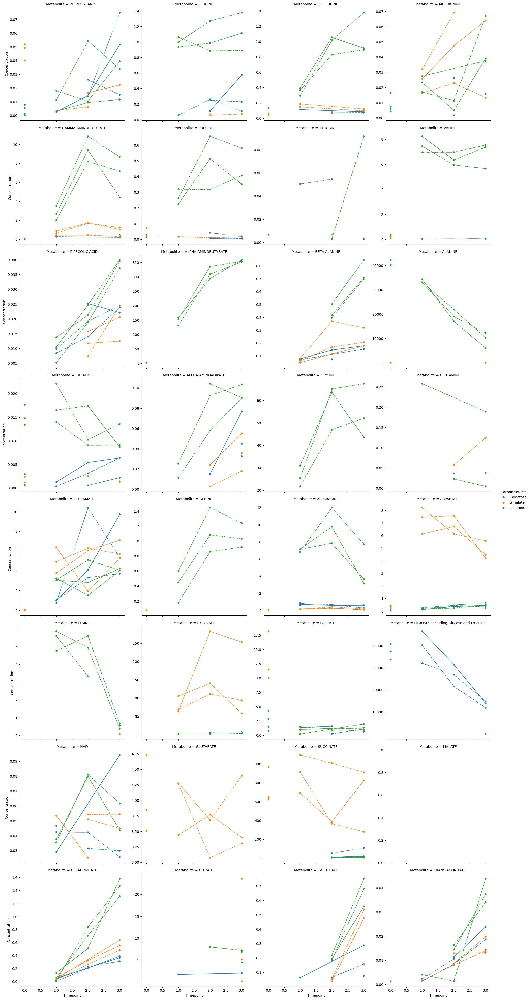

In [29]:
ax = sns.relplot(data = dfl.loc[dfl.Timepoint != 4,:], x = 'Timepoint', y = 'Concentration', hue = 'Carbon source', col = 'Metabolite', col_wrap=4, facet_kws={'sharey': False})
ax.map_dataframe(sns.lineplot, 'Timepoint', 'Concentration', hue = 'Carbon source', style = 'M')
plt.show()

# Estimate rate per bioreactor

In [30]:
control_idx_l = dfl.Hours == 0

M1 Galactose PHENYLALANINE 1.2315561786032251e-05 3.4148980347953656e-06 0.27728317182155565


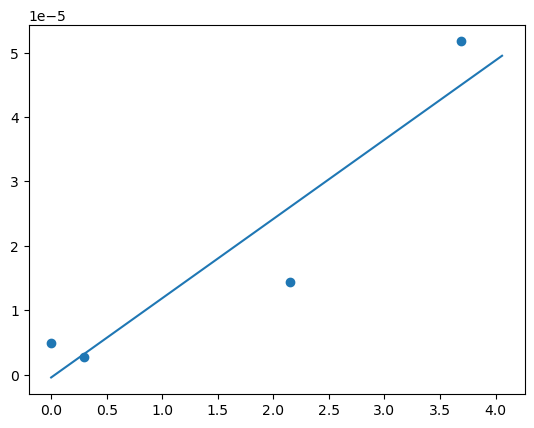

M1 Galactose LEUCINE 0.0001488499191403311 6.905320148700502e-05 0.463911582121209


/Users/ssulheim/anaconda3/envs/pandas2/lib/python3.12/site-packages/scipy/optimize/_minpack_py.py:1010: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


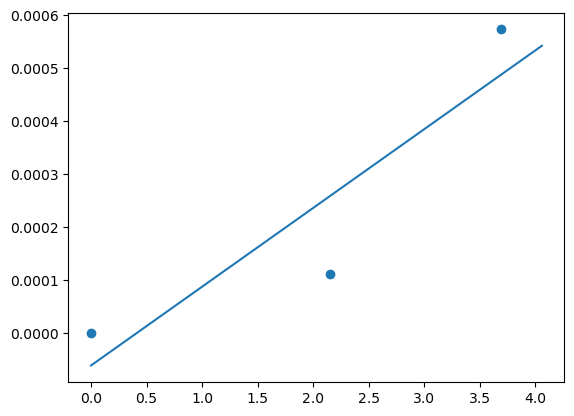

M1 Galactose ISOLEUCINE -1.0952734804795747e-05 3.4842175253397974e-06 0.31811393112651676


/Users/ssulheim/anaconda3/envs/pandas2/lib/python3.12/site-packages/scipy/optimize/_minpack_py.py:1010: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


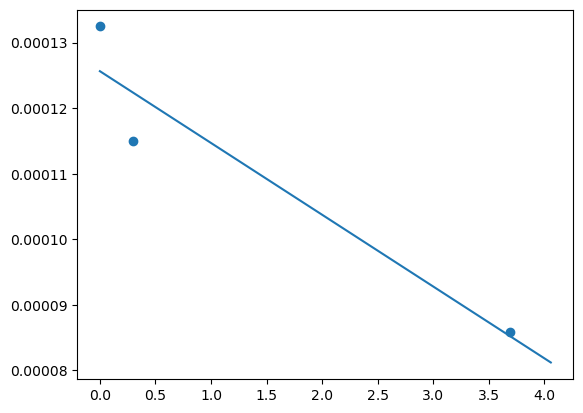

M1 Galactose METHIONINE 3.0726607432818306e-06 inf inf


/Users/ssulheim/anaconda3/envs/pandas2/lib/python3.12/site-packages/scipy/optimize/_minpack_py.py:1010: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


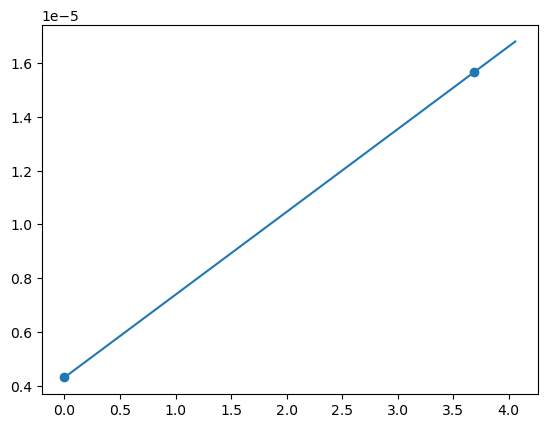

M1 Galactose GAMMA-AMINOBUTYRATE 0.001950981498367631 inf inf


/Users/ssulheim/anaconda3/envs/pandas2/lib/python3.12/site-packages/scipy/optimize/_minpack_py.py:1010: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


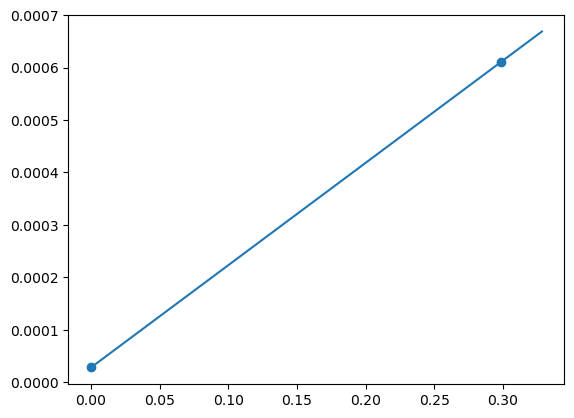

M1 Galactose PROLINE -6.670306930713443e-06 inf inf


/Users/ssulheim/anaconda3/envs/pandas2/lib/python3.12/site-packages/scipy/optimize/_minpack_py.py:1010: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


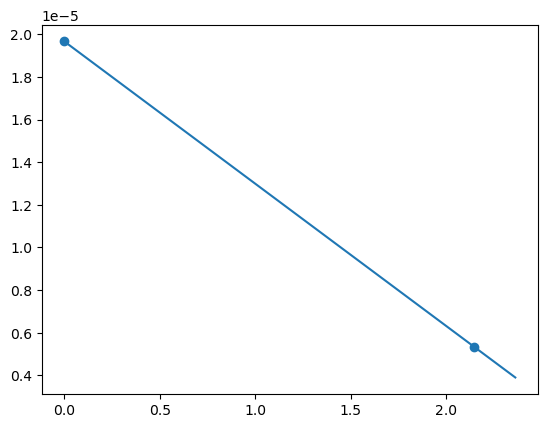

/Users/ssulheim/anaconda3/envs/pandas2/lib/python3.12/site-packages/scipy/optimize/_minpack_py.py:1010: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


M1 Galactose VALINE 1.0038756682992082e-05 inf inf


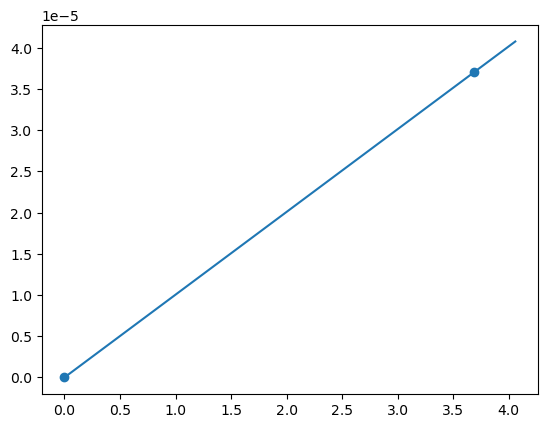

/Users/ssulheim/anaconda3/envs/pandas2/lib/python3.12/site-packages/scipy/optimize/_minpack_py.py:1010: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


M1 Galactose PIPECOLIC ACID 1.1750295234262228e-05 inf inf


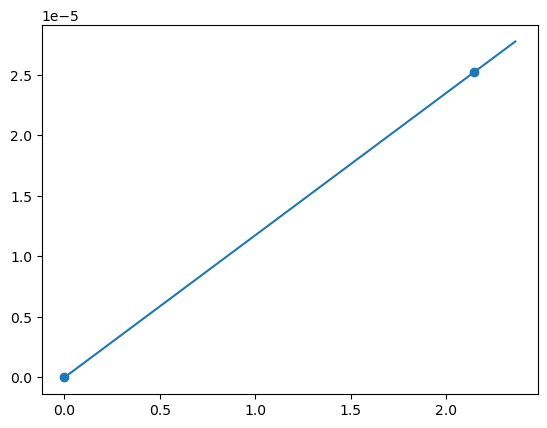

M1 Galactose BETA-ALANINE 4.279138074574256e-05 1.1855489490438804e-05 0.2770532122083567


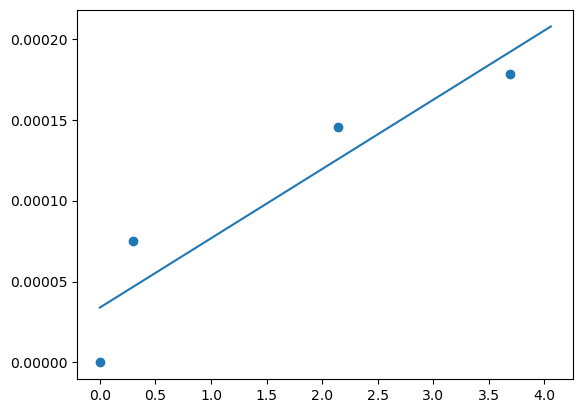

/Users/ssulheim/anaconda3/envs/pandas2/lib/python3.12/site-packages/scipy/optimize/_minpack_py.py:1010: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


M1 Galactose ALANINE -0.0005046700957883909 inf inf


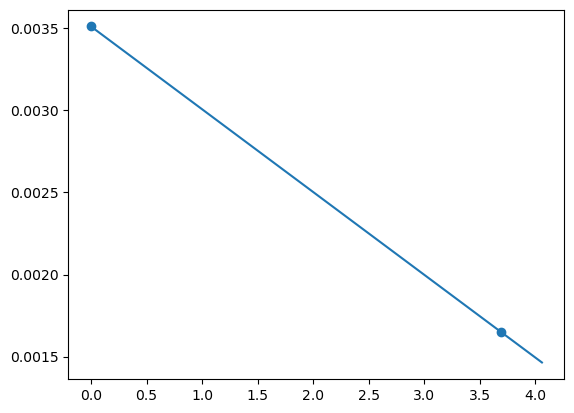

M1 Galactose CREATINE 1.4396009653585384e-06 2.768462710315907e-07 0.19230764475254503


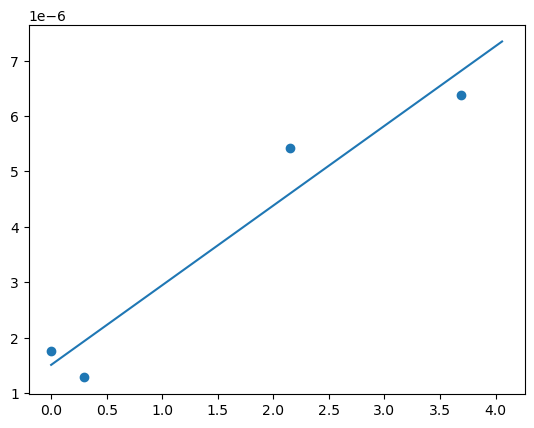

/Users/ssulheim/anaconda3/envs/pandas2/lib/python3.12/site-packages/scipy/optimize/_minpack_py.py:1010: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


M1 Galactose ALPHA-AMINOADIPATE 1.9951408447375114e-05 9.235148637057837e-06 0.46288203970245767


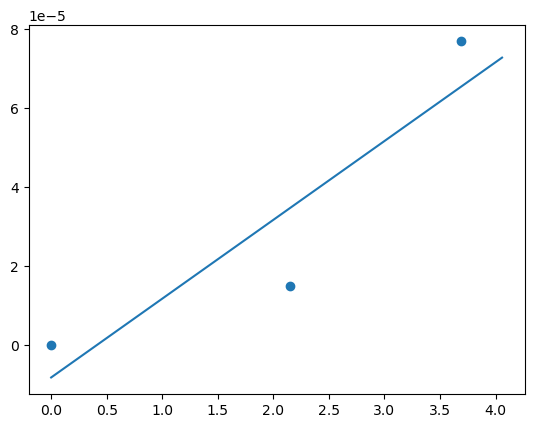

M1 Galactose GLUTAMATE 0.0024945444102328638 0.0003322619113163365 0.13319542837295895


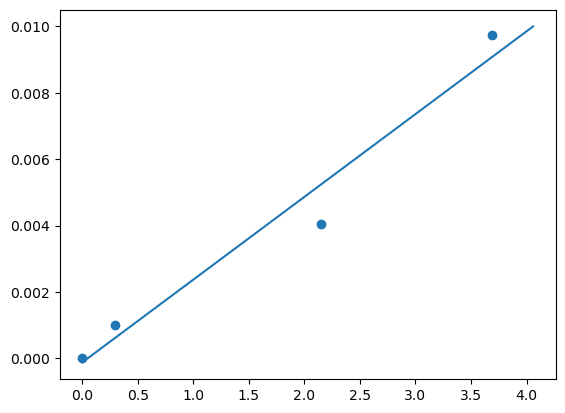

M1 Galactose ASPARAGINE nan nan nan


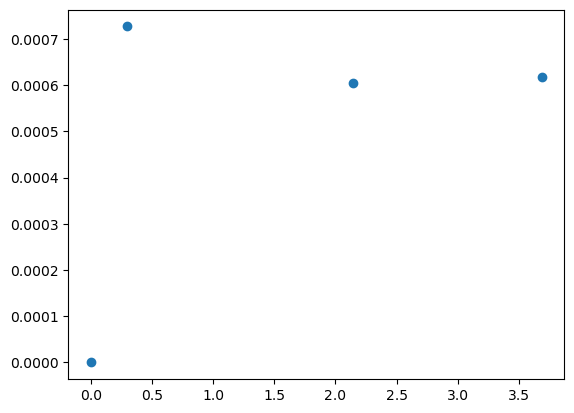

M1 Galactose ASPARTATE 0.00010132233738135021 1.4668033157555407e-05 0.14476603616386038


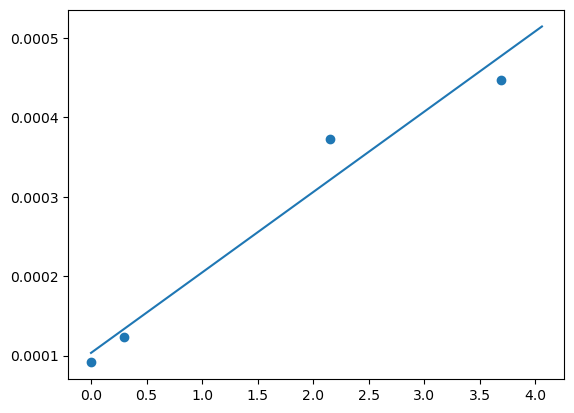

M1 Galactose PYRUVATE 0.0019269852811640016 inf inf


/Users/ssulheim/anaconda3/envs/pandas2/lib/python3.12/site-packages/scipy/optimize/_minpack_py.py:1010: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


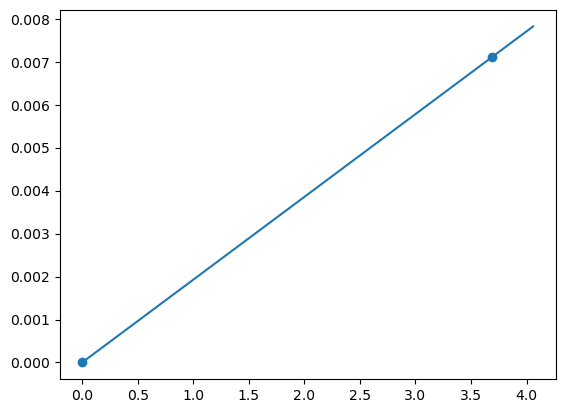

M1 Galactose LACTATE nan nan nan


/Users/ssulheim/anaconda3/envs/pandas2/lib/python3.12/site-packages/scipy/optimize/_minpack_py.py:1010: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


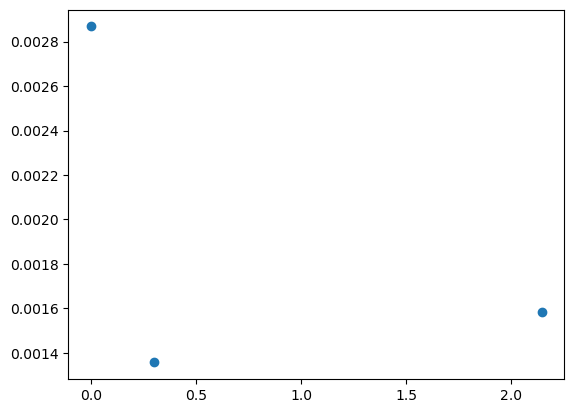

M1 Galactose HEXOSES including Glucose and Fructose -4.65059461695993 4.610324708818367 0.9913409119782864


/Users/ssulheim/anaconda3/envs/pandas2/lib/python3.12/site-packages/scipy/optimize/_minpack_py.py:1010: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


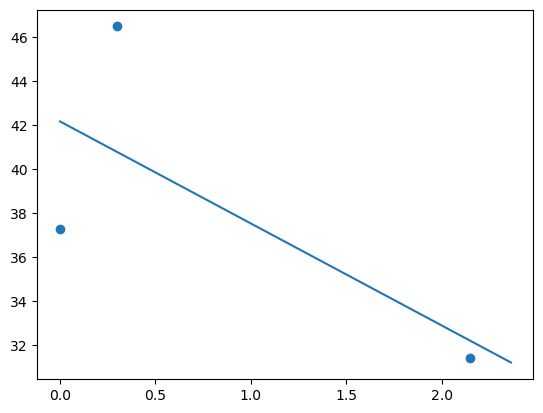

/Users/ssulheim/anaconda3/envs/pandas2/lib/python3.12/site-packages/scipy/optimize/_minpack_py.py:1010: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


M1 Galactose NAD 2.2916067515776287e-05 5.439484865186886e-06 0.23736554543846317


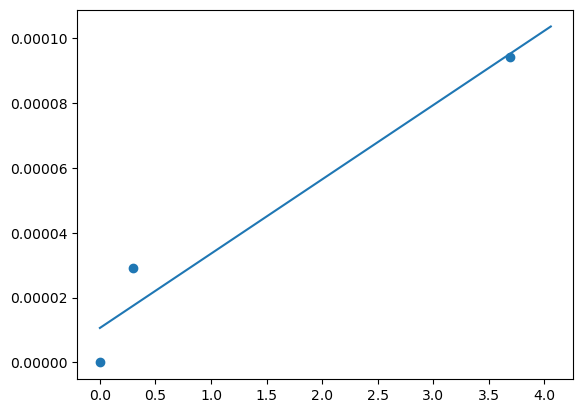

/Users/ssulheim/anaconda3/envs/pandas2/lib/python3.12/site-packages/scipy/optimize/_minpack_py.py:1010: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


M1 Galactose SUCCINATE 0.00638158985088221 0.0019154511079265979 0.3001526504655889


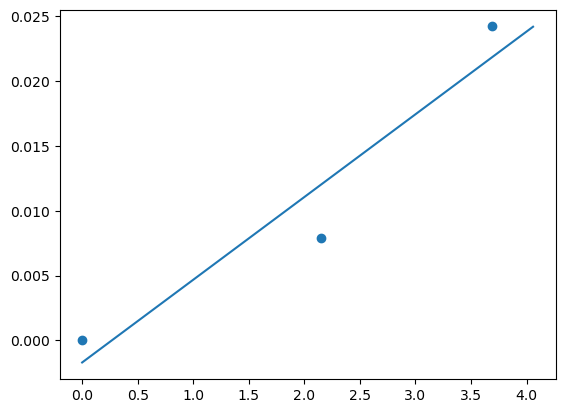

M1 Galactose CIS-ACONITATE 9.715583887714668e-05 2.5358873308512827e-06 0.026101234471948783


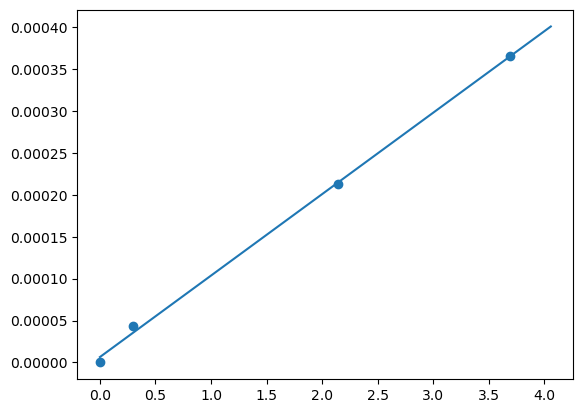

M1 Galactose CITRATE 0.00035917588017814786 0.00038905359850986563 1.0831840888561302


/Users/ssulheim/anaconda3/envs/pandas2/lib/python3.12/site-packages/scipy/optimize/_minpack_py.py:1010: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


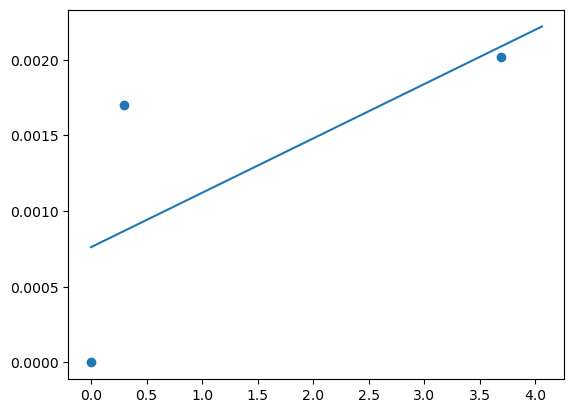

/Users/ssulheim/anaconda3/envs/pandas2/lib/python3.12/site-packages/scipy/optimize/_minpack_py.py:1010: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


M1 Galactose ISOCITRATE 7.293143241835718e-05 1.0063651082966141e-05 0.1379878435026195


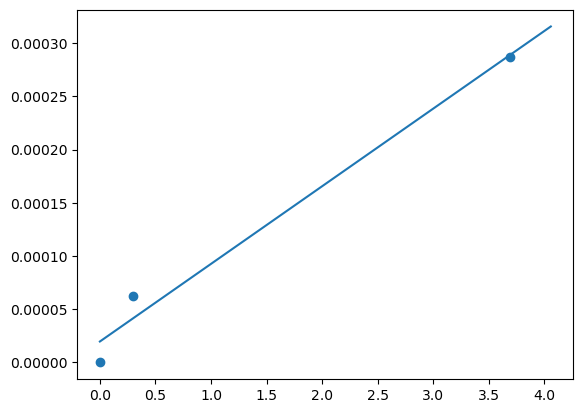

/Users/ssulheim/anaconda3/envs/pandas2/lib/python3.12/site-packages/scipy/optimize/_minpack_py.py:1010: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


M1 Galactose TRANS-ACONITATE 6.398431023983556e-06 8.198861084279873e-07 0.12813861794473794


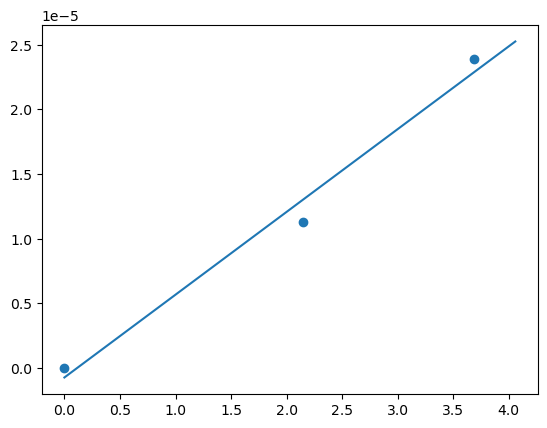

M2 Galactose PHENYLALANINE 1.0199373526461836e-05 inf inf


/Users/ssulheim/anaconda3/envs/pandas2/lib/python3.12/site-packages/scipy/optimize/_minpack_py.py:1010: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


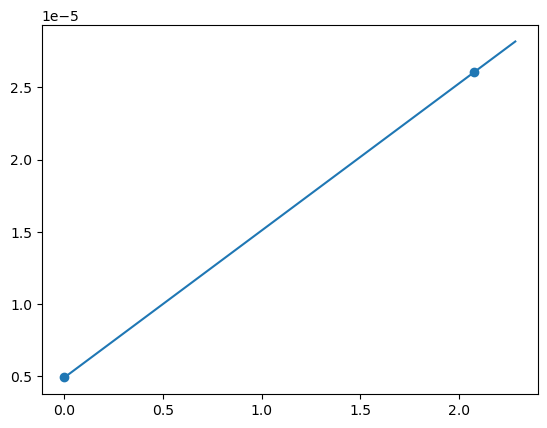

/Users/ssulheim/anaconda3/envs/pandas2/lib/python3.12/site-packages/scipy/optimize/_minpack_py.py:1010: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


M2 Galactose LEUCINE 0.00011992447818062472 inf inf


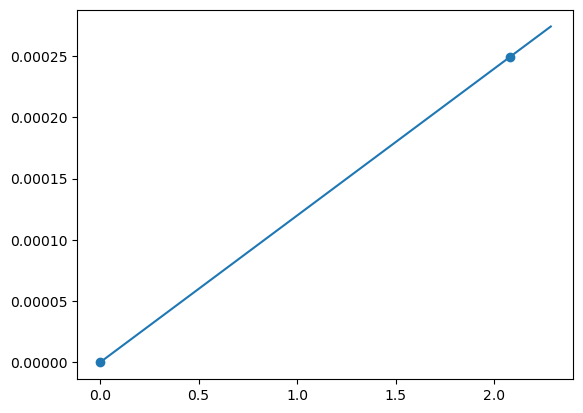

/Users/ssulheim/anaconda3/envs/pandas2/lib/python3.12/site-packages/scipy/optimize/_minpack_py.py:1010: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


M2 Galactose ISOLEUCINE nan nan nan


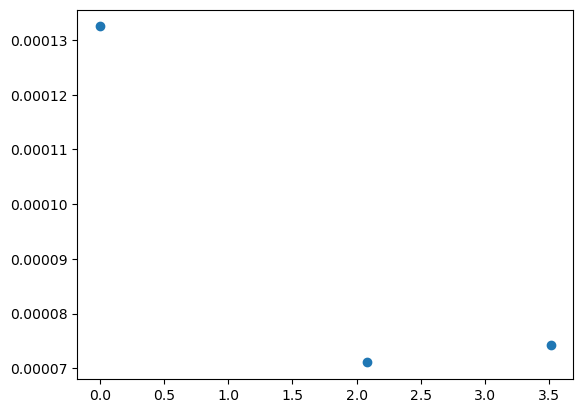

/Users/ssulheim/anaconda3/envs/pandas2/lib/python3.12/site-packages/scipy/optimize/_minpack_py.py:1010: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


M2 Galactose METHIONINE -1.2220031487296197e-06 inf inf


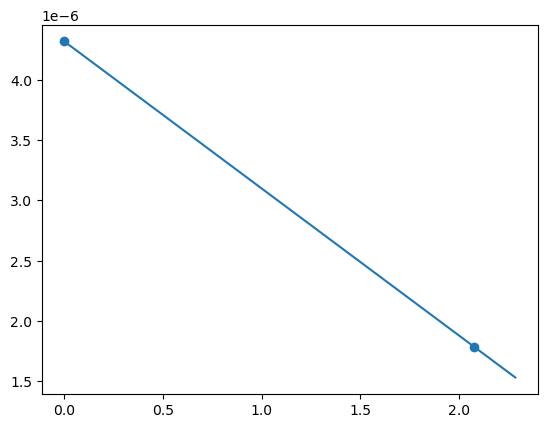

/Users/ssulheim/anaconda3/envs/pandas2/lib/python3.12/site-packages/scipy/optimize/_minpack_py.py:1010: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


M2 Galactose GAMMA-AMINOBUTYRATE nan nan nan


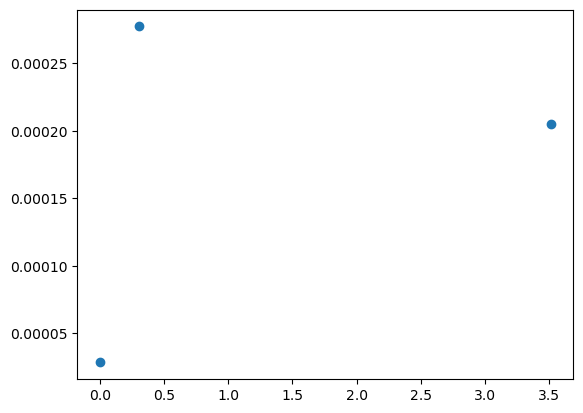

/Users/ssulheim/anaconda3/envs/pandas2/lib/python3.12/site-packages/scipy/optimize/_minpack_py.py:1010: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


M2 Galactose PROLINE -4.114485350031394e-06 inf inf


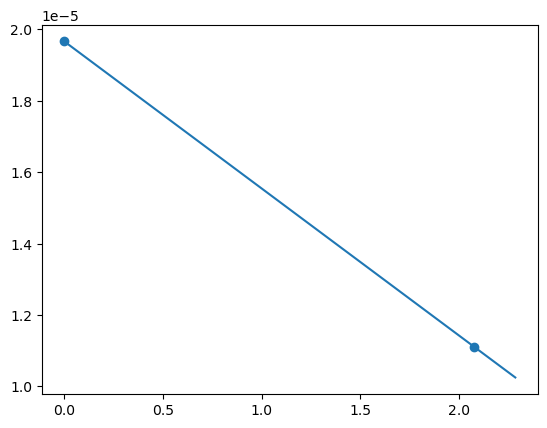

M2 Galactose PIPECOLIC ACID 5.884992473095225e-06 1.2018947560817538e-06 0.20423046615208576


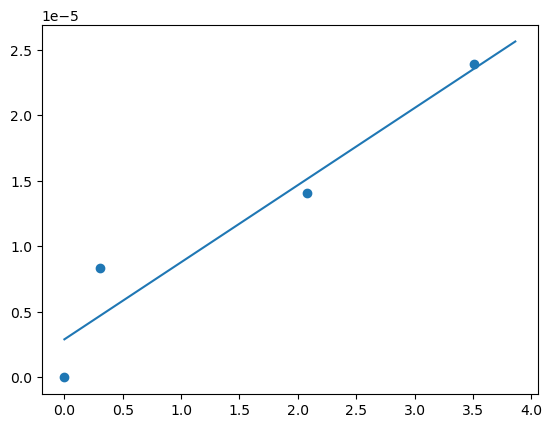

/Users/ssulheim/anaconda3/envs/pandas2/lib/python3.12/site-packages/scipy/optimize/_minpack_py.py:1010: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


M2 Galactose BETA-ALANINE 3.652617419382823e-05 1.4666157670415583e-05 0.40152460513901017


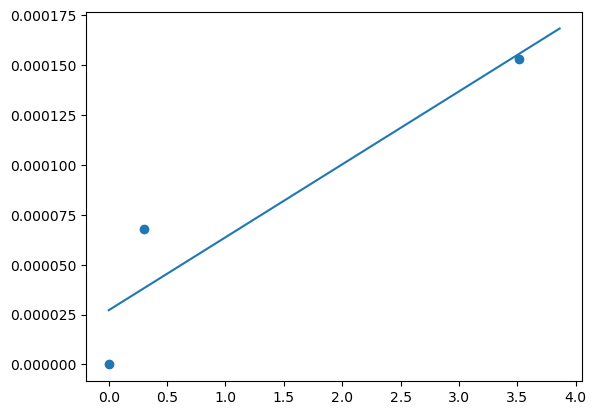

M2 Galactose CREATINE 1.4840033691641731e-06 3.9183081073106054e-07 0.264036335006267


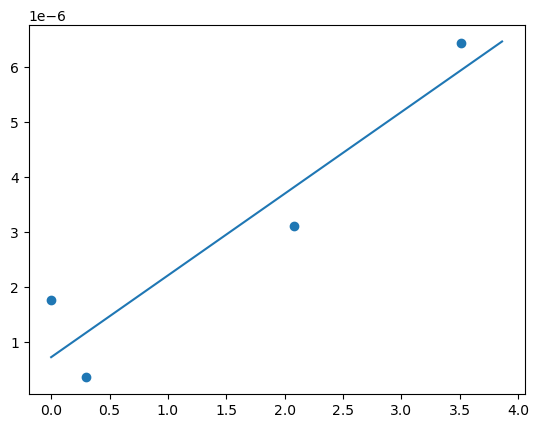

/Users/ssulheim/anaconda3/envs/pandas2/lib/python3.12/site-packages/scipy/optimize/_minpack_py.py:1010: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


M2 Galactose ALPHA-AMINOADIPATE 9.285030879297793e-06 inf inf


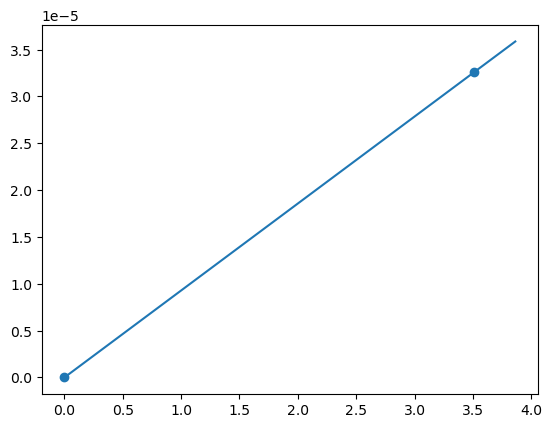

M2 Galactose GLUTAMATE 0.0010351516647688634 0.00023816984229298437 0.23008207434624062


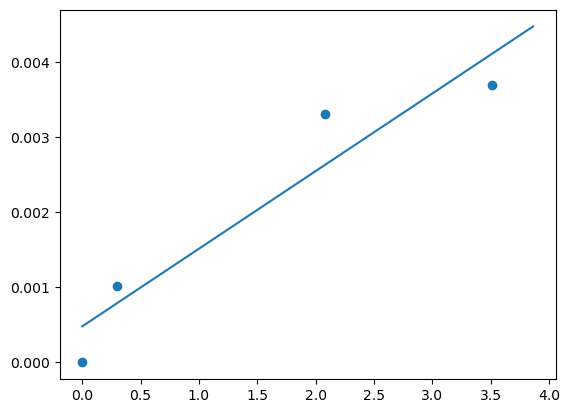

/Users/ssulheim/anaconda3/envs/pandas2/lib/python3.12/site-packages/scipy/optimize/_minpack_py.py:1010: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


M2 Galactose ASPARAGINE 0.00022912229158140912 0.00025574315838970533 1.1161862803682618


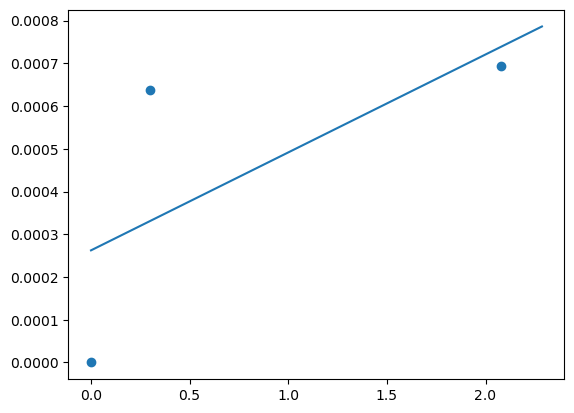

M2 Galactose ASPARTATE 9.564023593805544e-05 1.965707369361397e-05 0.20553142200888677


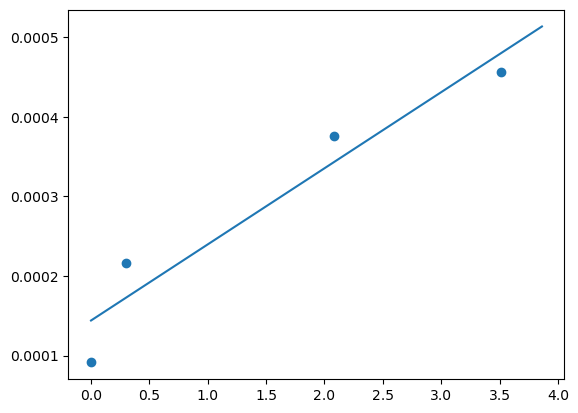

/Users/ssulheim/anaconda3/envs/pandas2/lib/python3.12/site-packages/scipy/optimize/_minpack_py.py:1010: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


M2 Galactose PYRUVATE 0.0027316919000444973 inf inf


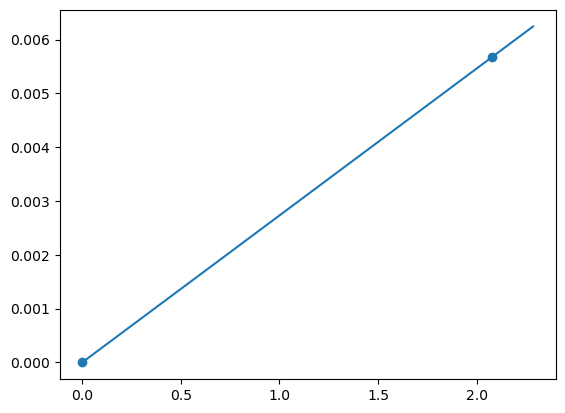

M2 Galactose LACTATE nan nan nan


/Users/ssulheim/anaconda3/envs/pandas2/lib/python3.12/site-packages/scipy/optimize/_minpack_py.py:1010: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


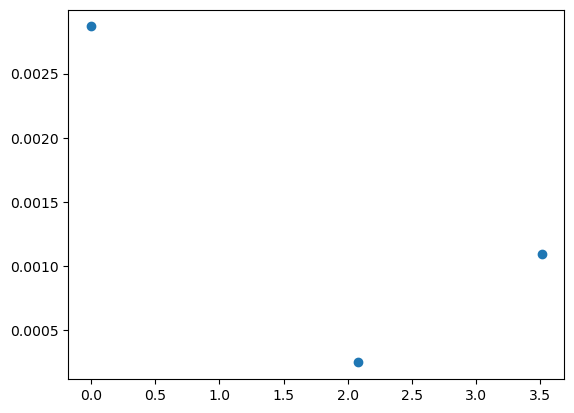

/Users/ssulheim/anaconda3/envs/pandas2/lib/python3.12/site-packages/scipy/optimize/_minpack_py.py:1010: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


M2 Galactose HEXOSES including Glucose and Fructose -8.62346972250237 2.484169590212376 0.28807077315179763


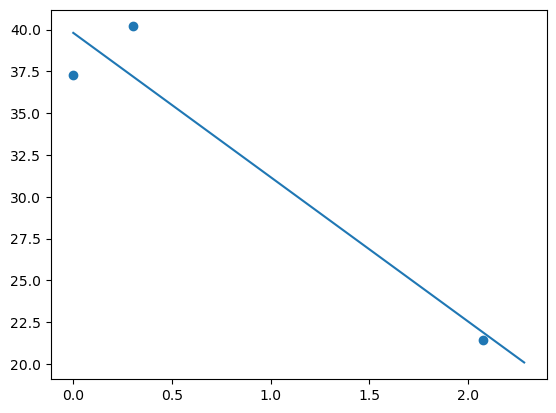

M2 Galactose NAD 1.5130334578750135e-05 inf inf


/Users/ssulheim/anaconda3/envs/pandas2/lib/python3.12/site-packages/scipy/optimize/_minpack_py.py:1010: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


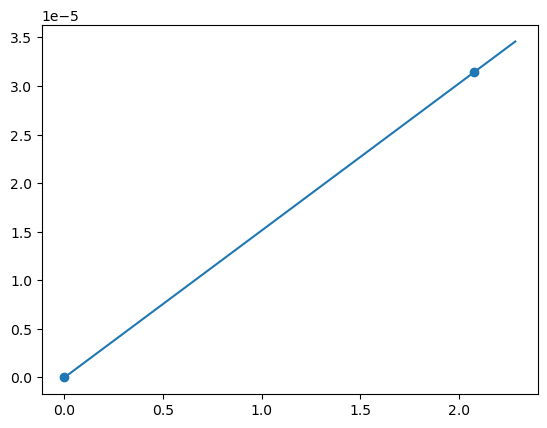

/Users/ssulheim/anaconda3/envs/pandas2/lib/python3.12/site-packages/scipy/optimize/_minpack_py.py:1010: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


M2 Galactose SUCCINATE 0.004997846307229557 0.002088367093360402 0.41785340424324513


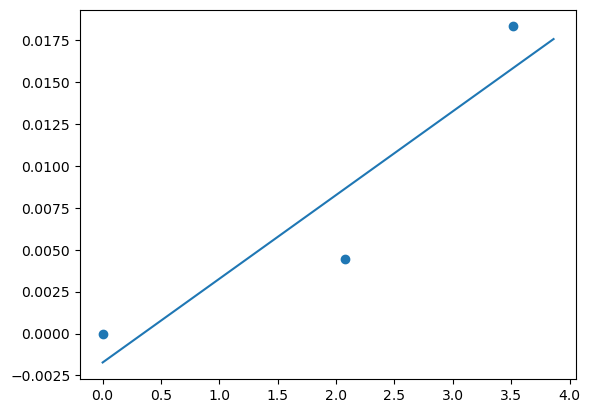

M2 Galactose CIS-ACONITATE 0.00011393929237812382 6.349070708474049e-06 0.05572327663229424


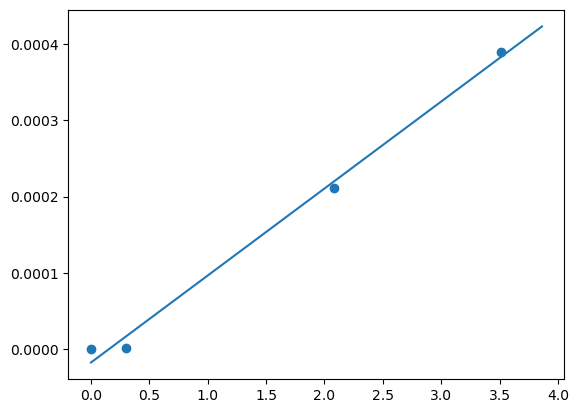

/Users/ssulheim/anaconda3/envs/pandas2/lib/python3.12/site-packages/scipy/optimize/_minpack_py.py:1010: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


M2 Galactose ISOCITRATE 4.377543344265966e-05 9.221078973737547e-06 0.2106450638762037


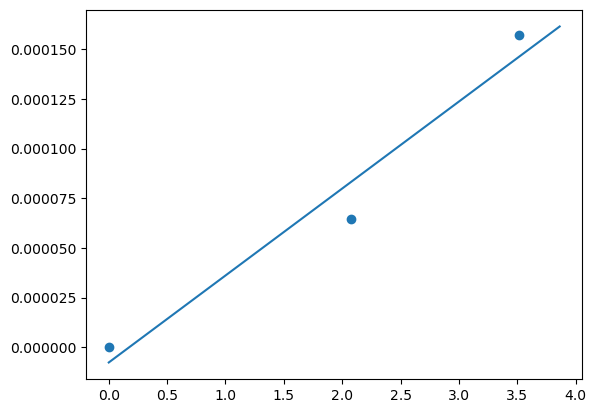

M2 Galactose TRANS-ACONITATE 5.151247542353701e-06 5.366423291164174e-07 0.10417715799990762


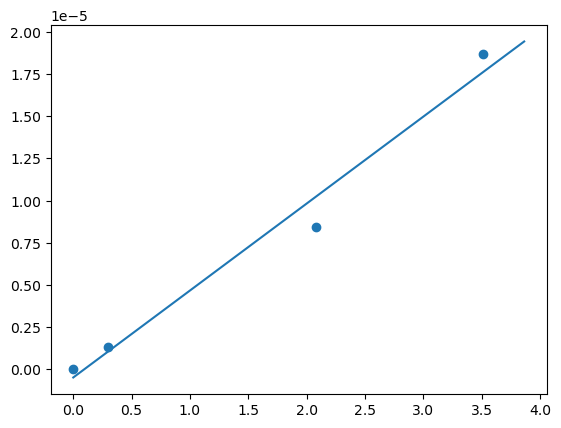

/Users/ssulheim/anaconda3/envs/pandas2/lib/python3.12/site-packages/scipy/optimize/_minpack_py.py:1010: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


M3 Galactose PHENYLALANINE 1.8762609647335e-05 1.1957980143277193e-05 0.6373303270729016


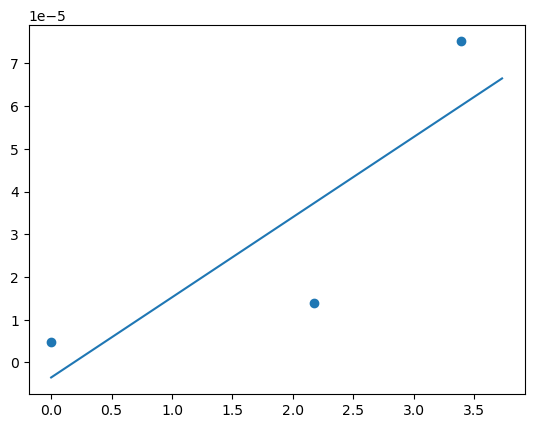

M3 Galactose LEUCINE 0.00011806088848540084 3.471460147060346e-06 0.029403981213385662


/Users/ssulheim/anaconda3/envs/pandas2/lib/python3.12/site-packages/scipy/optimize/_minpack_py.py:1010: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


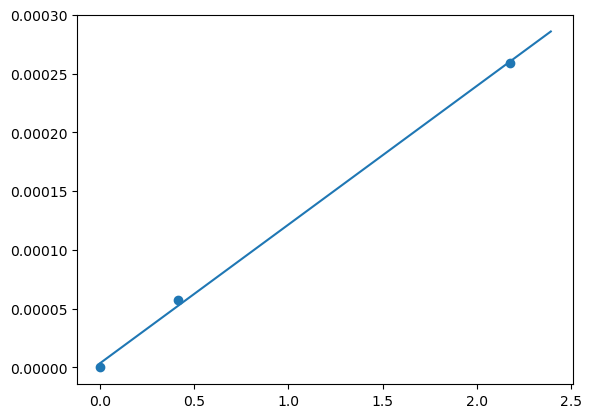

/Users/ssulheim/anaconda3/envs/pandas2/lib/python3.12/site-packages/scipy/optimize/_minpack_py.py:1010: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


M3 Galactose ISOLEUCINE -1.9424173007995902e-05 inf inf


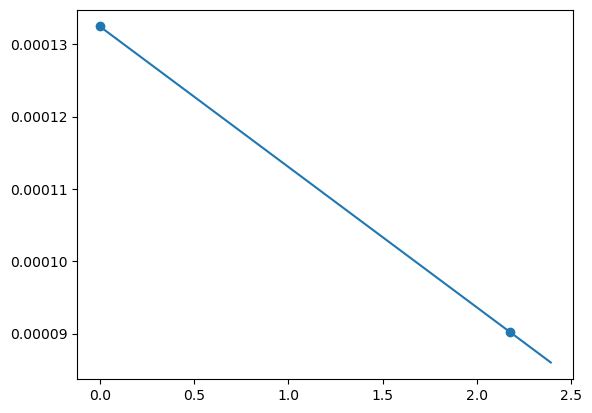

M3 Galactose METHIONINE 1.0073867786358207e-05 inf inf


/Users/ssulheim/anaconda3/envs/pandas2/lib/python3.12/site-packages/scipy/optimize/_minpack_py.py:1010: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


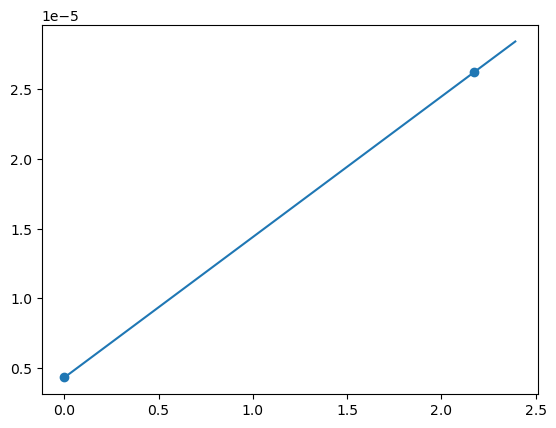

/Users/ssulheim/anaconda3/envs/pandas2/lib/python3.12/site-packages/scipy/optimize/_minpack_py.py:1010: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


M3 Galactose GAMMA-AMINOBUTYRATE 0.00011784870161539234 inf inf


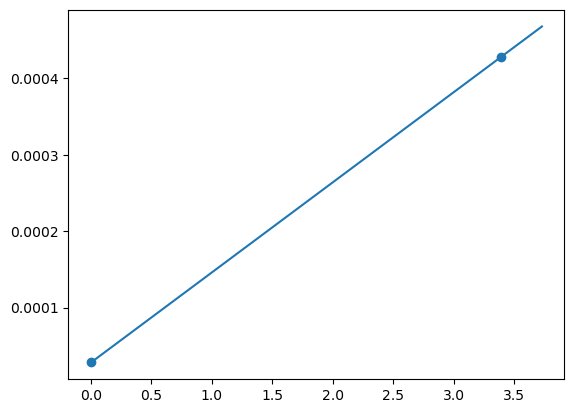

/Users/ssulheim/anaconda3/envs/pandas2/lib/python3.12/site-packages/scipy/optimize/_minpack_py.py:1010: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


M3 Galactose PROLINE 1.0575478841193101e-05 inf inf


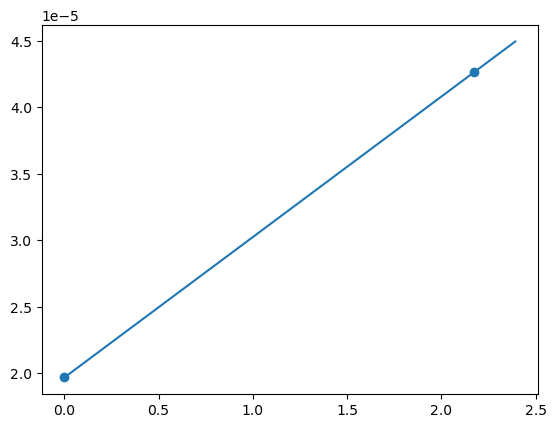

/Users/ssulheim/anaconda3/envs/pandas2/lib/python3.12/site-packages/scipy/optimize/_minpack_py.py:1010: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


M3 Galactose TYROSINE 8.901691877151665e-07 inf inf


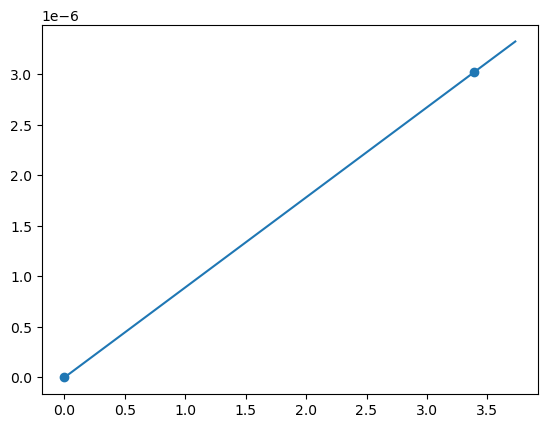

/Users/ssulheim/anaconda3/envs/pandas2/lib/python3.12/site-packages/scipy/optimize/_minpack_py.py:1010: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


M3 Galactose VALINE 1.551307948330156e-05 1.0081838287462086e-05 0.649892775854999


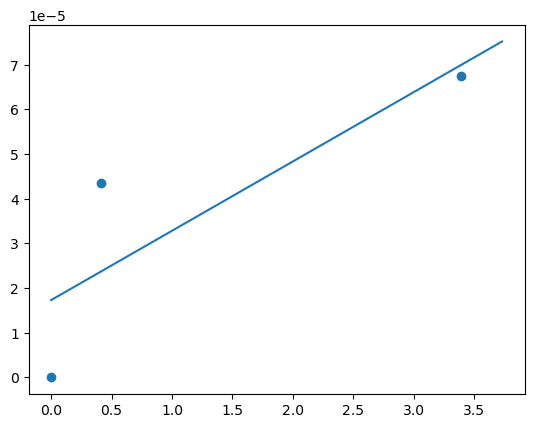

M3 Galactose PIPECOLIC ACID 6.559991786861869e-06 1.3960447847747521e-06 0.21281197143732766


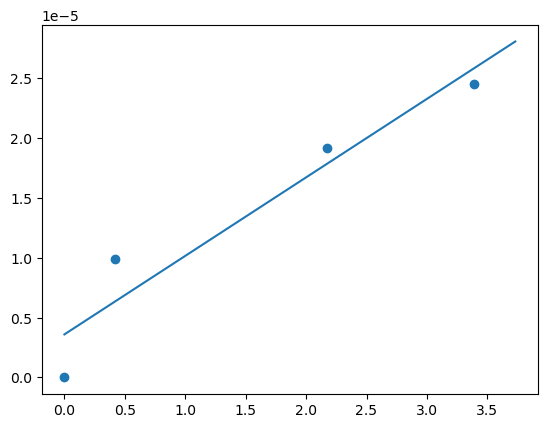

/Users/ssulheim/anaconda3/envs/pandas2/lib/python3.12/site-packages/scipy/optimize/_minpack_py.py:1010: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


M3 Galactose BETA-ALANINE 3.316007491729498e-05 inf inf


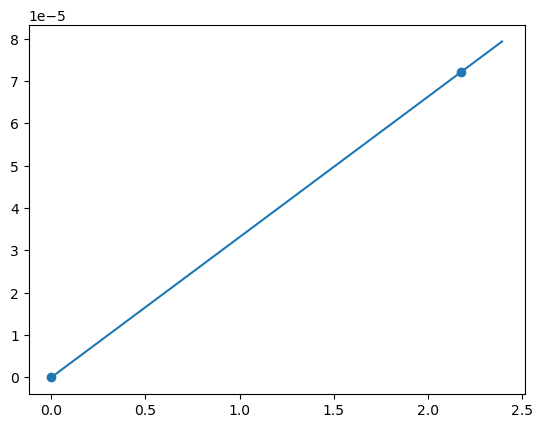

/Users/ssulheim/anaconda3/envs/pandas2/lib/python3.12/site-packages/scipy/optimize/_minpack_py.py:1010: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


M3 Galactose ALANINE -0.0006857539612952402 inf inf


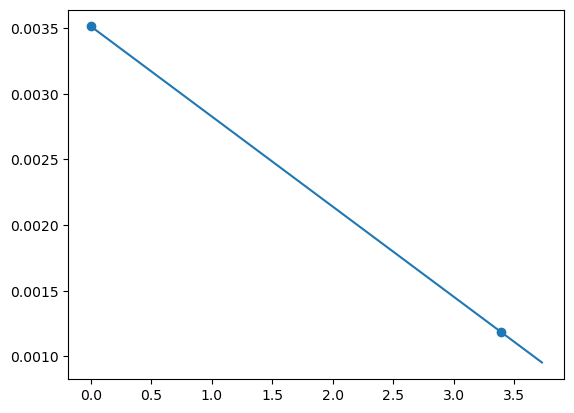

/Users/ssulheim/anaconda3/envs/pandas2/lib/python3.12/site-packages/scipy/optimize/_minpack_py.py:1010: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


M3 Galactose CREATINE 5.297187251104676e-08 4.902960548699274e-07 9.255781070749972


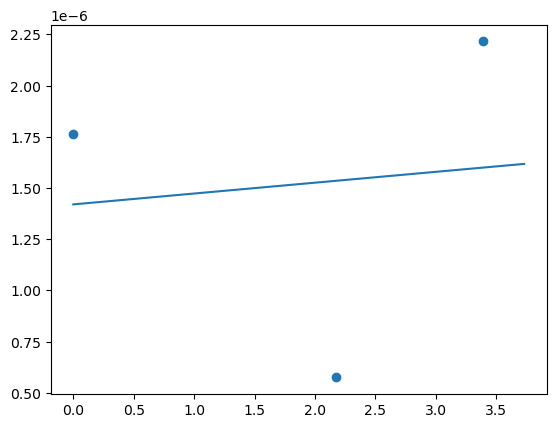

M3 Galactose ALPHA-AMINOADIPATE 1.3253744705371253e-05 inf inf


/Users/ssulheim/anaconda3/envs/pandas2/lib/python3.12/site-packages/scipy/optimize/_minpack_py.py:1010: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


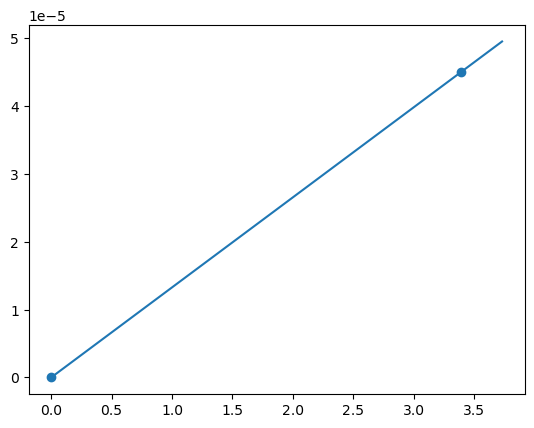

/Users/ssulheim/anaconda3/envs/pandas2/lib/python3.12/site-packages/scipy/optimize/_minpack_py.py:1010: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


M3 Galactose GLUTAMINE 1.6705104540987283e-05 inf inf


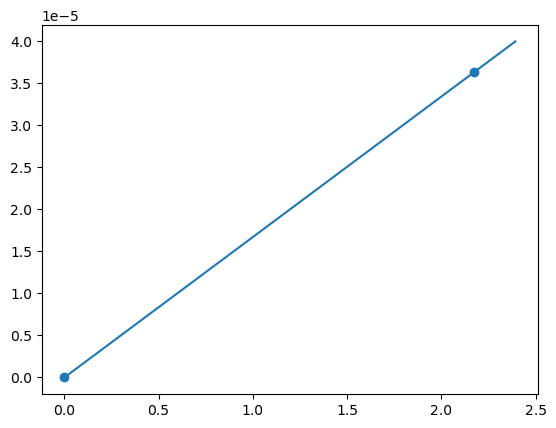

M3 Galactose GLUTAMATE 0.004996685187694806 0.0005870244856682169 0.11748278380912718


/Users/ssulheim/anaconda3/envs/pandas2/lib/python3.12/site-packages/scipy/optimize/_minpack_py.py:1010: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


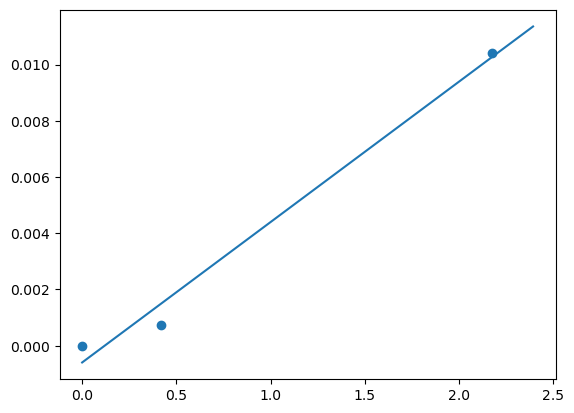

/Users/ssulheim/anaconda3/envs/pandas2/lib/python3.12/site-packages/scipy/optimize/_minpack_py.py:1010: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


M3 Galactose ASPARAGINE nan nan nan


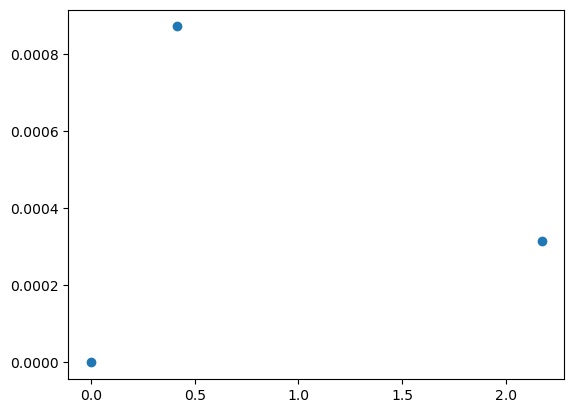

/Users/ssulheim/anaconda3/envs/pandas2/lib/python3.12/site-packages/scipy/optimize/_minpack_py.py:1010: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


M3 Galactose ASPARTATE 0.0001693510264669816 1.2396762536930401e-05 0.07320157896620366


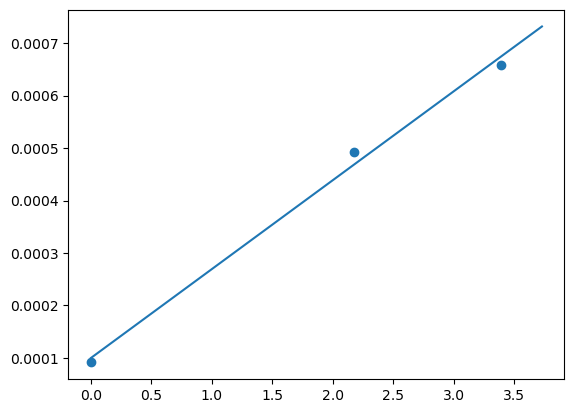

/Users/ssulheim/anaconda3/envs/pandas2/lib/python3.12/site-packages/scipy/optimize/_minpack_py.py:1010: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


M3 Galactose LYSINE 0.0001638372137058139 inf inf


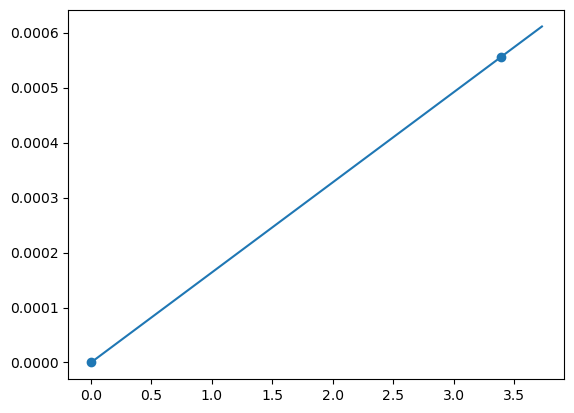

/Users/ssulheim/anaconda3/envs/pandas2/lib/python3.12/site-packages/scipy/optimize/_minpack_py.py:1010: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


M3 Galactose LACTATE -0.0005920570704232713 0.0005554987072867061 0.938251960895545


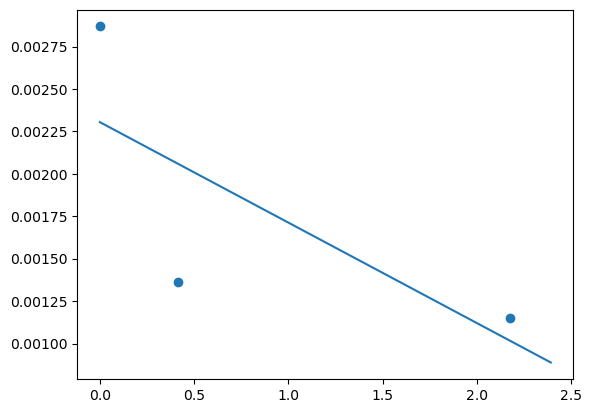

/Users/ssulheim/anaconda3/envs/pandas2/lib/python3.12/site-packages/scipy/optimize/_minpack_py.py:1010: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


M3 Galactose HEXOSES including Glucose and Fructose -4.2398931580035635 1.5245350532605988 0.35956921470597997


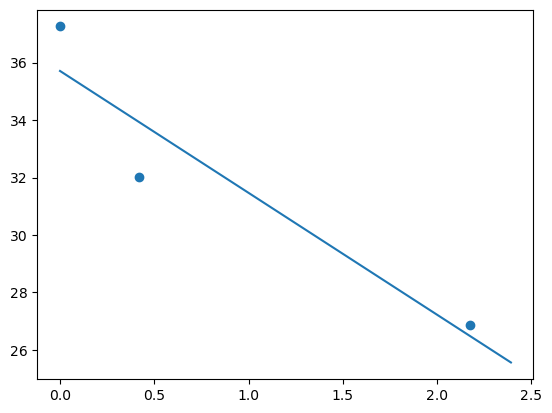

/Users/ssulheim/anaconda3/envs/pandas2/lib/python3.12/site-packages/scipy/optimize/_minpack_py.py:1010: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


M3 Galactose NAD nan nan nan


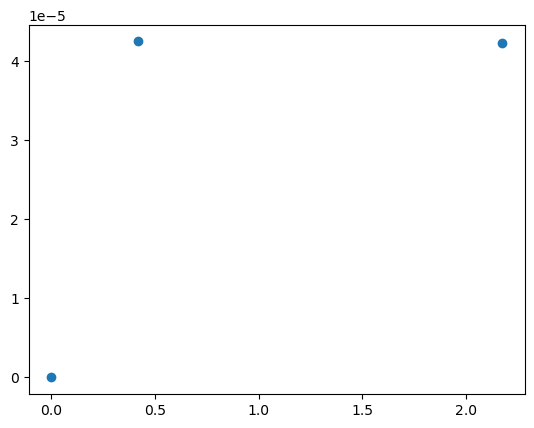

/Users/ssulheim/anaconda3/envs/pandas2/lib/python3.12/site-packages/scipy/optimize/_minpack_py.py:1010: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


M3 Galactose SUCCINATE 0.03103491586091463 0.005935757629225374 0.19126063224488604


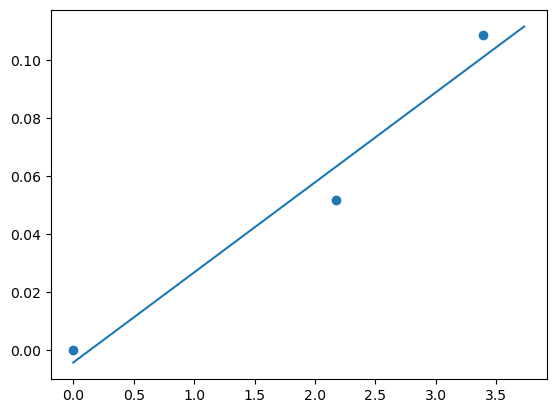

M3 Galactose CIS-ACONITATE 9.32431246814258e-05 6.9679547454650716e-06 0.07472888504403694


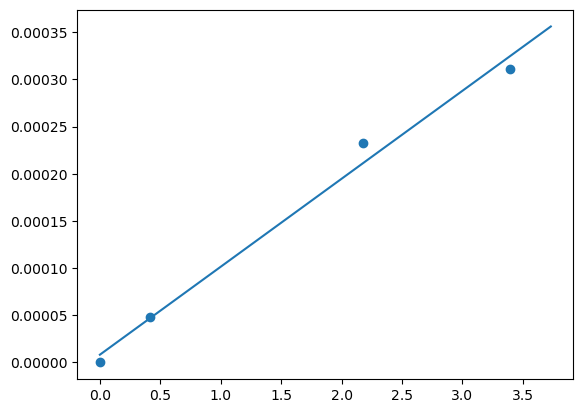

/Users/ssulheim/anaconda3/envs/pandas2/lib/python3.12/site-packages/scipy/optimize/_minpack_py.py:1010: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


M3 Galactose ISOCITRATE 2.223464020454447e-05 inf inf


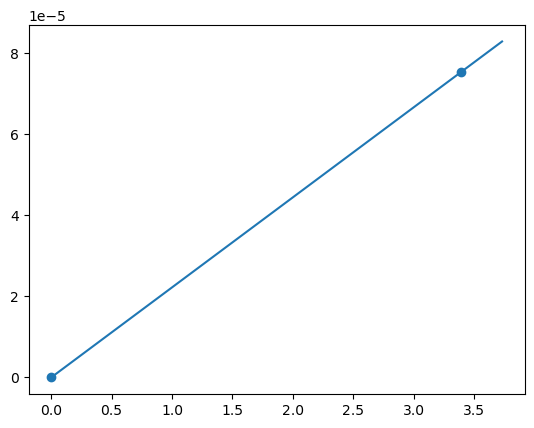

M3 Galactose TRANS-ACONITATE 4.312364060082335e-06 2.8848740537616344e-07 0.06689773900273517


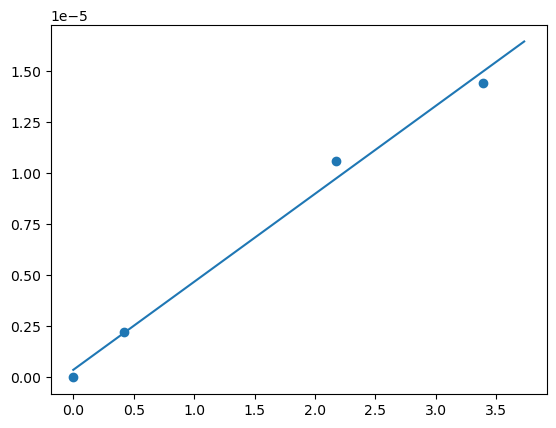

/Users/ssulheim/anaconda3/envs/pandas2/lib/python3.12/site-packages/scipy/optimize/_minpack_py.py:1010: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


M5 L-malate ISOLEUCINE nan nan nan


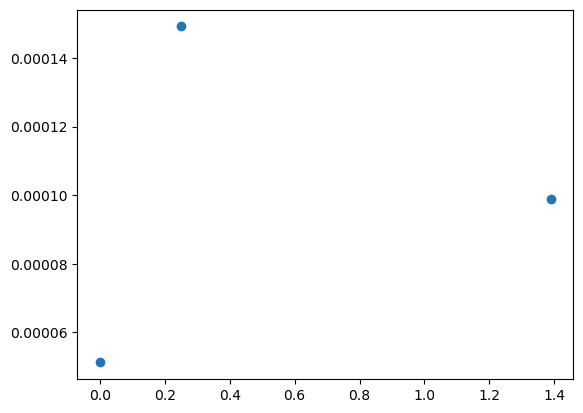

M5 L-malate METHIONINE 6.531412109609924e-05 1.5485777547732287e-05 0.23709692923751438


/Users/ssulheim/anaconda3/envs/pandas2/lib/python3.12/site-packages/scipy/optimize/_minpack_py.py:1010: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


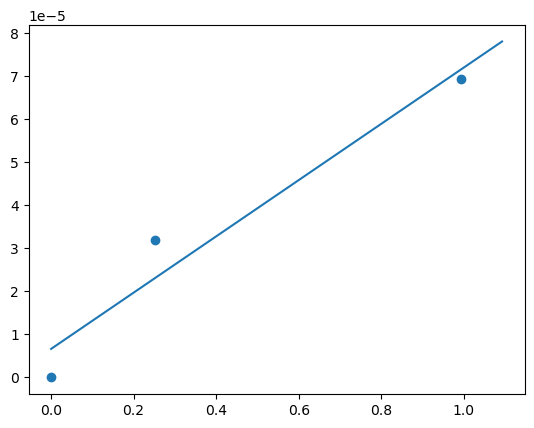

/Users/ssulheim/anaconda3/envs/pandas2/lib/python3.12/site-packages/scipy/optimize/_minpack_py.py:1010: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


M5 L-malate GAMMA-AMINOBUTYRATE 0.0016187063069687594 0.000465563573231833 0.2876146038521726


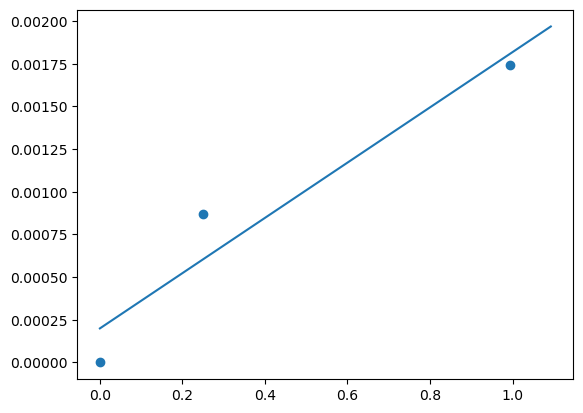

M5 L-malate PROLINE -1.8079333547853048e-05 1.248862193392633e-05 0.6907678261961916


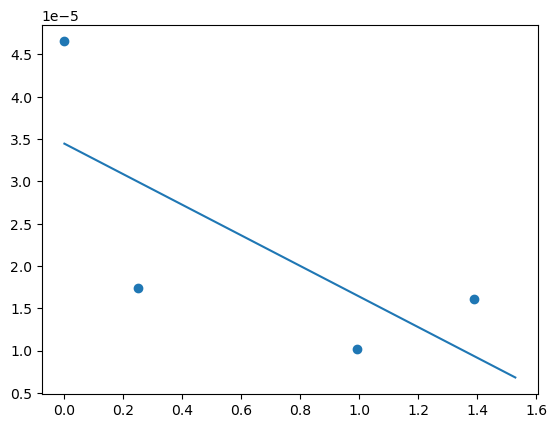

/Users/ssulheim/anaconda3/envs/pandas2/lib/python3.12/site-packages/scipy/optimize/_minpack_py.py:1010: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


M5 L-malate TYROSINE 6.868467660596074e-06 inf inf


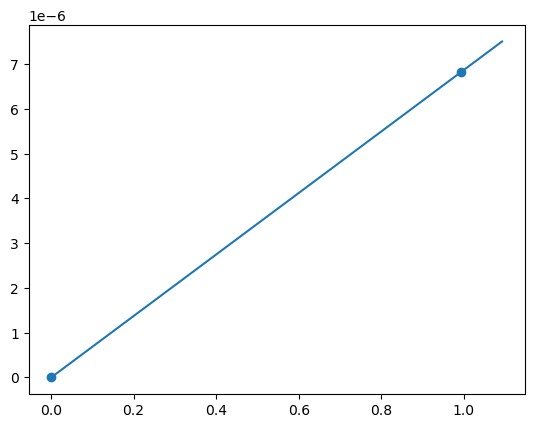

/Users/ssulheim/anaconda3/envs/pandas2/lib/python3.12/site-packages/scipy/optimize/_minpack_py.py:1010: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


M5 L-malate PIPECOLIC ACID 1.5023006899133352e-05 7.829754427934035e-07 0.05211842396468391


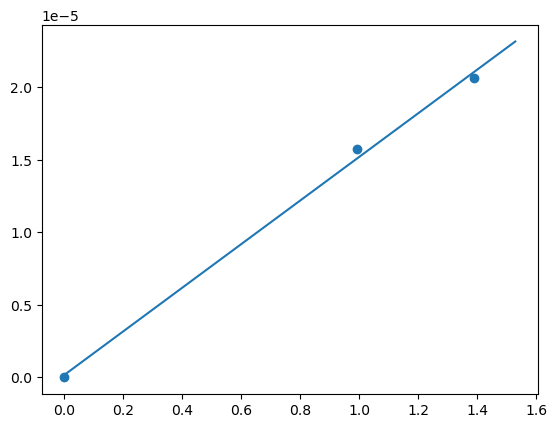

M5 L-malate BETA-ALANINE 0.00014663108880773497 1.3674873958009638e-05 0.09326039975015361


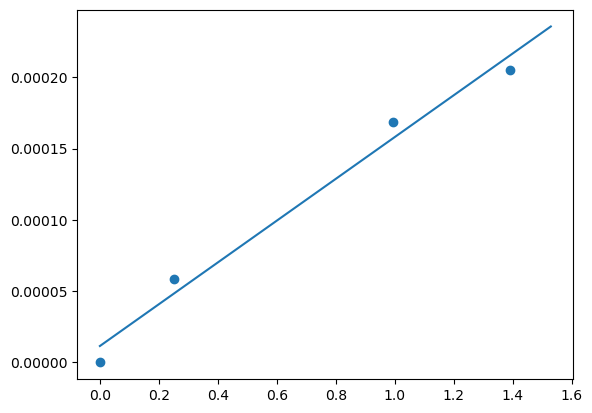

M5 L-malate ALANINE -0.0024966130317736084 inf inf


/Users/ssulheim/anaconda3/envs/pandas2/lib/python3.12/site-packages/scipy/optimize/_minpack_py.py:1010: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


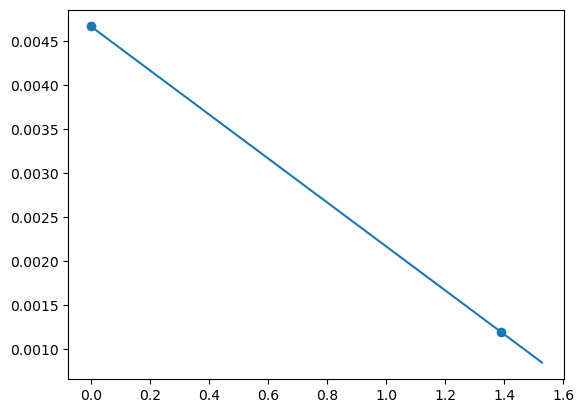

M5 L-malate CREATINE 7.567969439369165e-07 inf inf


/Users/ssulheim/anaconda3/envs/pandas2/lib/python3.12/site-packages/scipy/optimize/_minpack_py.py:1010: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


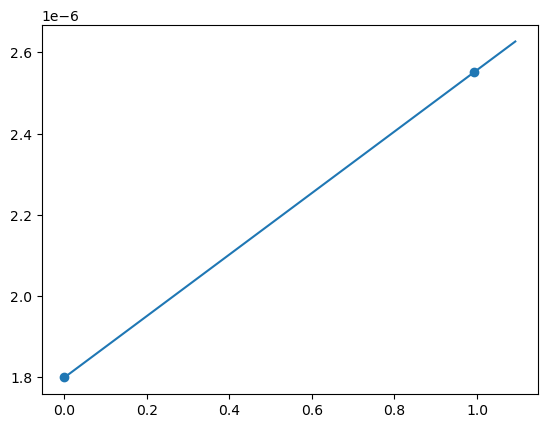

/Users/ssulheim/anaconda3/envs/pandas2/lib/python3.12/site-packages/scipy/optimize/_minpack_py.py:1010: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


M5 L-malate ALPHA-AMINOADIPATE 1.0955637263748447e-05 7.864133112810826e-06 0.7178161273039566


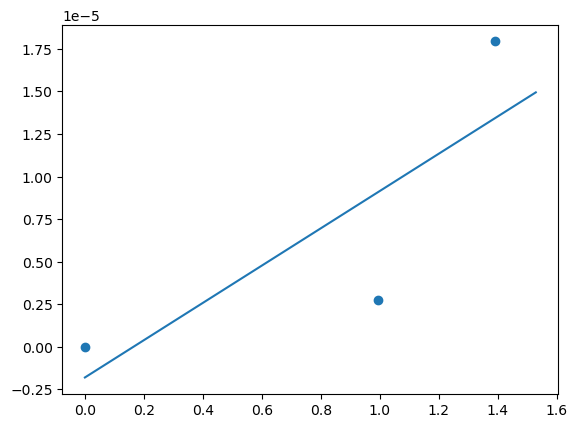

M5 L-malate GLUTAMINE 8.359376121009307e-05 2.4805856908946904e-05 0.29674292135992386


/Users/ssulheim/anaconda3/envs/pandas2/lib/python3.12/site-packages/scipy/optimize/_minpack_py.py:1010: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


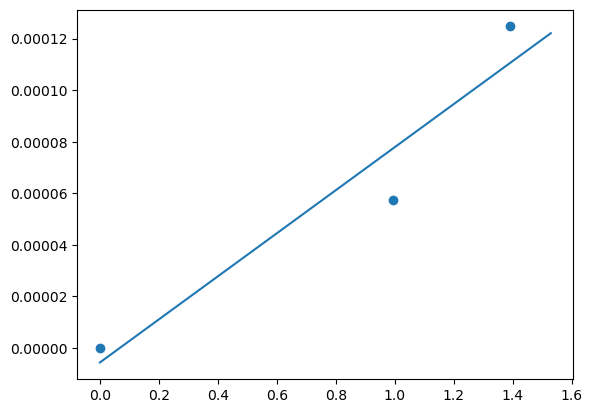

/Users/ssulheim/anaconda3/envs/pandas2/lib/python3.12/site-packages/scipy/optimize/_minpack_py.py:1010: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


M5 L-malate GLUTAMATE 0.0052636608753808675 0.0035533810881287556 0.6750778920330122


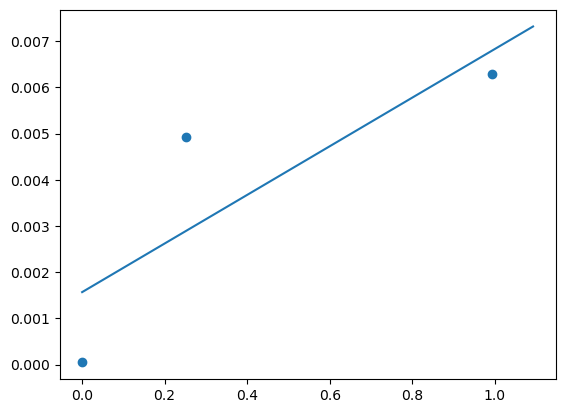

/Users/ssulheim/anaconda3/envs/pandas2/lib/python3.12/site-packages/scipy/optimize/_minpack_py.py:1010: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


M5 L-malate ASPARAGINE 0.00039599931083616493 1.2077506781149729e-05 0.03049880757531546


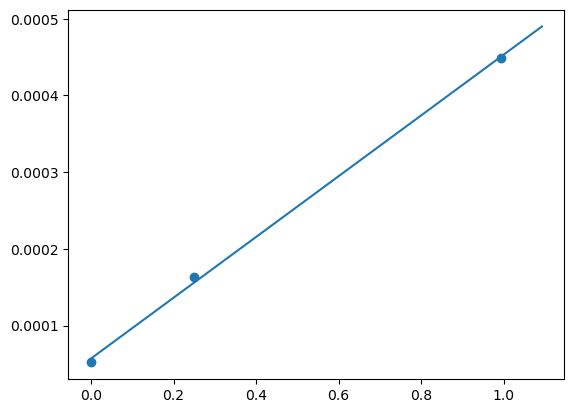

/Users/ssulheim/anaconda3/envs/pandas2/lib/python3.12/site-packages/scipy/optimize/_minpack_py.py:1010: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


M5 L-malate ASPARTATE 0.005199377794459895 0.0045404955473425015 0.873276712490588


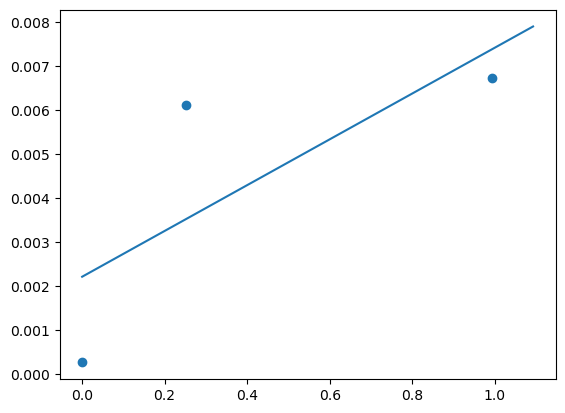

/Users/ssulheim/anaconda3/envs/pandas2/lib/python3.12/site-packages/scipy/optimize/_minpack_py.py:1010: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


M5 L-malate LYSINE 5.540233989425954e-05 inf inf


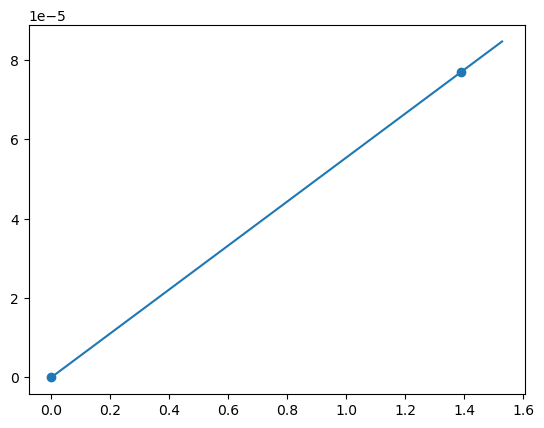

/Users/ssulheim/anaconda3/envs/pandas2/lib/python3.12/site-packages/scipy/optimize/_minpack_py.py:1010: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


M5 L-malate PYRUVATE 0.12003472919117775 0.07491886136018704 0.6241432114272923


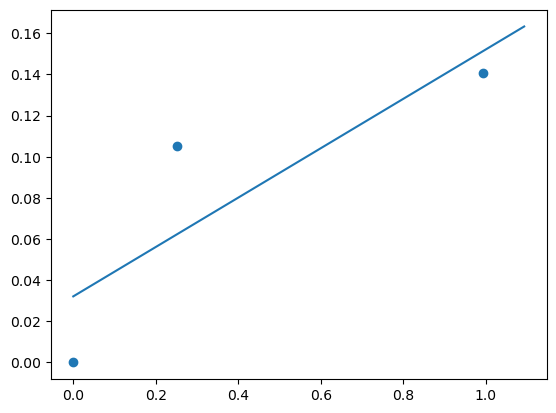

/Users/ssulheim/anaconda3/envs/pandas2/lib/python3.12/site-packages/scipy/optimize/_minpack_py.py:1010: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


M5 L-malate LACTATE -0.008698737755477881 inf inf


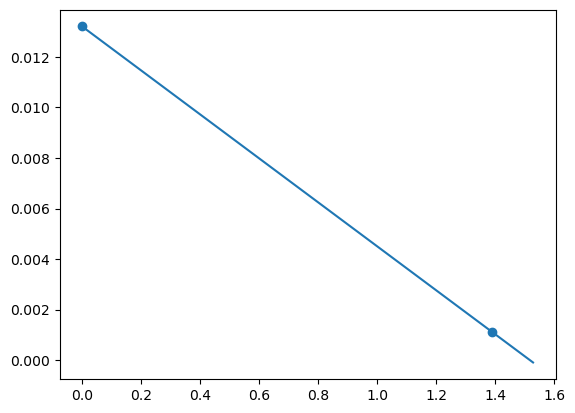

/Users/ssulheim/anaconda3/envs/pandas2/lib/python3.12/site-packages/scipy/optimize/_minpack_py.py:1010: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


M5 L-malate NAD 4.2223413855507006e-05 1.2052939376990749e-05 0.285456297262869


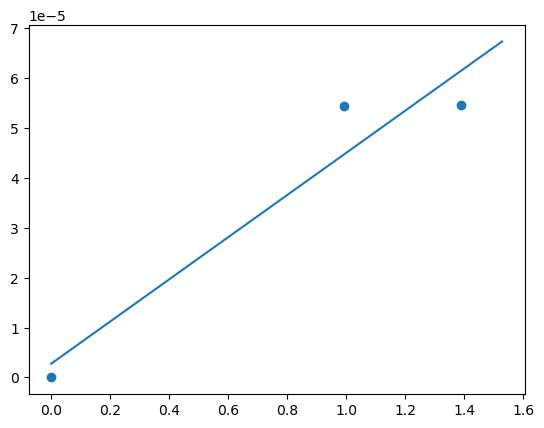

M5 L-malate GLUTARATE nan nan nan


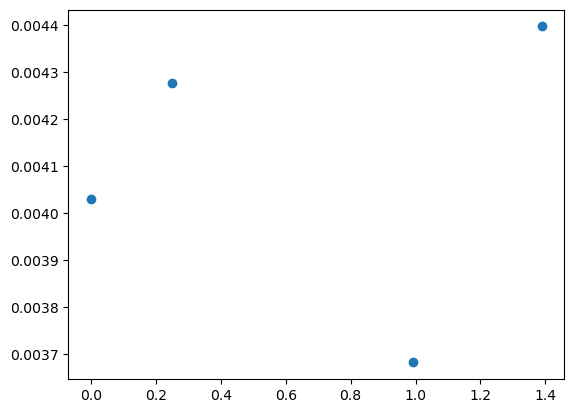

/Users/ssulheim/anaconda3/envs/pandas2/lib/python3.12/site-packages/scipy/optimize/_minpack_py.py:1010: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


M5 L-malate SUCCINATE -0.464182319986439 0.28299727315225454 0.6096683586753633


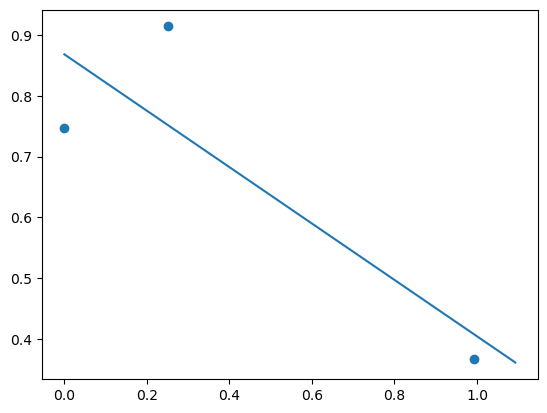

M5 L-malate CIS-ACONITATE 0.00045180848369544513 6.351027576518064e-05 0.1405690199655295


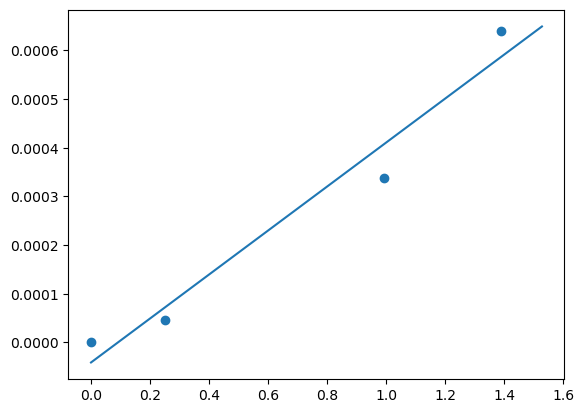

/Users/ssulheim/anaconda3/envs/pandas2/lib/python3.12/site-packages/scipy/optimize/_minpack_py.py:1010: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


M5 L-malate CITRATE 0.016968095029251933 inf inf


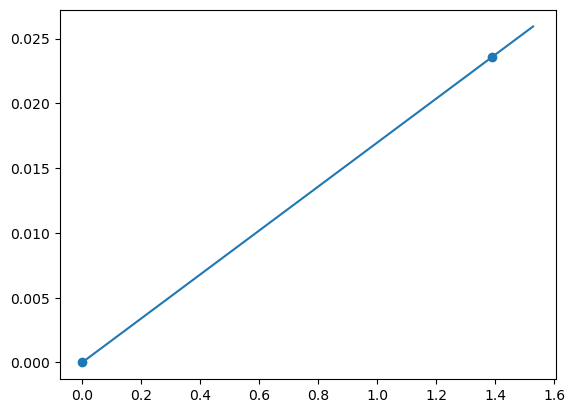

M5 L-malate ISOCITRATE 0.00032155434378262714 0.0002580229172154469 0.8024239827712359


/Users/ssulheim/anaconda3/envs/pandas2/lib/python3.12/site-packages/scipy/optimize/_minpack_py.py:1010: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


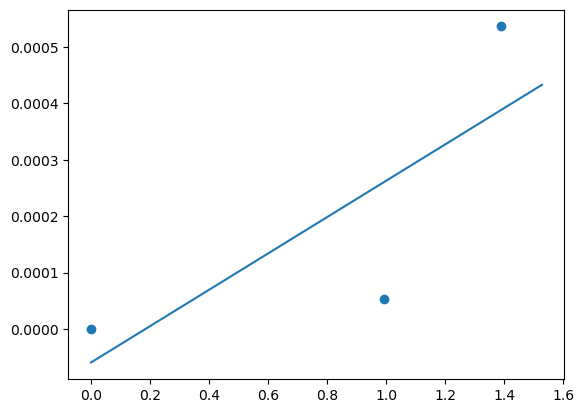

/Users/ssulheim/anaconda3/envs/pandas2/lib/python3.12/site-packages/scipy/optimize/_minpack_py.py:1010: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


M5 L-malate TRANS-ACONITATE 1.0144299943158042e-05 2.7295683214238755e-06 0.2690740944883899


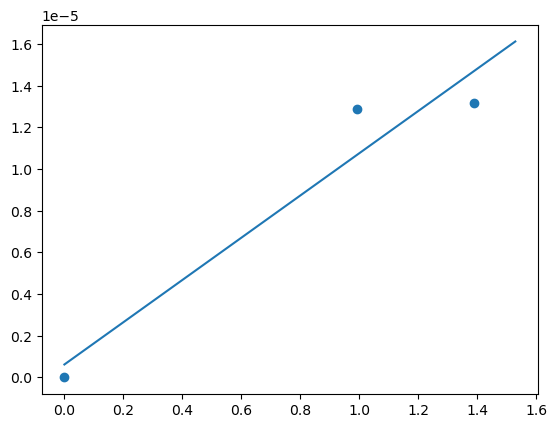

M6 L-malate PHENYLALANINE nan nan nan


/Users/ssulheim/anaconda3/envs/pandas2/lib/python3.12/site-packages/scipy/optimize/_minpack_py.py:1010: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


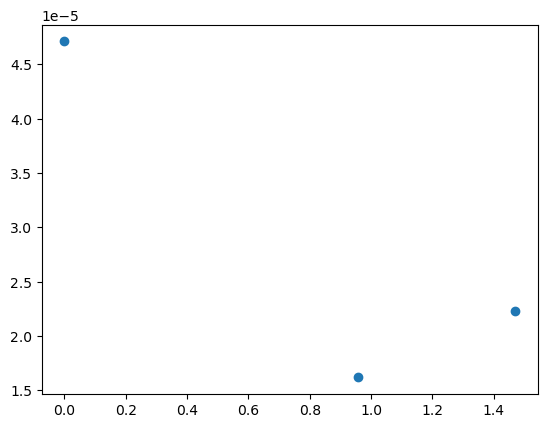

/Users/ssulheim/anaconda3/envs/pandas2/lib/python3.12/site-packages/scipy/optimize/_minpack_py.py:1010: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


M6 L-malate LEUCINE 7.221432413633437e-05 inf inf


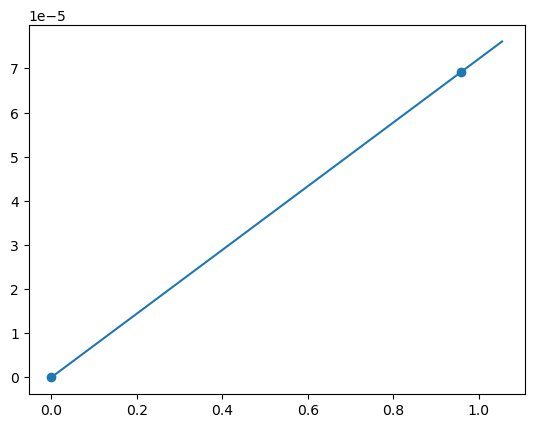

/Users/ssulheim/anaconda3/envs/pandas2/lib/python3.12/site-packages/scipy/optimize/_minpack_py.py:1010: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


M6 L-malate ISOLEUCINE 4.476141067292168e-05 inf inf


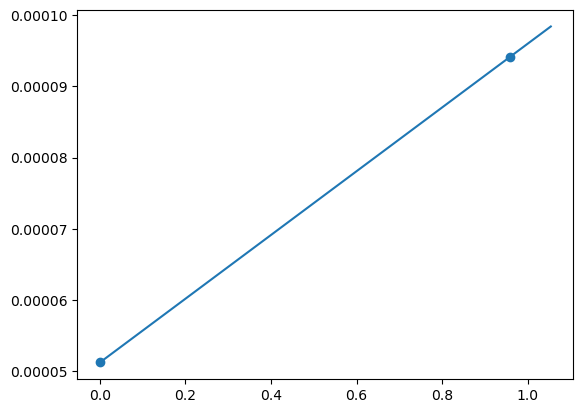

M6 L-malate METHIONINE 3.885877143893093e-05 7.964025512101746e-06 0.2049479491295222


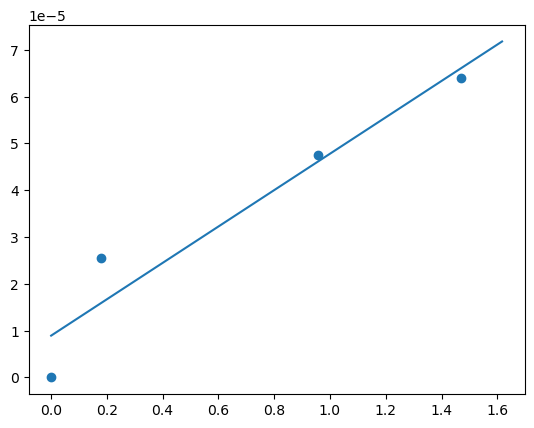

/Users/ssulheim/anaconda3/envs/pandas2/lib/python3.12/site-packages/scipy/optimize/_minpack_py.py:1010: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


M6 L-malate GAMMA-AMINOBUTYRATE nan nan nan


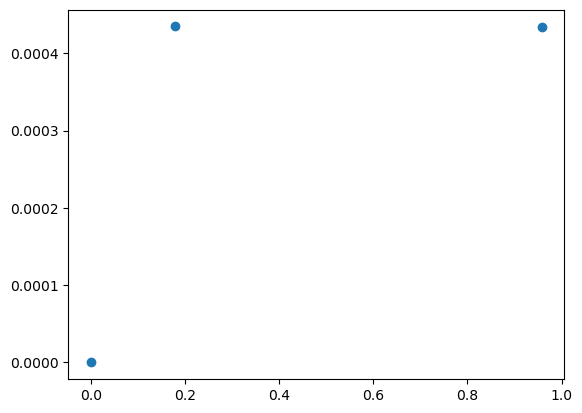

/Users/ssulheim/anaconda3/envs/pandas2/lib/python3.12/site-packages/scipy/optimize/_minpack_py.py:1010: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


M6 L-malate PROLINE -2.195264990485171e-05 inf inf


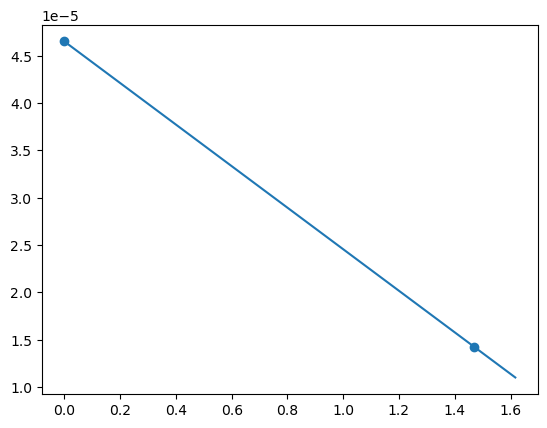

/Users/ssulheim/anaconda3/envs/pandas2/lib/python3.12/site-packages/scipy/optimize/_minpack_py.py:1010: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


M6 L-malate PIPECOLIC ACID 8.981463493183831e-06 2.728878804784906e-06 0.30383453730629684


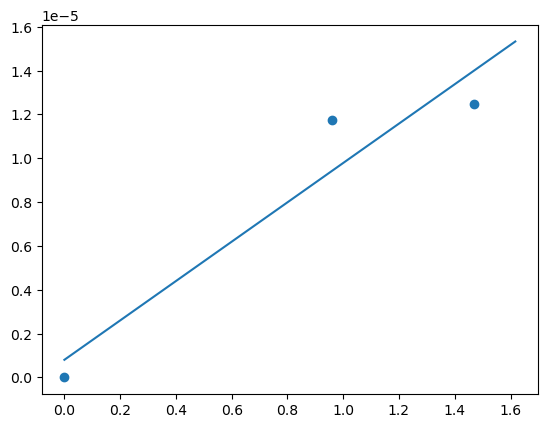

M6 L-malate BETA-ALANINE 0.00011273119261321761 1.1385358811316214e-05 0.10099563880584096


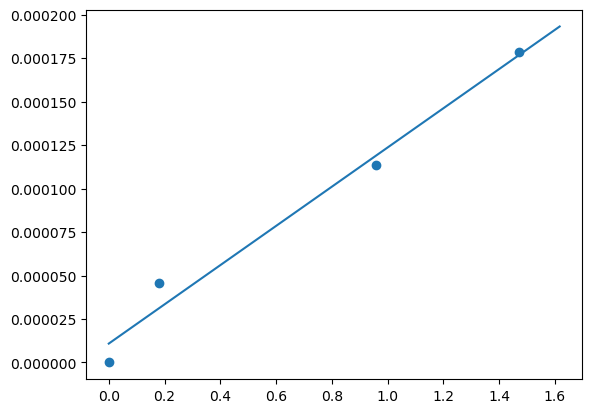

/Users/ssulheim/anaconda3/envs/pandas2/lib/python3.12/site-packages/scipy/optimize/_minpack_py.py:1010: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


M6 L-malate CREATINE -2.5485914325921856e-07 inf inf


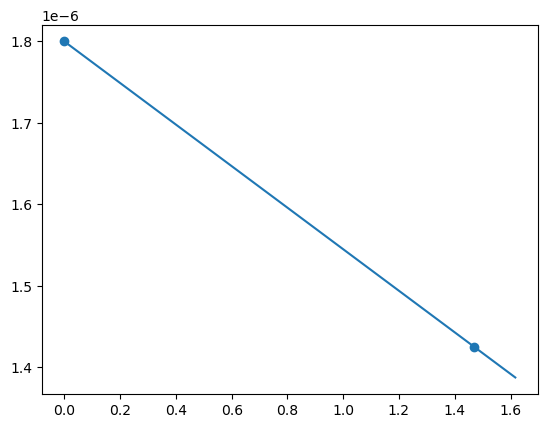

/Users/ssulheim/anaconda3/envs/pandas2/lib/python3.12/site-packages/scipy/optimize/_minpack_py.py:1010: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


M6 L-malate ALPHA-AMINOADIPATE 3.592308764863914e-05 9.115327110059817e-06 0.2537456467889427


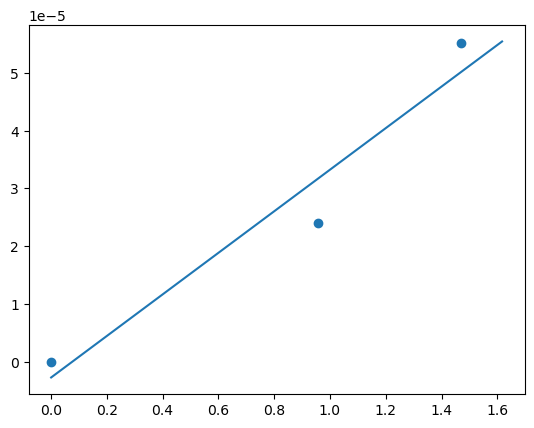

M6 L-malate GLUTAMATE 0.004152712742662007 0.0013274499572558916 0.31965850746636487


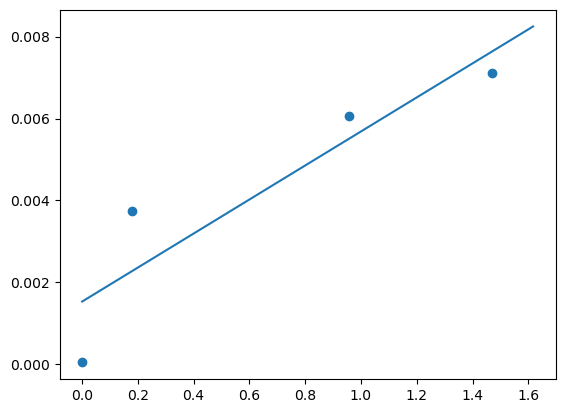

M6 L-malate ASPARAGINE 0.0002108087012207973 0.00010575787614001218 0.501676996858129


/Users/ssulheim/anaconda3/envs/pandas2/lib/python3.12/site-packages/scipy/optimize/_minpack_py.py:1010: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


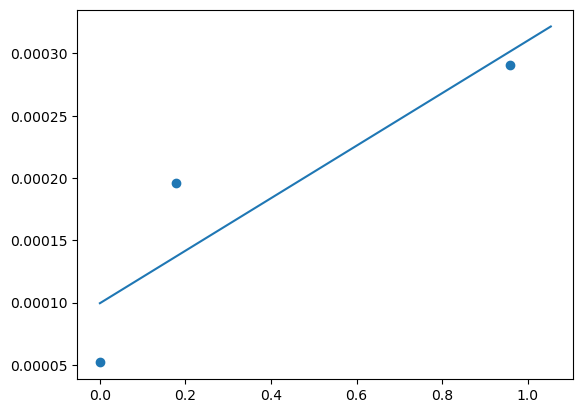

/Users/ssulheim/anaconda3/envs/pandas2/lib/python3.12/site-packages/scipy/optimize/_minpack_py.py:1010: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


M6 L-malate ASPARTATE 0.0053849876294429725 0.006210366476691719 1.1532740470443985


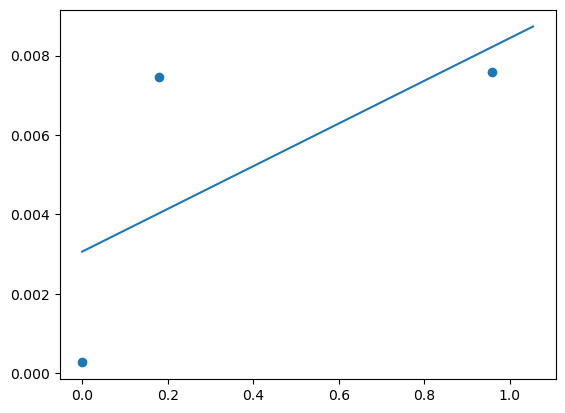

/Users/ssulheim/anaconda3/envs/pandas2/lib/python3.12/site-packages/scipy/optimize/_minpack_py.py:1010: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


M6 L-malate PYRUVATE 0.29087592687061464 0.012062654028846287 0.04147010087298118


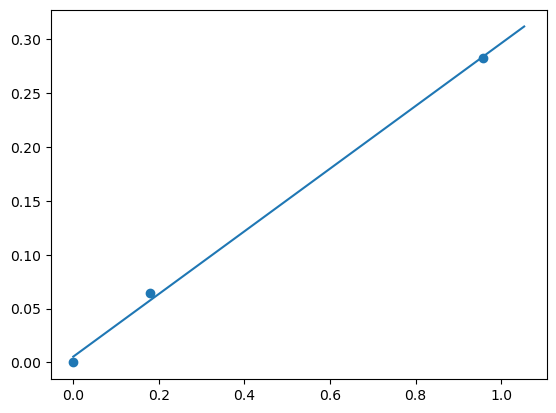

M6 L-malate LACTATE nan nan nan


/Users/ssulheim/anaconda3/envs/pandas2/lib/python3.12/site-packages/scipy/optimize/_minpack_py.py:1010: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


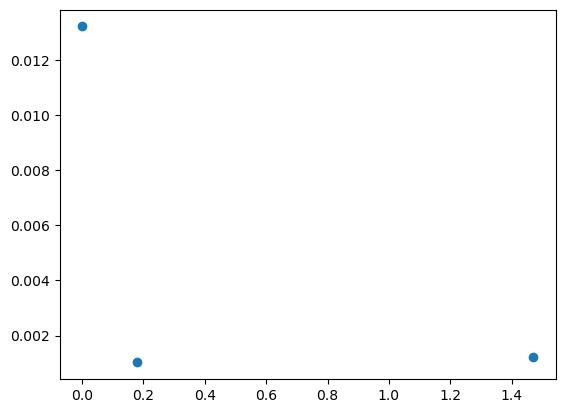

/Users/ssulheim/anaconda3/envs/pandas2/lib/python3.12/site-packages/scipy/optimize/_minpack_py.py:1010: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


M6 L-malate NAD nan nan nan


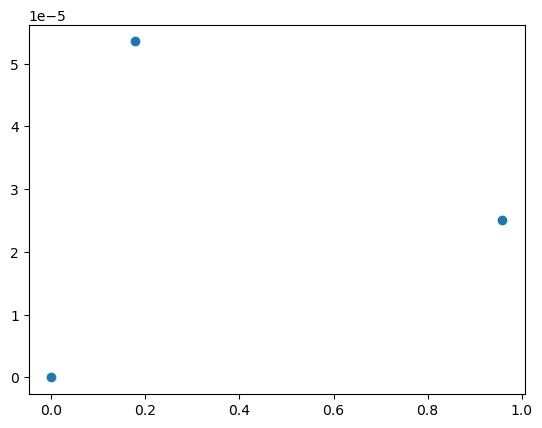

/Users/ssulheim/anaconda3/envs/pandas2/lib/python3.12/site-packages/scipy/optimize/_minpack_py.py:1010: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


M6 L-malate GLUTARATE nan nan nan


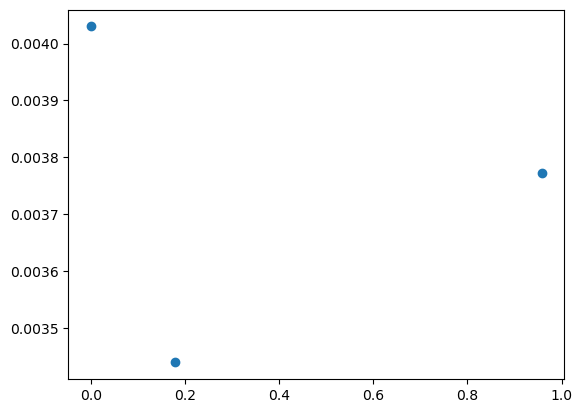

M6 L-malate SUCCINATE nan nan nan


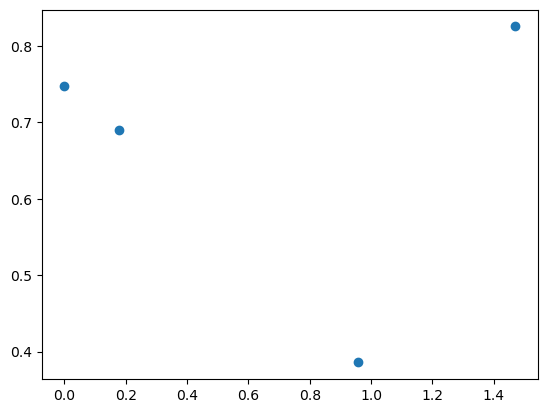

M6 L-malate CIS-ACONITATE 0.00037268975981924875 1.940549973347478e-05 0.05206877630039065


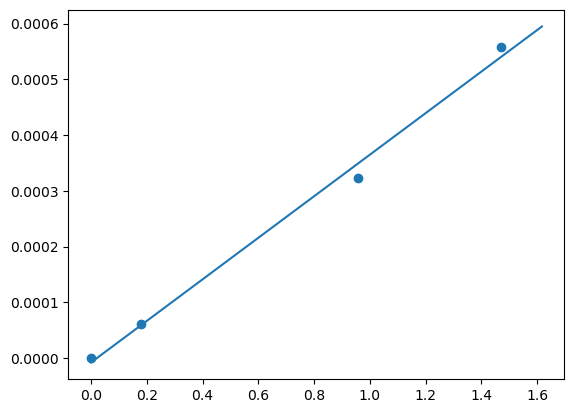

/Users/ssulheim/anaconda3/envs/pandas2/lib/python3.12/site-packages/scipy/optimize/_minpack_py.py:1010: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


M6 L-malate CITRATE 0.0035006826251090103 inf inf


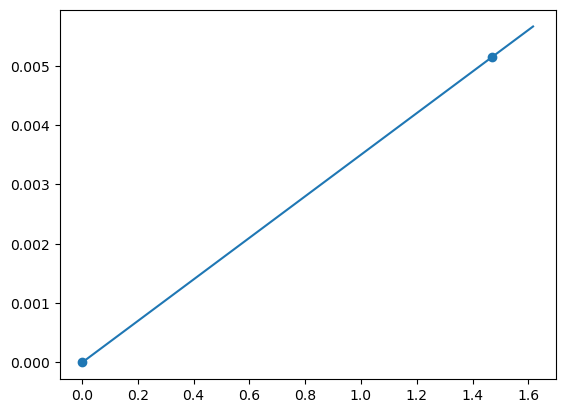

/Users/ssulheim/anaconda3/envs/pandas2/lib/python3.12/site-packages/scipy/optimize/_minpack_py.py:1010: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


M6 L-malate ISOCITRATE 0.0002873171755659889 0.00020858642467200532 0.7259796573633611


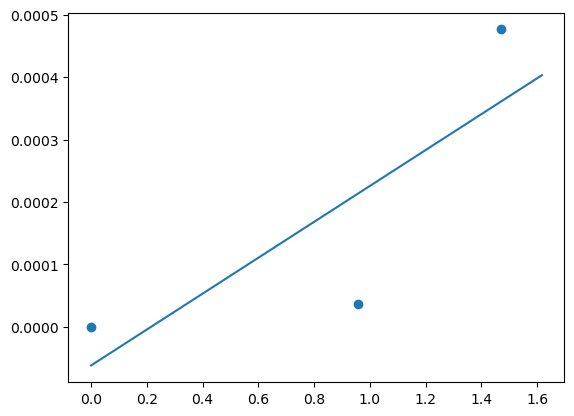

M6 L-malate TRANS-ACONITATE 1.2909712911764085e-05 3.2613999845540855e-06 0.2526314881551012


/Users/ssulheim/anaconda3/envs/pandas2/lib/python3.12/site-packages/scipy/optimize/_minpack_py.py:1010: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


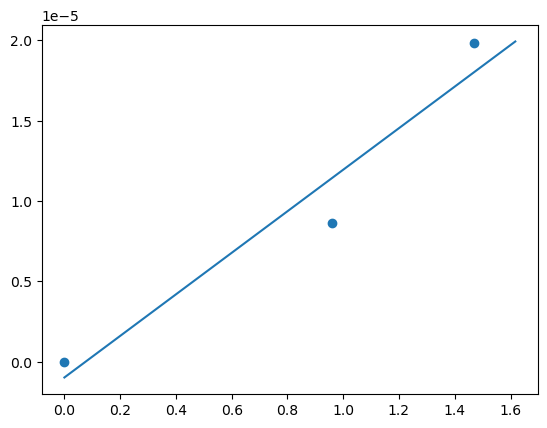

M7 L-malate PHENYLALANINE nan nan nan


/Users/ssulheim/anaconda3/envs/pandas2/lib/python3.12/site-packages/scipy/optimize/_minpack_py.py:1010: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


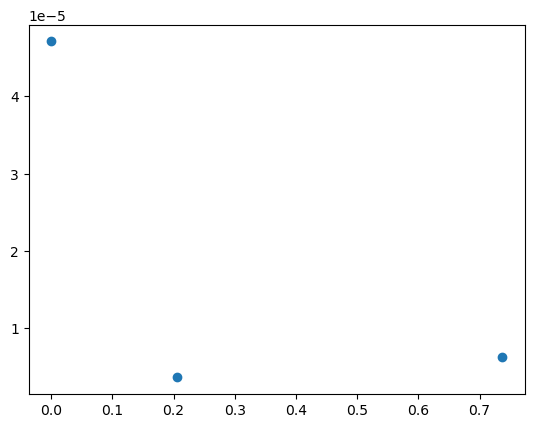

/Users/ssulheim/anaconda3/envs/pandas2/lib/python3.12/site-packages/scipy/optimize/_minpack_py.py:1010: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


M7 L-malate LEUCINE 7.058797434693795e-05 5.0679929574123435e-06 0.07179683231173765


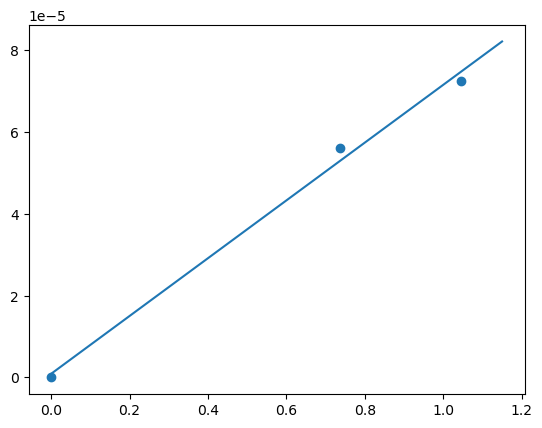

/Users/ssulheim/anaconda3/envs/pandas2/lib/python3.12/site-packages/scipy/optimize/_minpack_py.py:1010: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


M7 L-malate ISOLEUCINE nan nan nan


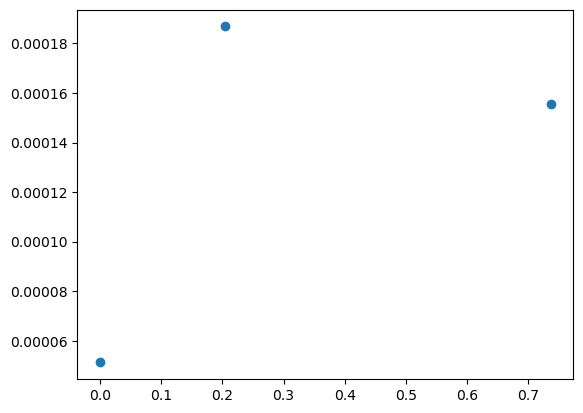

/Users/ssulheim/anaconda3/envs/pandas2/lib/python3.12/site-packages/scipy/optimize/_minpack_py.py:1010: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


M7 L-malate METHIONINE 2.7441839772136927e-05 1.4324706559602855e-05 0.5220024123217659


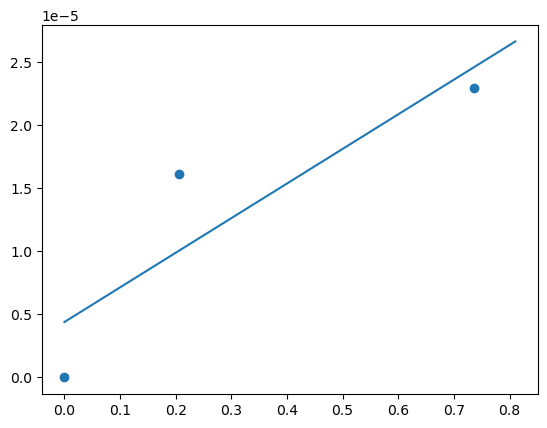

/Users/ssulheim/anaconda3/envs/pandas2/lib/python3.12/site-packages/scipy/optimize/_minpack_py.py:1010: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


M7 L-malate GAMMA-AMINOBUTYRATE 0.0022386921218991683 0.00024592126383580576 0.10985041731740286


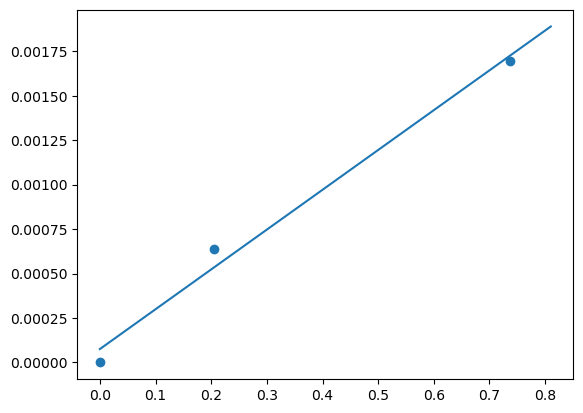

/Users/ssulheim/anaconda3/envs/pandas2/lib/python3.12/site-packages/scipy/optimize/_minpack_py.py:1010: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


M7 L-malate PROLINE -2.6079279134597515e-05 inf inf


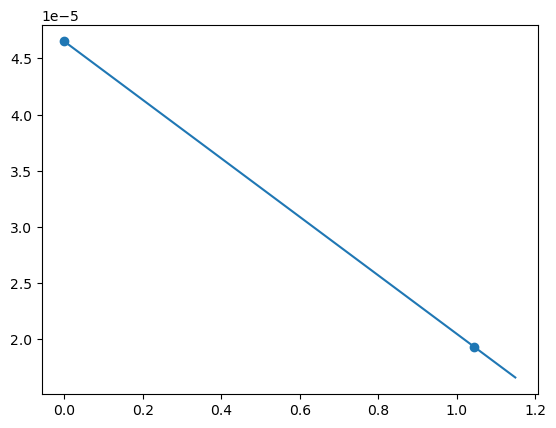

/Users/ssulheim/anaconda3/envs/pandas2/lib/python3.12/site-packages/scipy/optimize/_minpack_py.py:1010: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


M7 L-malate PIPECOLIC ACID 2.093816518141386e-05 1.034268154744821e-05 0.4939631270379449


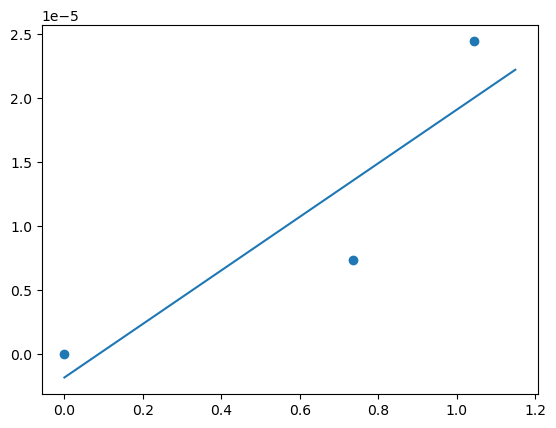

/Users/ssulheim/anaconda3/envs/pandas2/lib/python3.12/site-packages/scipy/optimize/_minpack_py.py:1010: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


M7 L-malate BETA-ALANINE 0.0005107974844827852 3.5026275074703134e-05 0.0685717454348262


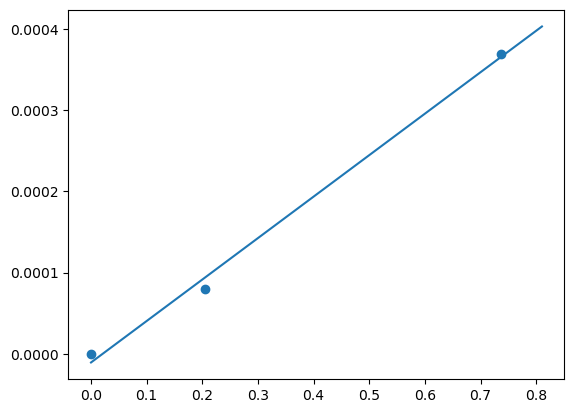

/Users/ssulheim/anaconda3/envs/pandas2/lib/python3.12/site-packages/scipy/optimize/_minpack_py.py:1010: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


M7 L-malate CREATINE -4.546045813876541e-07 inf inf


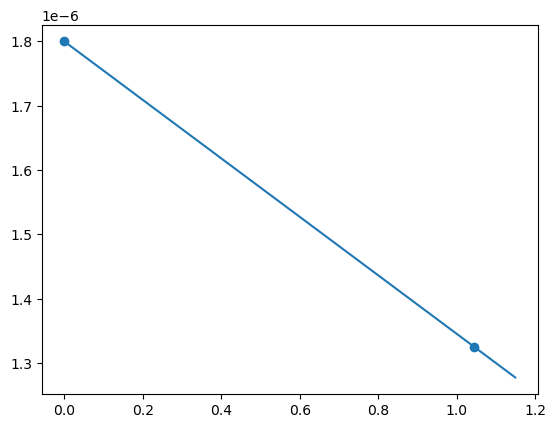

/Users/ssulheim/anaconda3/envs/pandas2/lib/python3.12/site-packages/scipy/optimize/_minpack_py.py:1010: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


M7 L-malate ALPHA-AMINOADIPATE 3.4286529411733714e-05 inf inf


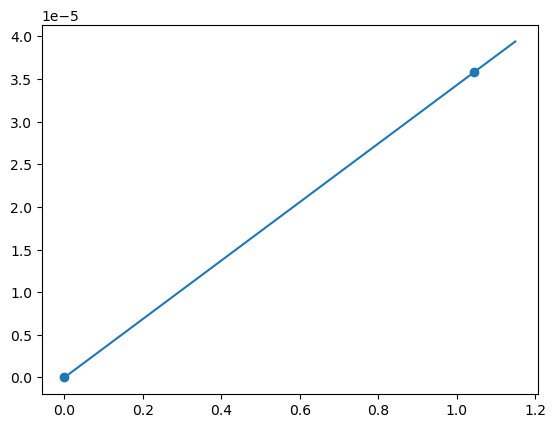

M7 L-malate GLUTAMATE nan nan nan


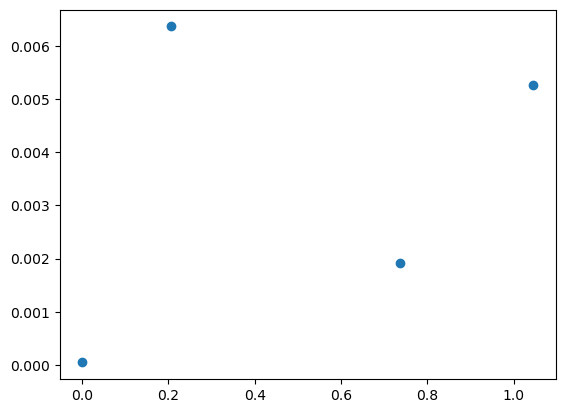

/Users/ssulheim/anaconda3/envs/pandas2/lib/python3.12/site-packages/scipy/optimize/_minpack_py.py:1010: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


M7 L-malate ASPARAGINE 0.00024046090084473836 8.214372102251672e-05 0.34160947053739754


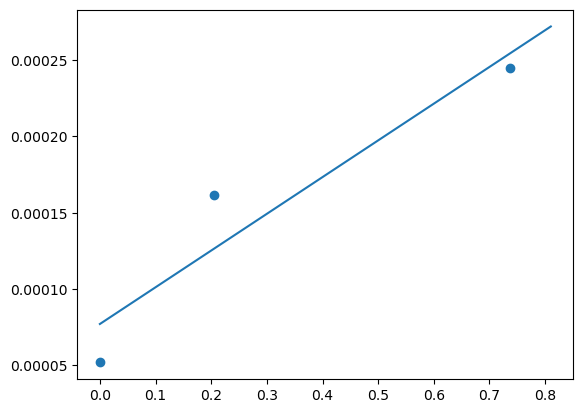

/Users/ssulheim/anaconda3/envs/pandas2/lib/python3.12/site-packages/scipy/optimize/_minpack_py.py:1010: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


M7 L-malate ASPARTATE nan nan nan


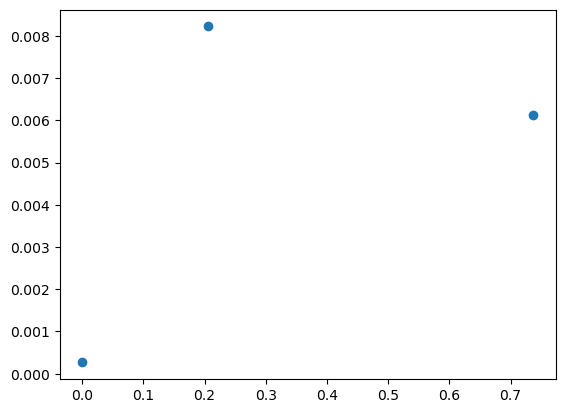

/Users/ssulheim/anaconda3/envs/pandas2/lib/python3.12/site-packages/scipy/optimize/_minpack_py.py:1010: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


M7 L-malate PYRUVATE 0.13606279489153317 0.05708755780857933 0.4195677286659334


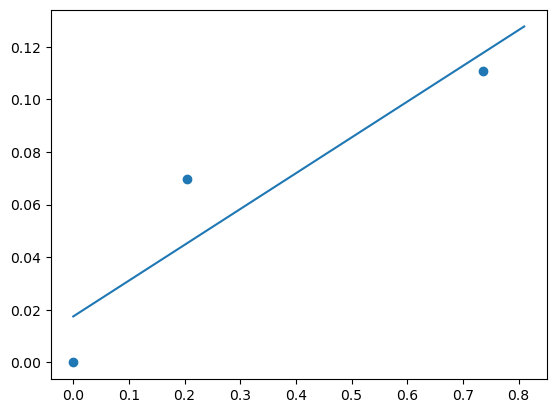

M7 L-malate LACTATE -0.011638334115209493 inf inf


/Users/ssulheim/anaconda3/envs/pandas2/lib/python3.12/site-packages/scipy/optimize/_minpack_py.py:1010: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


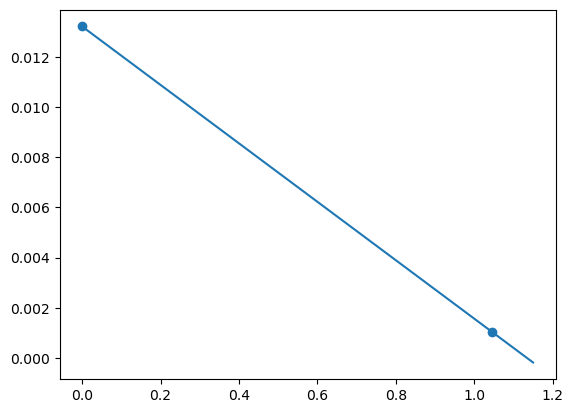

/Users/ssulheim/anaconda3/envs/pandas2/lib/python3.12/site-packages/scipy/optimize/_minpack_py.py:1010: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


M7 L-malate NAD 6.932914936856806e-05 inf inf


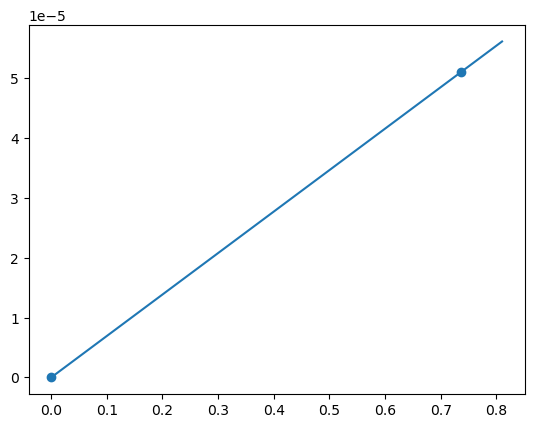

M7 L-malate GLUTARATE -0.0010086740971618395 0.00044521303366729125 0.4413844223025168


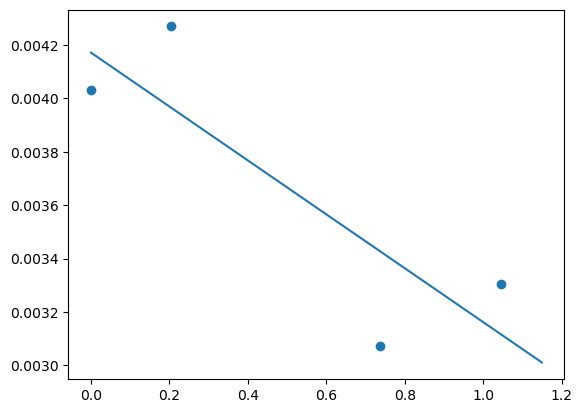

/Users/ssulheim/anaconda3/envs/pandas2/lib/python3.12/site-packages/scipy/optimize/_minpack_py.py:1010: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


M7 L-malate SUCCINATE nan nan nan


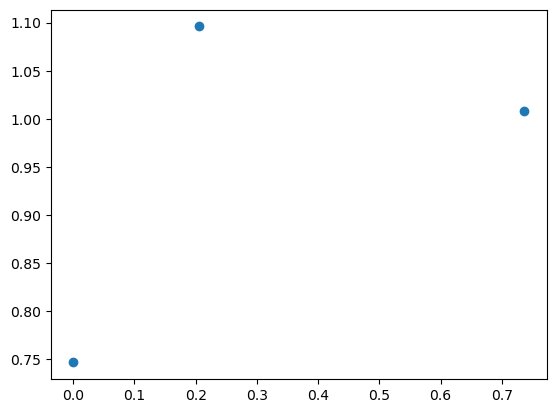

M7 L-malate CIS-ACONITATE 0.00046428631334858916 6.077597834873355e-05 0.1309019383112906


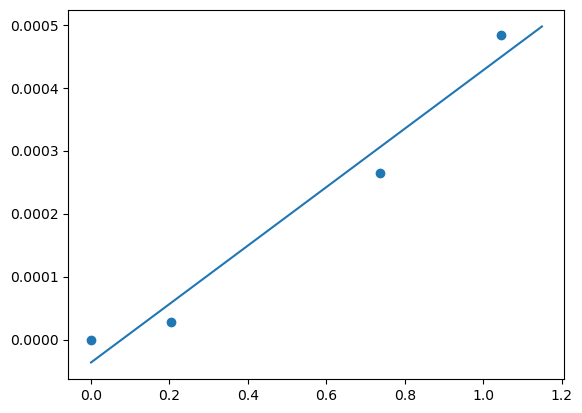

/Users/ssulheim/anaconda3/envs/pandas2/lib/python3.12/site-packages/scipy/optimize/_minpack_py.py:1010: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


M7 L-malate CITRATE 0.00010428178861152898 inf inf


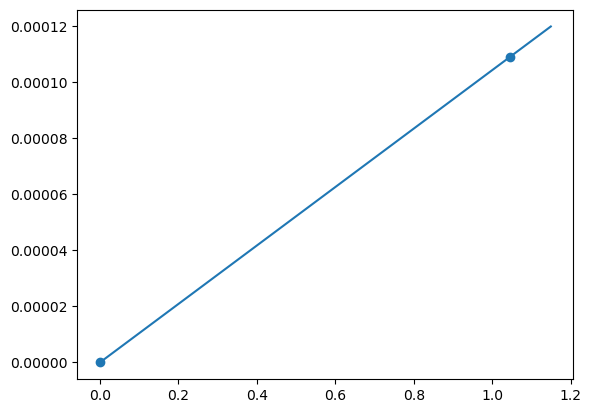

M7 L-malate ISOCITRATE 0.00014715585862307774 inf inf


/Users/ssulheim/anaconda3/envs/pandas2/lib/python3.12/site-packages/scipy/optimize/_minpack_py.py:1010: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


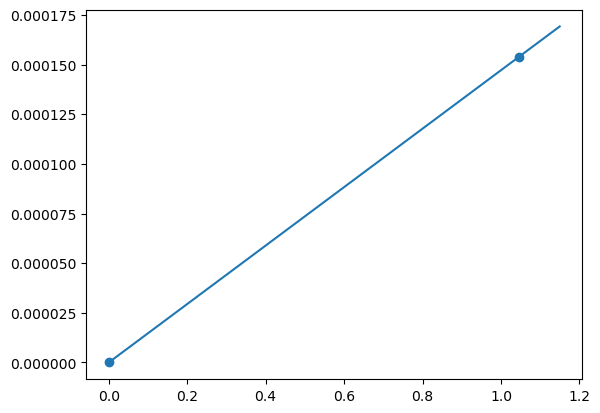

M7 L-malate TRANS-ACONITATE 1.321275498528574e-05 1.2918050050120026e-06 0.09776954211673561


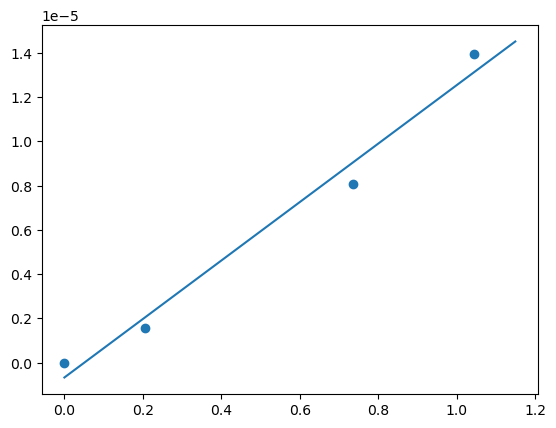

M9 L-alanine PHENYLALANINE 5.819647226824972e-06 7.079156960851191e-07 0.12164237255173575


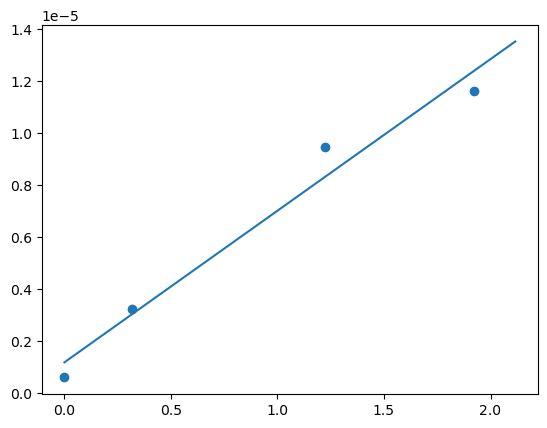

M9 L-alanine LEUCINE 0.0004431019475235015 0.0002693860133623456 0.6079549297130041


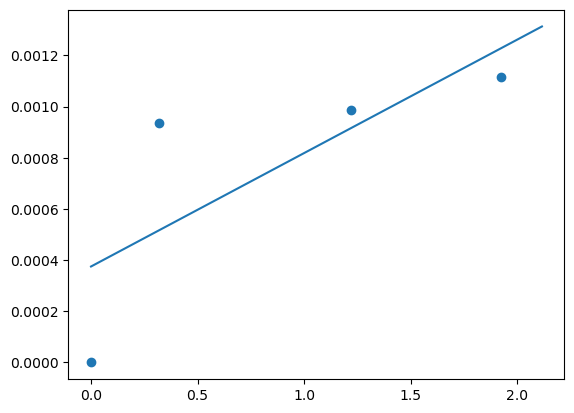

M9 L-alanine ISOLEUCINE 0.0008345480676046308 0.00010218254556050974 0.12244057535691158


/Users/ssulheim/anaconda3/envs/pandas2/lib/python3.12/site-packages/scipy/optimize/_minpack_py.py:1010: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


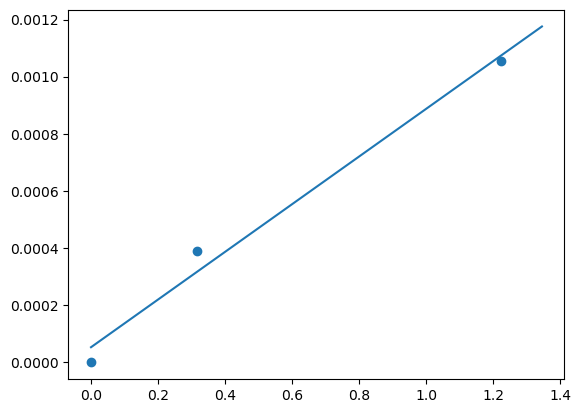

M9 L-alanine METHIONINE 1.1725140000878937e-05 6.662025714123552e-06 0.5681830420467606


/Users/ssulheim/anaconda3/envs/pandas2/lib/python3.12/site-packages/scipy/optimize/_minpack_py.py:1010: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


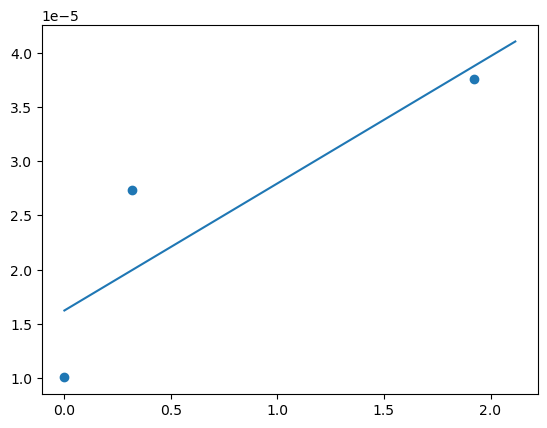

M9 L-alanine GAMMA-AMINOBUTYRATE 0.007653293340696602 0.00019915790401398345 0.0260225101989696


/Users/ssulheim/anaconda3/envs/pandas2/lib/python3.12/site-packages/scipy/optimize/_minpack_py.py:1010: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


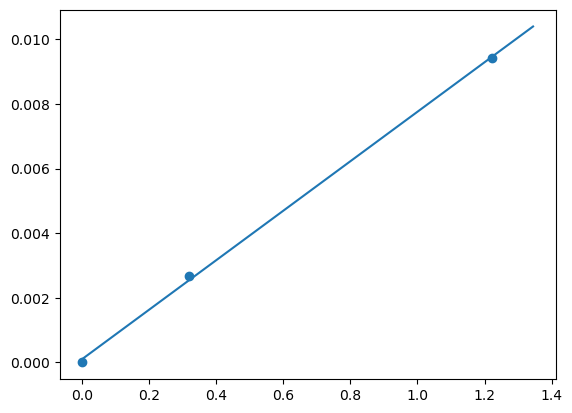

M9 L-alanine PROLINE 0.00039801638438777086 8.001979909706667e-05 0.20104649515912063


/Users/ssulheim/anaconda3/envs/pandas2/lib/python3.12/site-packages/scipy/optimize/_minpack_py.py:1010: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


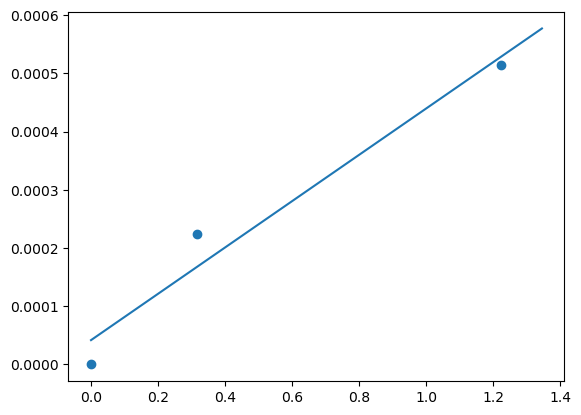

M9 L-alanine VALINE nan nan nan


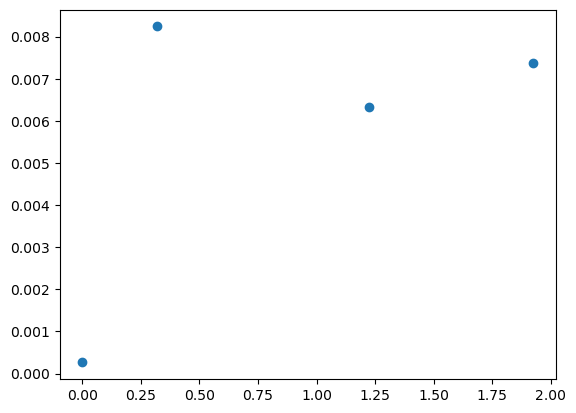

M9 L-alanine PIPECOLIC ACID 1.9715983170072018e-05 1.511692209004412e-06 0.07667343778722095


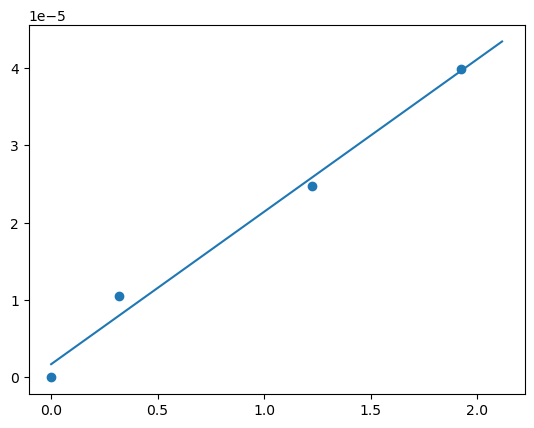

M9 L-alanine ALPHA-AMINOBUTYRATE 0.1719571259683955 0.03845616990711913 0.22363812892631796


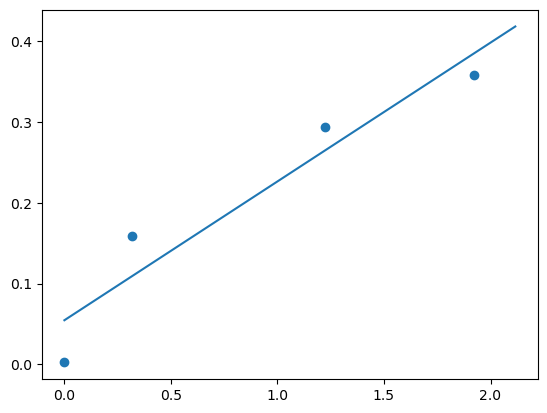

/Users/ssulheim/anaconda3/envs/pandas2/lib/python3.12/site-packages/scipy/optimize/_minpack_py.py:1010: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


M9 L-alanine BETA-ALANINE 0.00043693818085084997 2.1221066090505704e-05 0.048567662476146876


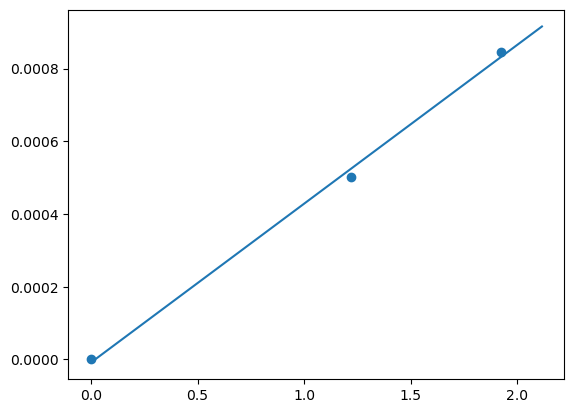

M9 L-alanine ALANINE -19.350783975073533 0.3634970360574844 0.018784615472206112


/Users/ssulheim/anaconda3/envs/pandas2/lib/python3.12/site-packages/scipy/optimize/_minpack_py.py:1010: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


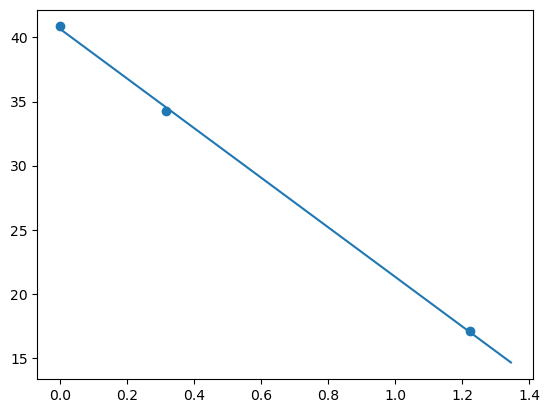

M9 L-alanine CREATINE 1.5923774928204108e-06 5.794718406435569e-07 0.36390356134536883


/Users/ssulheim/anaconda3/envs/pandas2/lib/python3.12/site-packages/scipy/optimize/_minpack_py.py:1010: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


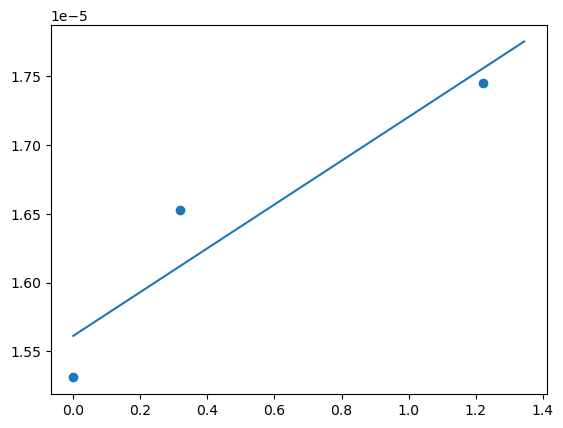

M9 L-alanine ALPHA-AMINOADIPATE 8.512594715424331e-05 inf inf


/Users/ssulheim/anaconda3/envs/pandas2/lib/python3.12/site-packages/scipy/optimize/_minpack_py.py:1010: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


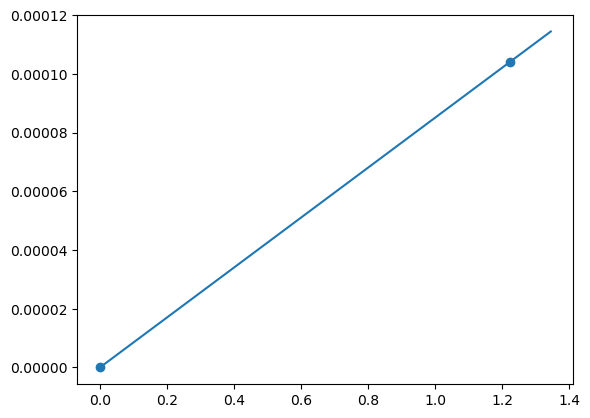

/Users/ssulheim/anaconda3/envs/pandas2/lib/python3.12/site-packages/scipy/optimize/_minpack_py.py:1010: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


M9 L-alanine GLYCINE 0.048459505821553055 0.012644533692029145 0.26092989347830514


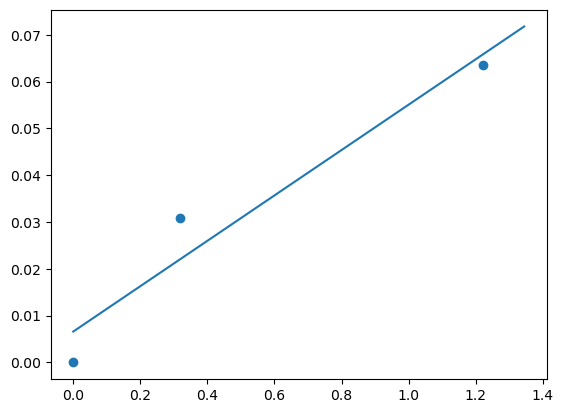

/Users/ssulheim/anaconda3/envs/pandas2/lib/python3.12/site-packages/scipy/optimize/_minpack_py.py:1010: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


M9 L-alanine GLUTAMINE 1.9700666591905363e-05 inf inf


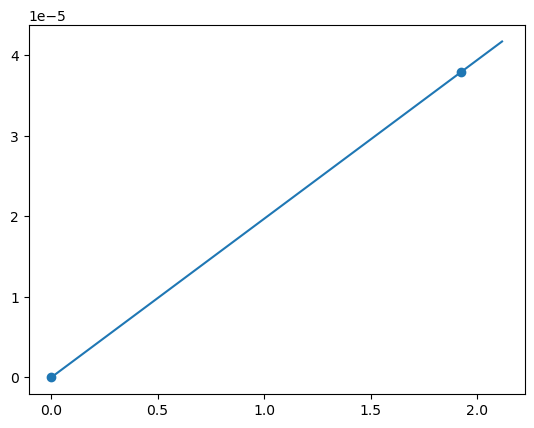

M9 L-alanine GLUTAMATE 0.0016505540175051343 0.0008492025045888295 0.5144954334014626


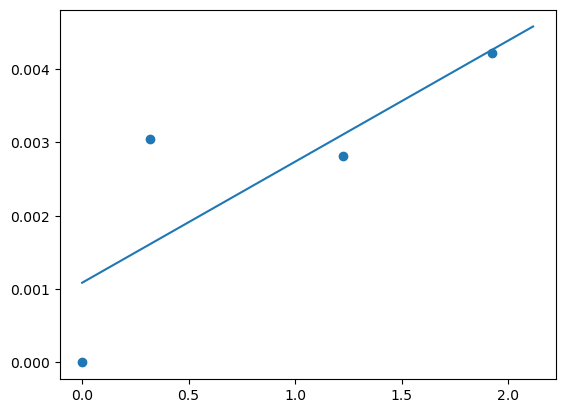

M9 L-alanine SERINE 0.0005142642836483128 0.00010503916114133095 0.2042513246227372


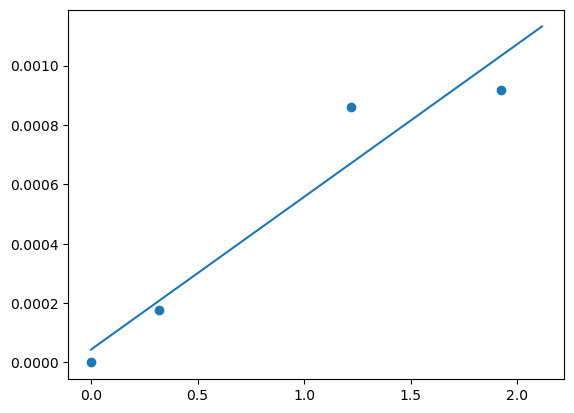

/Users/ssulheim/anaconda3/envs/pandas2/lib/python3.12/site-packages/scipy/optimize/_minpack_py.py:1010: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


M9 L-alanine ASPARAGINE 0.006835407572571941 0.004002043645743444 0.5854872007635977


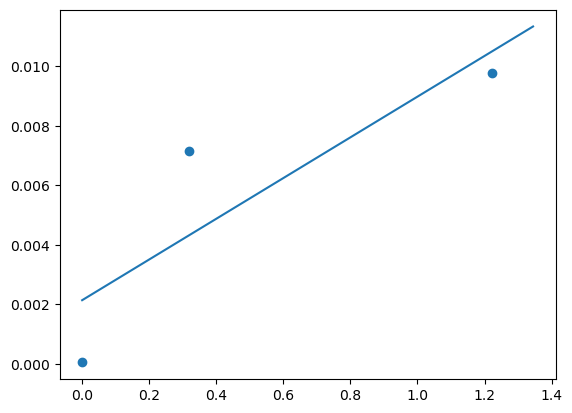

/Users/ssulheim/anaconda3/envs/pandas2/lib/python3.12/site-packages/scipy/optimize/_minpack_py.py:1010: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


M9 L-alanine ASPARTATE 0.00010568546777750785 8.831276082456923e-05 0.835618772208946


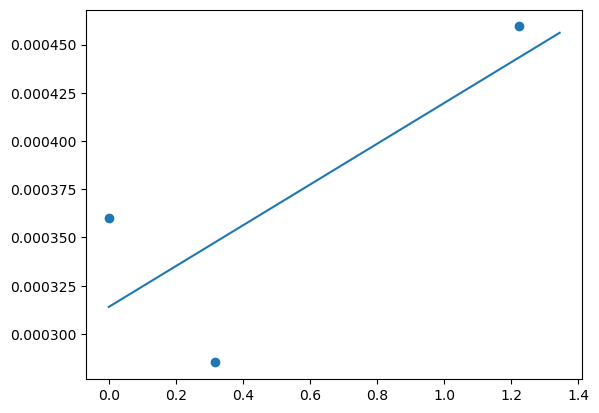

M9 L-alanine LYSINE nan nan nan


/Users/ssulheim/anaconda3/envs/pandas2/lib/python3.12/site-packages/scipy/optimize/_minpack_py.py:1010: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


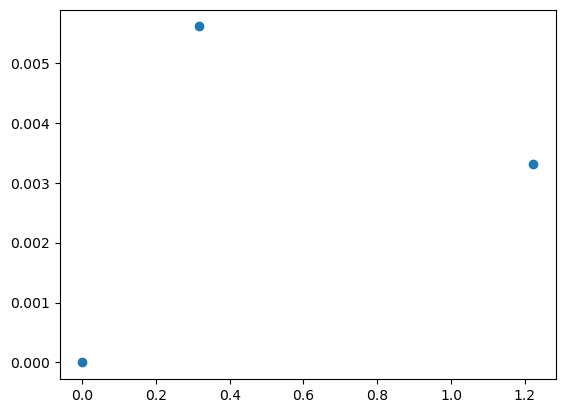

M9 L-alanine PYRUVATE 0.0015494455896480804 0.0012824345930459403 0.8276732023466631


/Users/ssulheim/anaconda3/envs/pandas2/lib/python3.12/site-packages/scipy/optimize/_minpack_py.py:1010: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


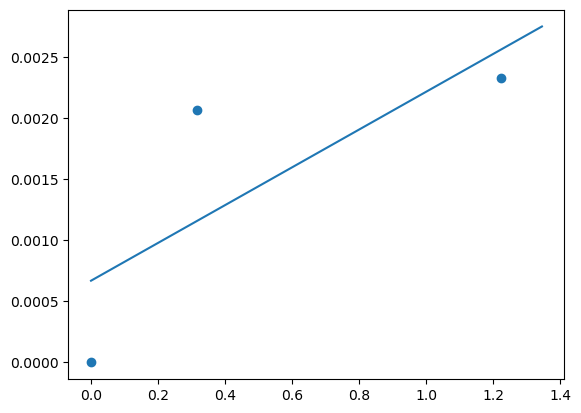

/Users/ssulheim/anaconda3/envs/pandas2/lib/python3.12/site-packages/scipy/optimize/_minpack_py.py:1010: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


M9 L-alanine LACTATE 0.0007595078700513063 0.00040328419795145374 0.5309809336461663


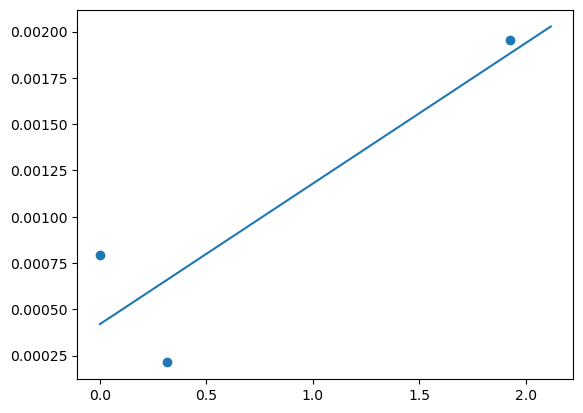

/Users/ssulheim/anaconda3/envs/pandas2/lib/python3.12/site-packages/scipy/optimize/_minpack_py.py:1010: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


M9 L-alanine NAD 6.142219942677481e-05 1.4692791002546892e-05 0.23920978310233051


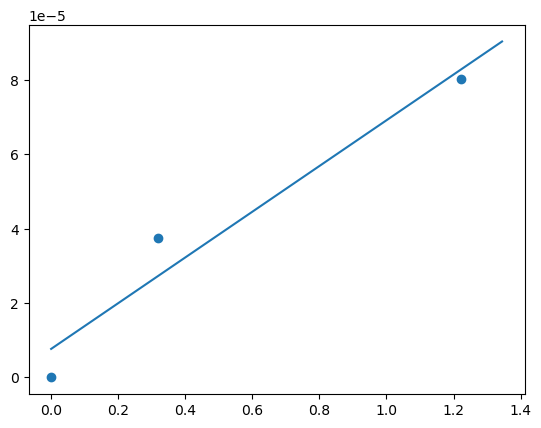

/Users/ssulheim/anaconda3/envs/pandas2/lib/python3.12/site-packages/scipy/optimize/_minpack_py.py:1010: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


M9 L-alanine SUCCINATE 0.003588355111544148 0.0004807779599435946 0.1339828263922032


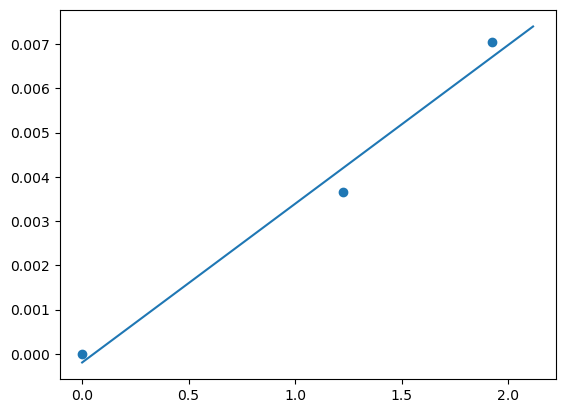

M9 L-alanine CIS-ACONITATE 0.000775348159883001 0.00018531026759293197 0.23900265349297412


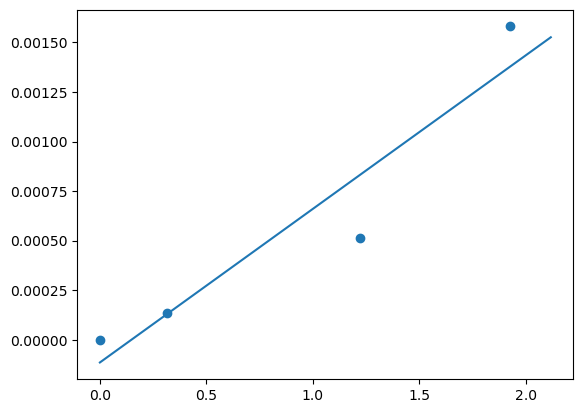

/Users/ssulheim/anaconda3/envs/pandas2/lib/python3.12/site-packages/scipy/optimize/_minpack_py.py:1010: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


M9 L-alanine CITRATE 0.006537865131872577 inf inf


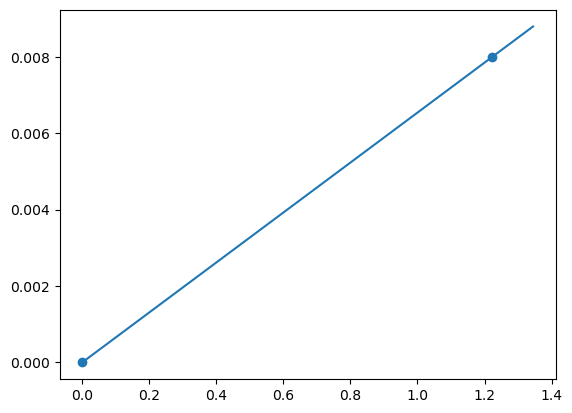

/Users/ssulheim/anaconda3/envs/pandas2/lib/python3.12/site-packages/scipy/optimize/_minpack_py.py:1010: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


M9 L-alanine ISOCITRATE 0.00036586248156853185 0.00015150478719833866 0.41410309837949155


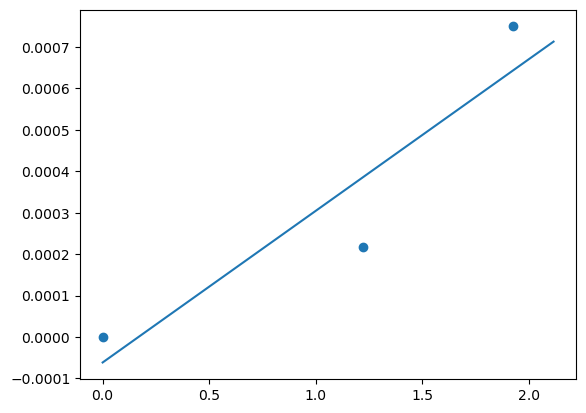

M9 L-alanine TRANS-ACONITATE 1.8933396294907924e-05 1.0193663035077468e-05 0.5383959051139188


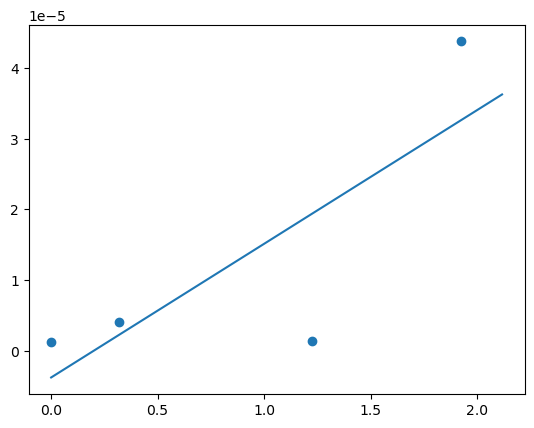

M10 L-alanine PHENYLALANINE 1.747950109015824e-05 8.661792877450584e-06 0.4955400519027153


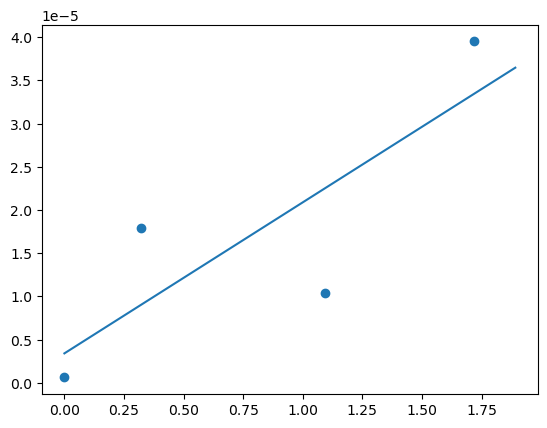

M10 L-alanine LEUCINE nan nan nan


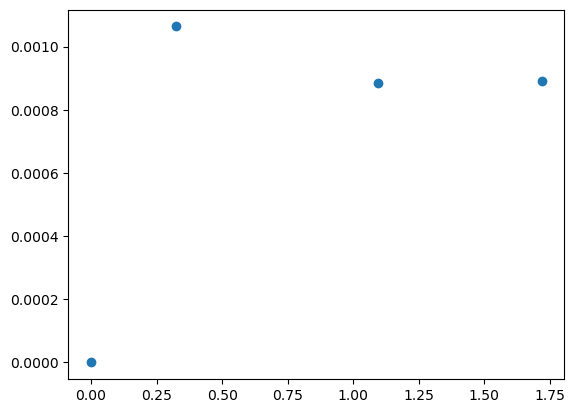

M10 L-alanine ISOLEUCINE 0.0005133419691746751 0.0001233647534287491 0.2403169053702907


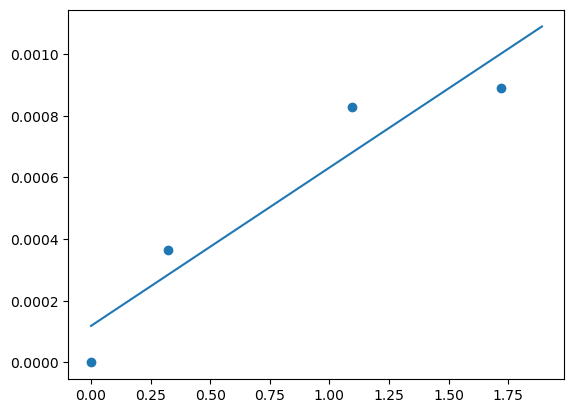

M10 L-alanine METHIONINE 1.0813125848293964e-05 1.1598675290985893e-05 1.0726477665860024


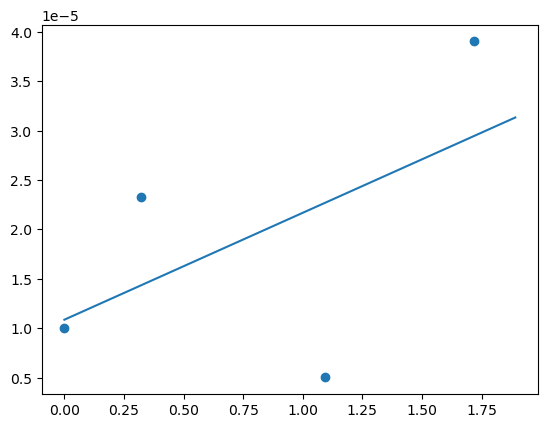

M10 L-alanine GAMMA-AMINOBUTYRATE 0.00986676686501258 0.0003163981419517462 0.03206705360331252


/Users/ssulheim/anaconda3/envs/pandas2/lib/python3.12/site-packages/scipy/optimize/_minpack_py.py:1010: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


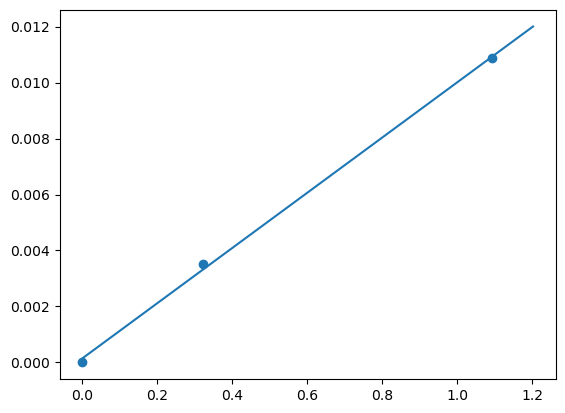

M10 L-alanine PROLINE 0.00018405434559490784 9.828742659116733e-05 0.5340130724622598


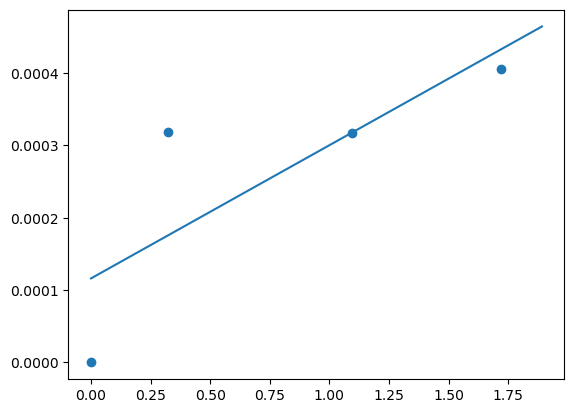

M10 L-alanine TYROSINE 3.673954113345878e-05 2.9557339896254465e-05 0.8045103173413489


/Users/ssulheim/anaconda3/envs/pandas2/lib/python3.12/site-packages/scipy/optimize/_minpack_py.py:1010: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


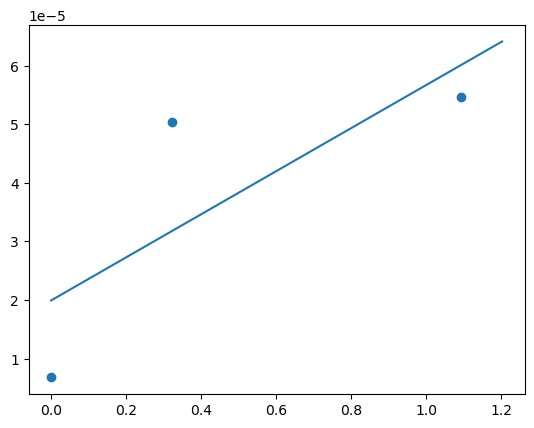

M10 L-alanine VALINE nan nan nan


/Users/ssulheim/anaconda3/envs/pandas2/lib/python3.12/site-packages/scipy/optimize/_minpack_py.py:1010: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


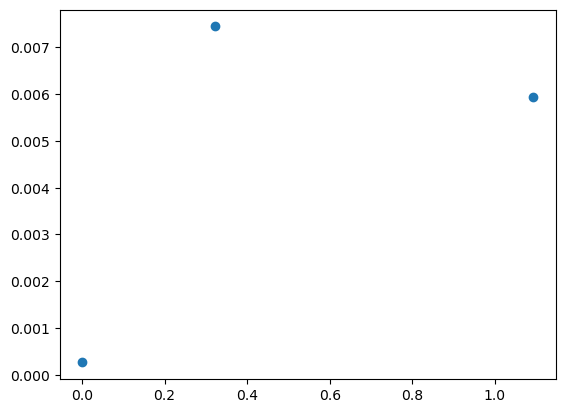

M10 L-alanine PIPECOLIC ACID 2.0721341858720267e-05 3.466372786735784e-06 0.16728515027500562


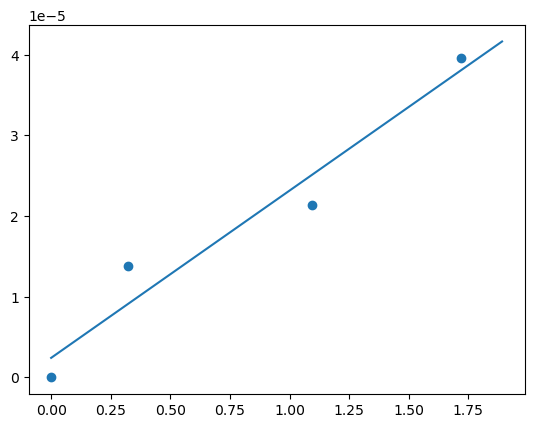

M10 L-alanine ALPHA-AMINOBUTYRATE 0.2016358082608342 0.052249819438301856 0.2591296649586763


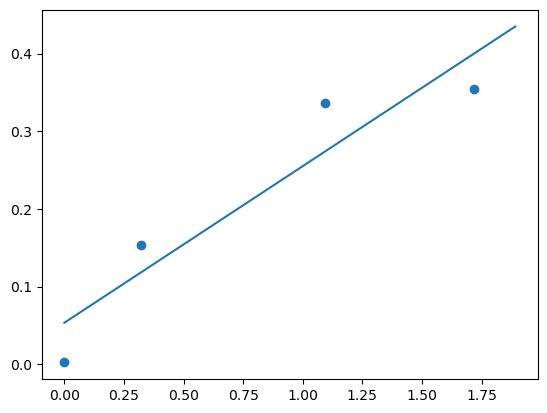

/Users/ssulheim/anaconda3/envs/pandas2/lib/python3.12/site-packages/scipy/optimize/_minpack_py.py:1010: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


M10 L-alanine BETA-ALANINE 0.00040179120635784214 3.10213883694762e-05 0.07720773346604311


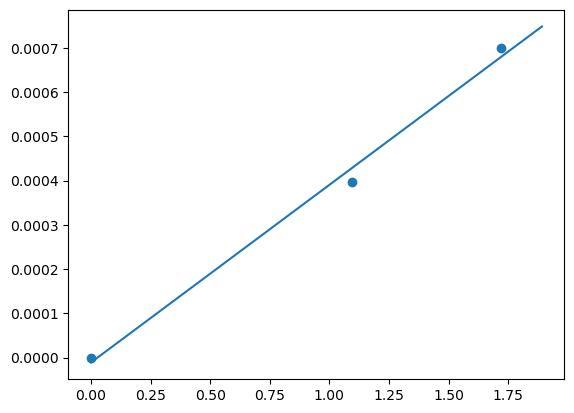

/Users/ssulheim/anaconda3/envs/pandas2/lib/python3.12/site-packages/scipy/optimize/_minpack_py.py:1010: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


M10 L-alanine ALANINE -19.597281380227223 1.4762386107129684 0.07532874494532833


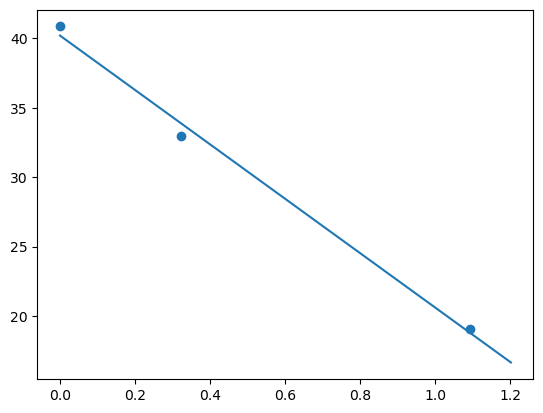

M10 L-alanine CREATINE -3.4936313986361354e-06 3.816366235340791e-06 1.0923780444699023


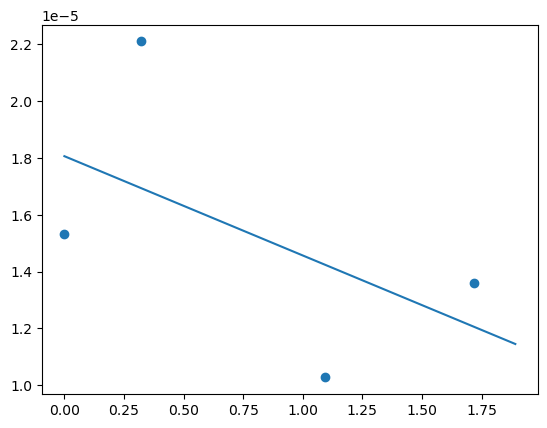

M10 L-alanine ALPHA-AMINOADIPATE 5.393131633880977e-05 2.427182352111728e-06 0.045005064160933375


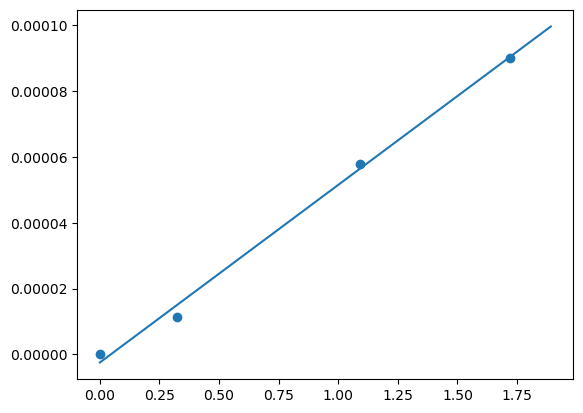

M10 L-alanine GLYCINE 0.039698038001831214 0.00986301011062655 0.24845082042018257


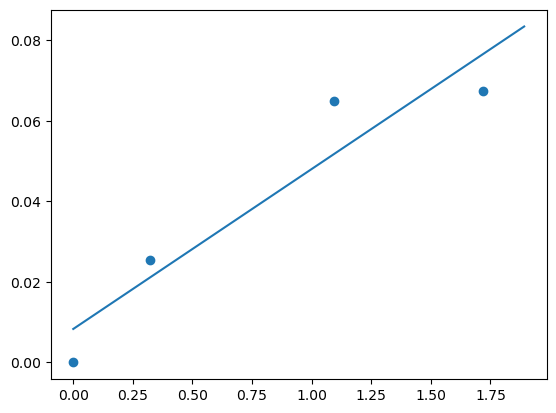

/Users/ssulheim/anaconda3/envs/pandas2/lib/python3.12/site-packages/scipy/optimize/_minpack_py.py:1010: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


M10 L-alanine GLUTAMINE nan nan nan


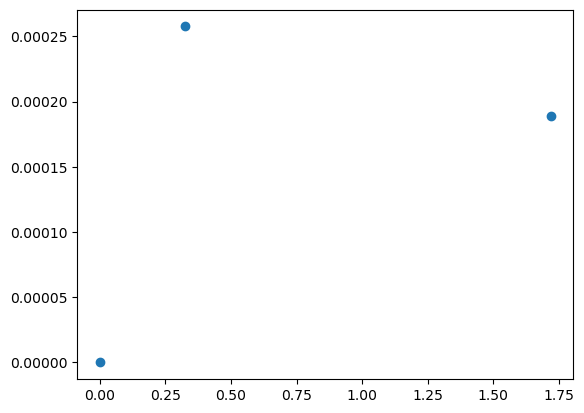

M10 L-alanine GLUTAMATE 0.001521242395492599 0.0012338554833254112 0.8110840763978787


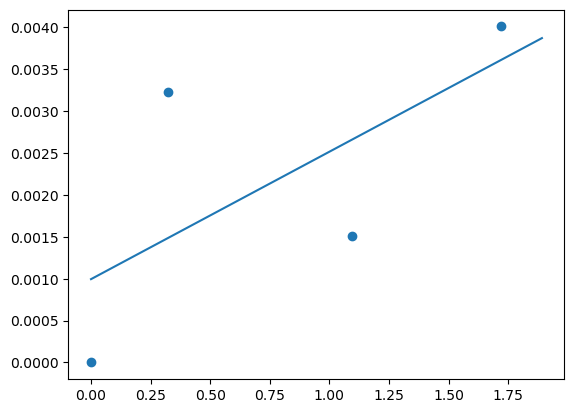

M10 L-alanine SERINE 0.0009608545701934504 0.00012671733695853035 0.1318798295698569


/Users/ssulheim/anaconda3/envs/pandas2/lib/python3.12/site-packages/scipy/optimize/_minpack_py.py:1010: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


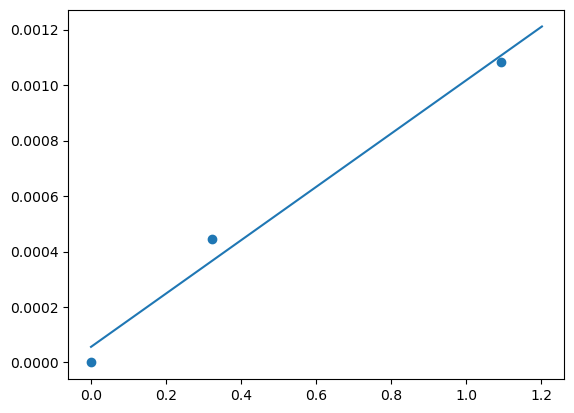

M10 L-alanine ASPARAGINE 0.010156817022433153 0.0032457644263520023 0.3195651176134363


/Users/ssulheim/anaconda3/envs/pandas2/lib/python3.12/site-packages/scipy/optimize/_minpack_py.py:1010: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


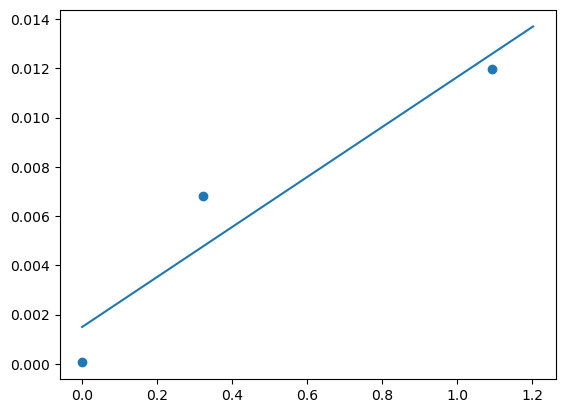

M10 L-alanine ASPARTATE 0.00011327027581390124 0.00011621577937123066 1.0260042057474


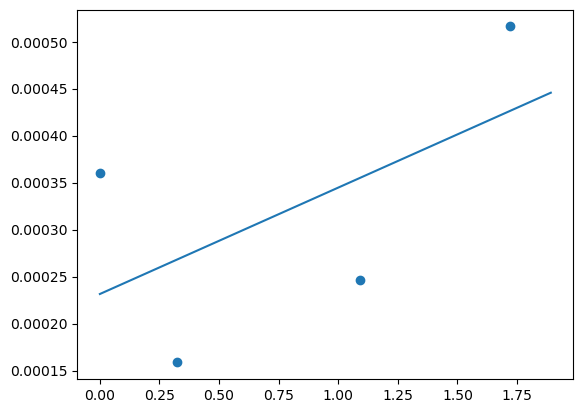

M10 L-alanine LYSINE nan nan nan


/Users/ssulheim/anaconda3/envs/pandas2/lib/python3.12/site-packages/scipy/optimize/_minpack_py.py:1010: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


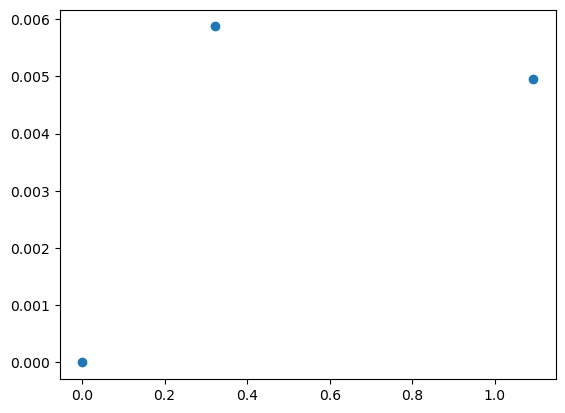

M10 L-alanine LACTATE nan nan nan


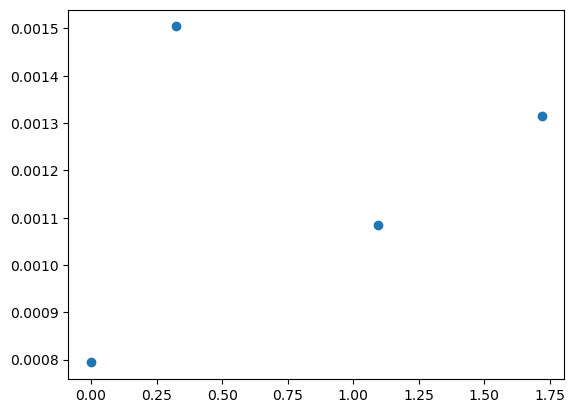

/Users/ssulheim/anaconda3/envs/pandas2/lib/python3.12/site-packages/scipy/optimize/_minpack_py.py:1010: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


M10 L-alanine NAD 0.00014471166041903652 inf inf


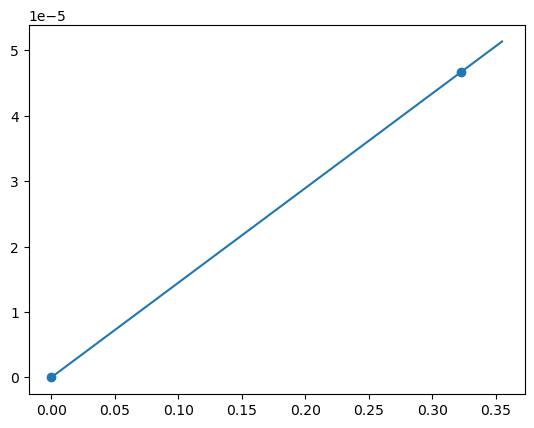

M10 L-alanine SUCCINATE 0.003158541530178886 0.0003311139798138632 0.10483128895098313


/Users/ssulheim/anaconda3/envs/pandas2/lib/python3.12/site-packages/scipy/optimize/_minpack_py.py:1010: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


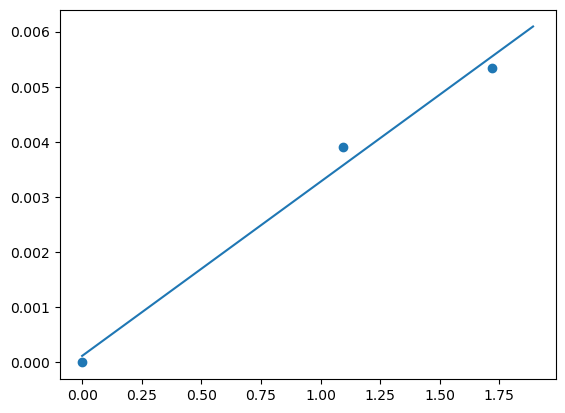

M10 L-alanine CIS-ACONITATE 0.0009056544358945927 0.00010655889402688927 0.11765955071111853


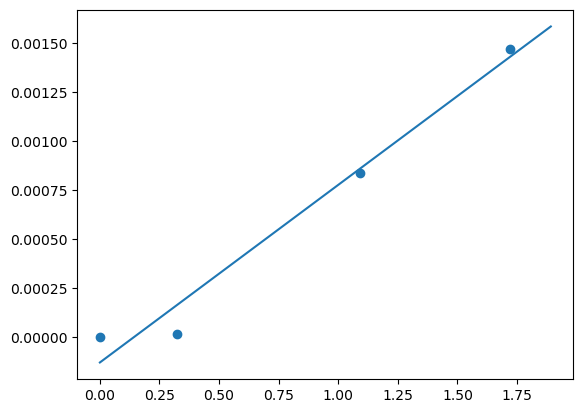

M10 L-alanine CITRATE 0.002587173371708938 inf inf


/Users/ssulheim/anaconda3/envs/pandas2/lib/python3.12/site-packages/scipy/optimize/_minpack_py.py:1010: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


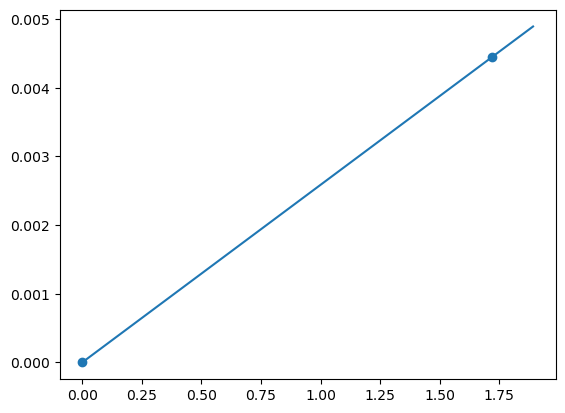

/Users/ssulheim/anaconda3/envs/pandas2/lib/python3.12/site-packages/scipy/optimize/_minpack_py.py:1010: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


M10 L-alanine ISOCITRATE 0.0003696726980713423 0.00016370739863690156 0.4428441686145511


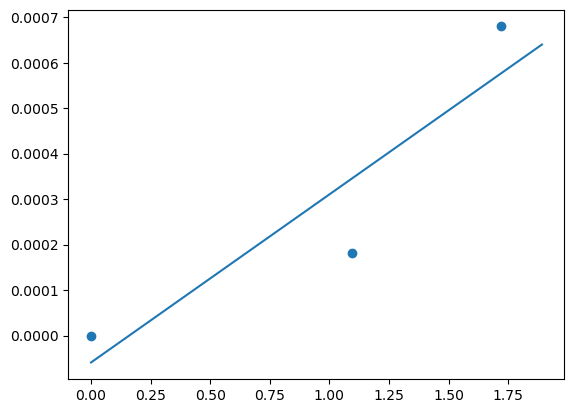

/Users/ssulheim/anaconda3/envs/pandas2/lib/python3.12/site-packages/scipy/optimize/_minpack_py.py:1010: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


M10 L-alanine TRANS-ACONITATE 1.9974503895528892e-05 6.363864360545196e-06 0.31859937016857215


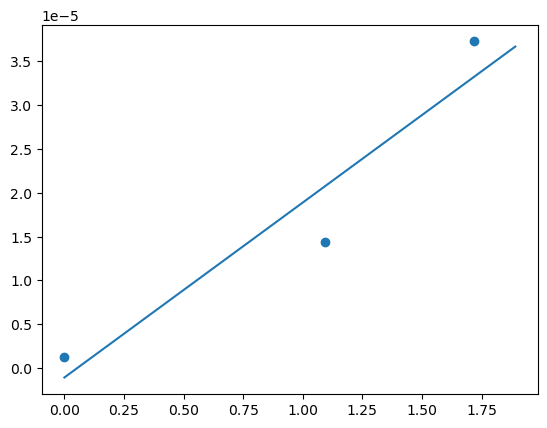

M11 L-alanine PHENYLALANINE 4.972505060691352e-05 3.894886405589275e-06 0.07832845533691121


/Users/ssulheim/anaconda3/envs/pandas2/lib/python3.12/site-packages/scipy/optimize/_minpack_py.py:1010: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


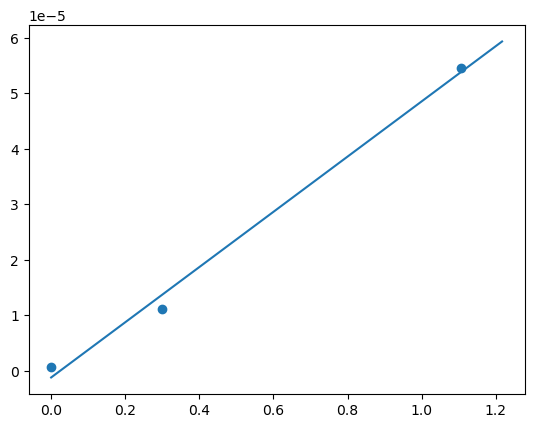

M11 L-alanine LEUCINE 0.0006916834116943552 0.0003186308583818155 0.4606599681222568


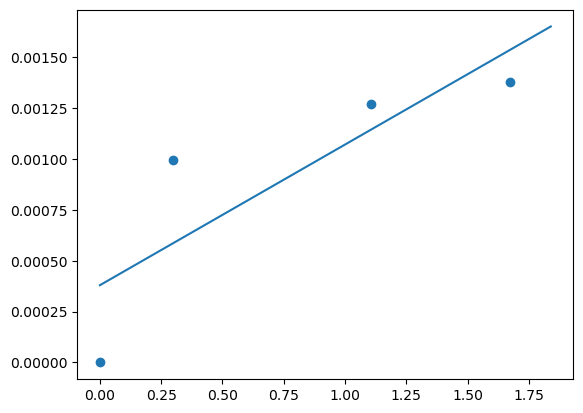

M11 L-alanine ISOLEUCINE 0.0008320208630736212 4.552554589691446e-05 0.054716832134155444


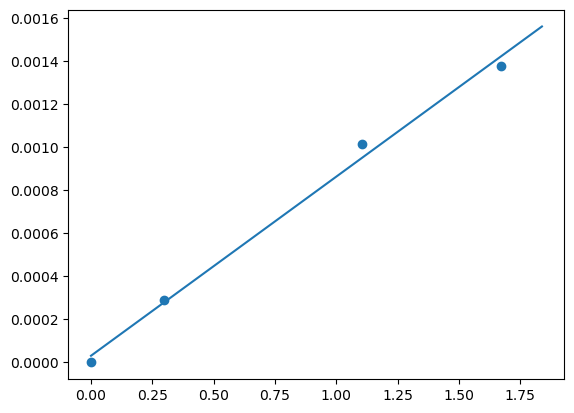

M11 L-alanine METHIONINE 2.7979892683988223e-05 1.5908873755881278e-05 0.5685823721899153


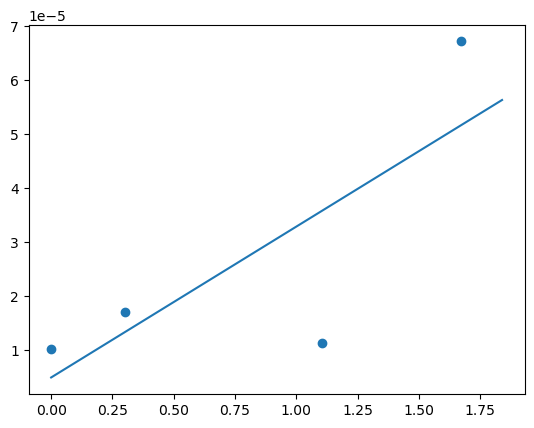

/Users/ssulheim/anaconda3/envs/pandas2/lib/python3.12/site-packages/scipy/optimize/_minpack_py.py:1010: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


M11 L-alanine GAMMA-AMINOBUTYRATE 0.007454849855883106 0.0001909326933232642 0.025611876431365924


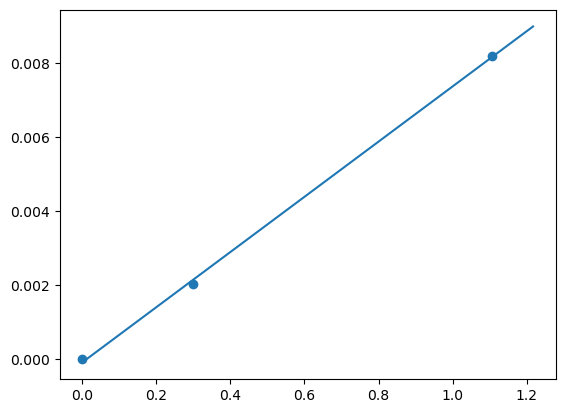

M11 L-alanine PROLINE 0.0005727122986378672 8.112298640064873e-05 0.14164701298294236


/Users/ssulheim/anaconda3/envs/pandas2/lib/python3.12/site-packages/scipy/optimize/_minpack_py.py:1010: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


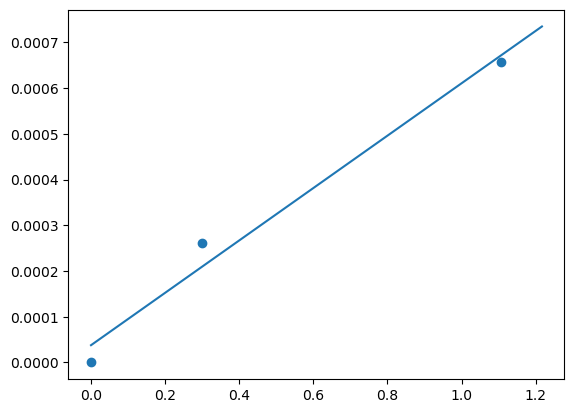

M11 L-alanine TYROSINE 4.330042950205482e-05 4.0038926824393584e-05 0.9246773596666873


/Users/ssulheim/anaconda3/envs/pandas2/lib/python3.12/site-packages/scipy/optimize/_minpack_py.py:1010: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


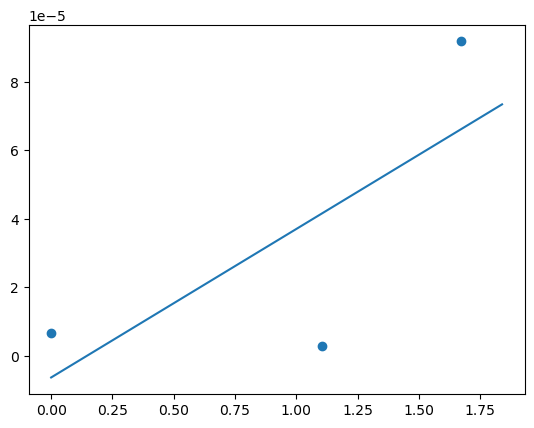

M11 L-alanine VALINE 0.003264534721609144 0.0022273521284887987 0.6822877740417782


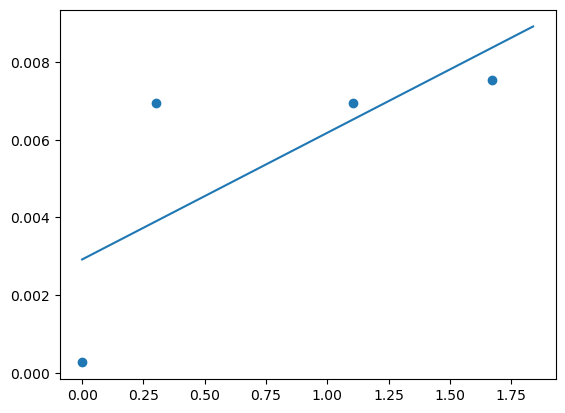

M11 L-alanine PIPECOLIC ACID 2.1507791945186837e-05 2.448342052845926e-06 0.11383511887624675


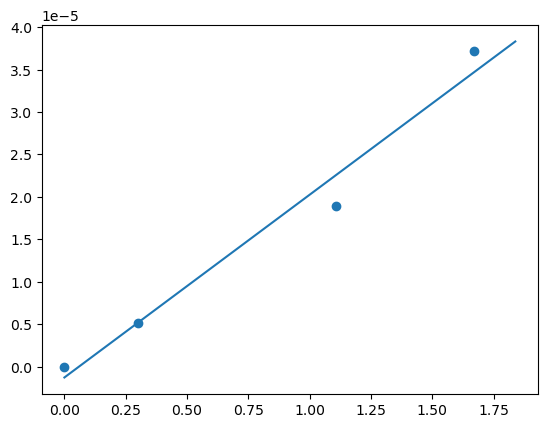

M11 L-alanine ALPHA-AMINOBUTYRATE 0.20592673456673413 0.038077812719320606 0.1849095155101429


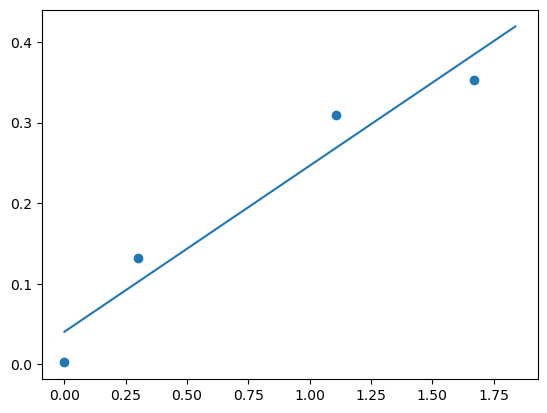

/Users/ssulheim/anaconda3/envs/pandas2/lib/python3.12/site-packages/scipy/optimize/_minpack_py.py:1010: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


M11 L-alanine BETA-ALANINE 0.00041704723809726237 3.539905782223451e-05 0.08488021161281221


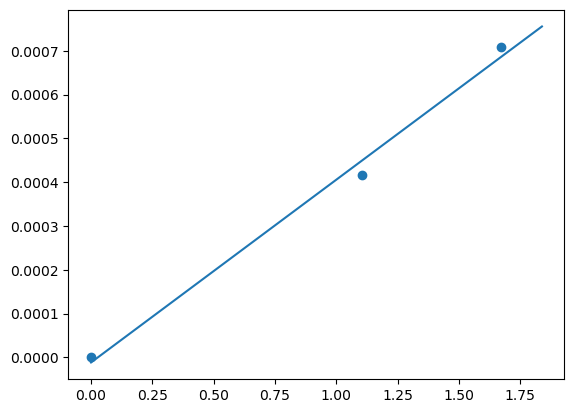

M11 L-alanine ALANINE -16.41856985195011 2.6335142494032757 0.1603985166278341


/Users/ssulheim/anaconda3/envs/pandas2/lib/python3.12/site-packages/scipy/optimize/_minpack_py.py:1010: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


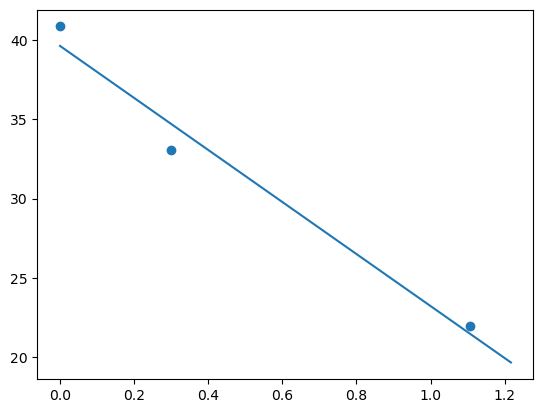

M11 L-alanine CREATINE -4.065179130221184e-06 9.321284084673206e-07 0.22929577728512152


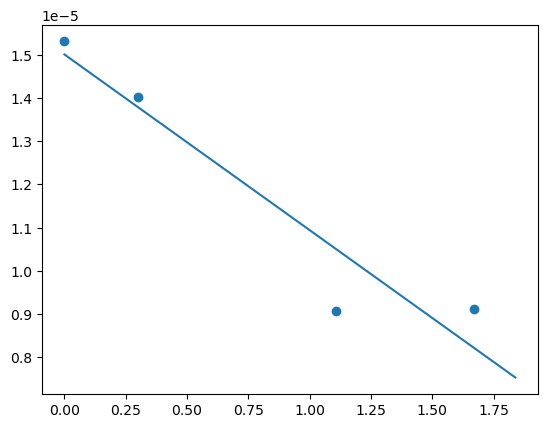

M11 L-alanine ALPHA-AMINOADIPATE 6.455250198561267e-05 1.0351333628314262e-05 0.1603552660223975


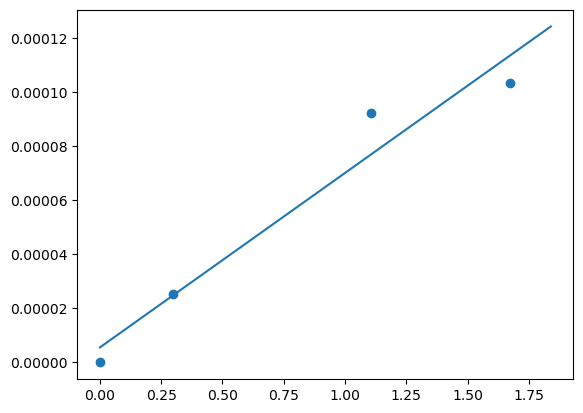

M11 L-alanine GLYCINE 0.03023285756479041 0.006630207716080903 0.21930469860058915


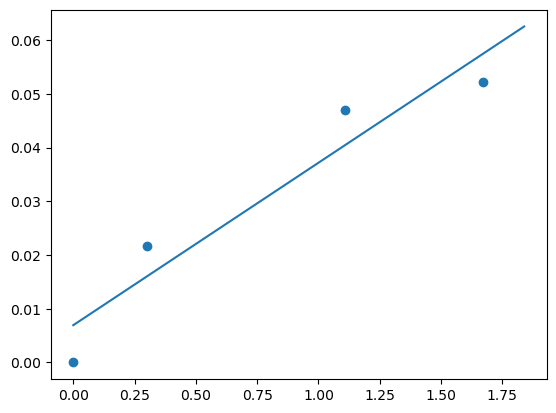

/Users/ssulheim/anaconda3/envs/pandas2/lib/python3.12/site-packages/scipy/optimize/_minpack_py.py:1010: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


M11 L-alanine GLUTAMINE 2.0714779543206288e-05 inf inf


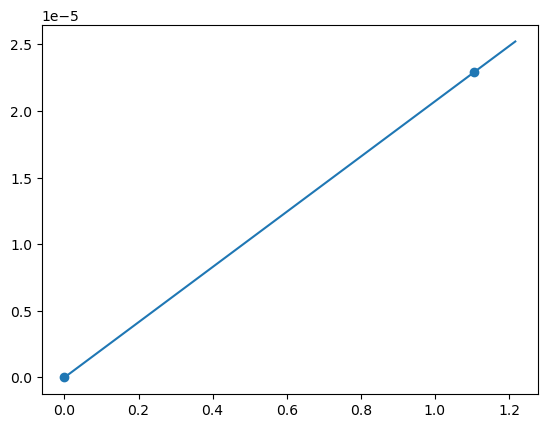

M11 L-alanine GLUTAMATE 0.0041955044433807836 0.0016226837769902803 0.38676726455393856


/Users/ssulheim/anaconda3/envs/pandas2/lib/python3.12/site-packages/scipy/optimize/_minpack_py.py:1010: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


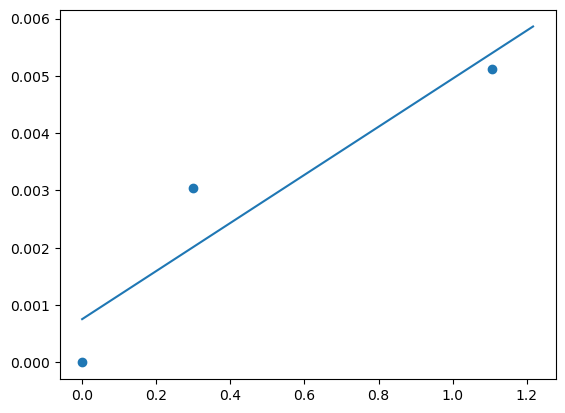

M11 L-alanine SERINE 0.0012554281804386305 0.0002005985318379865 0.15978495222872882


/Users/ssulheim/anaconda3/envs/pandas2/lib/python3.12/site-packages/scipy/optimize/_minpack_py.py:1010: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


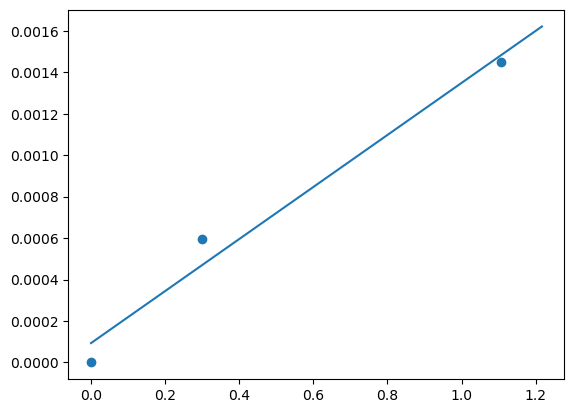

M11 L-alanine ASPARAGINE 0.005748535254331529 0.004845792406106117 0.8429612399880138


/Users/ssulheim/anaconda3/envs/pandas2/lib/python3.12/site-packages/scipy/optimize/_minpack_py.py:1010: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


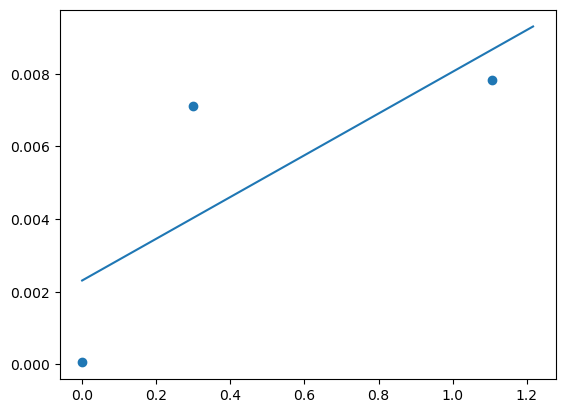

M11 L-alanine ASPARTATE nan nan nan


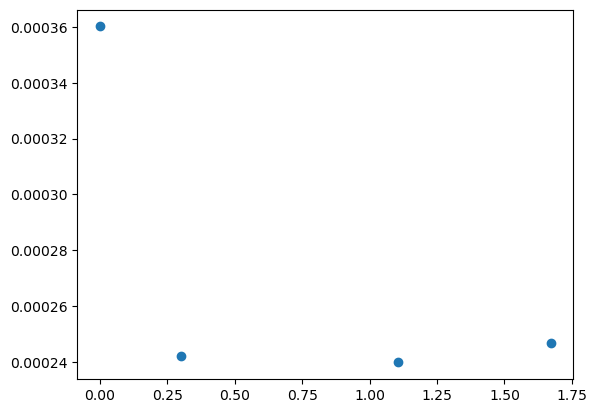

/Users/ssulheim/anaconda3/envs/pandas2/lib/python3.12/site-packages/scipy/optimize/_minpack_py.py:1010: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


M11 L-alanine LYSINE 0.004241171891937304 0.0031596947587538464 0.7450051163360288


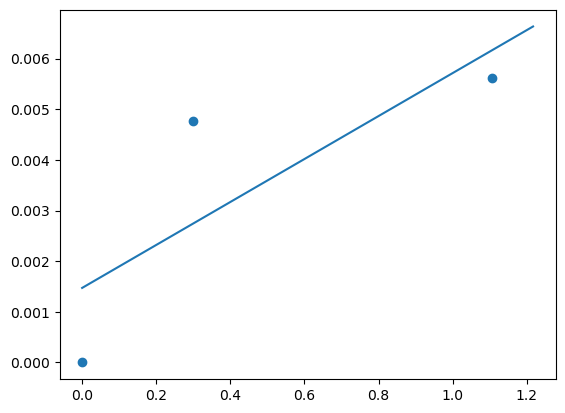

M11 L-alanine LACTATE nan nan nan


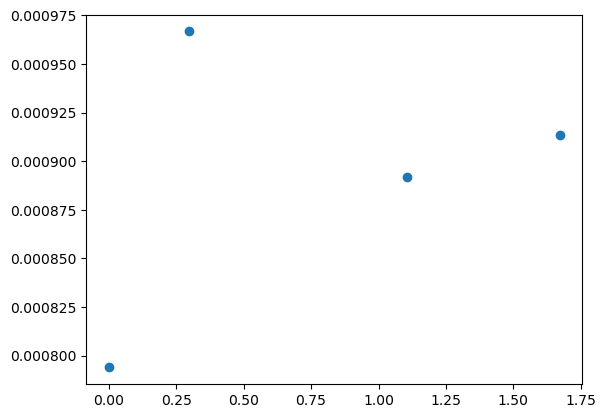

/Users/ssulheim/anaconda3/envs/pandas2/lib/python3.12/site-packages/scipy/optimize/_minpack_py.py:1010: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


M11 L-alanine HEXOSES including Glucose and Fructose 0.007639901303113679 inf inf


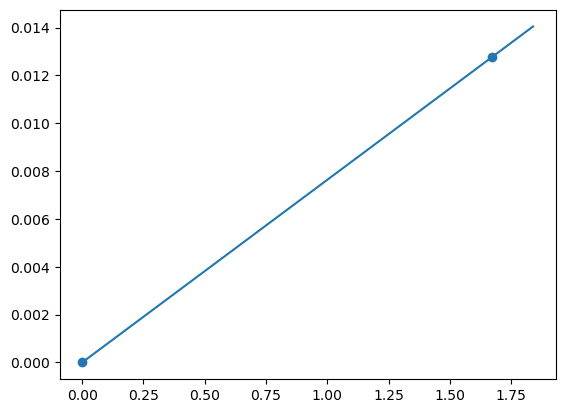

M11 L-alanine NAD 6.984773649709687e-05 1.3176471530638986e-05 0.18864564825499605


/Users/ssulheim/anaconda3/envs/pandas2/lib/python3.12/site-packages/scipy/optimize/_minpack_py.py:1010: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


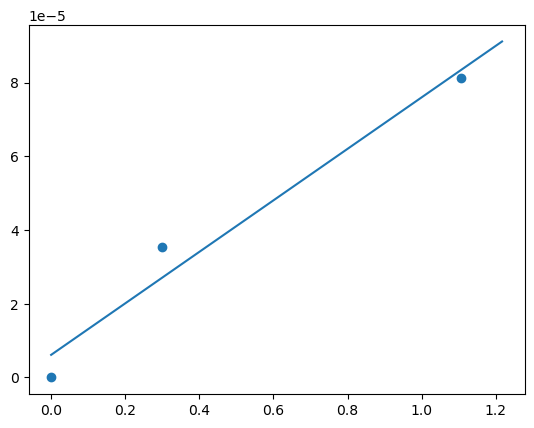

/Users/ssulheim/anaconda3/envs/pandas2/lib/python3.12/site-packages/scipy/optimize/_minpack_py.py:1010: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


M11 L-alanine SUCCINATE 0.010569656574585744 0.0026528408959446757 0.25098647976163296


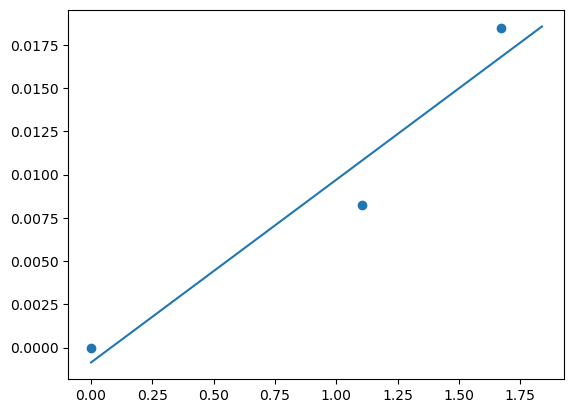

M11 L-alanine CIS-ACONITATE 0.0008013294425863586 8.961923196314918e-05 0.11183818689338998


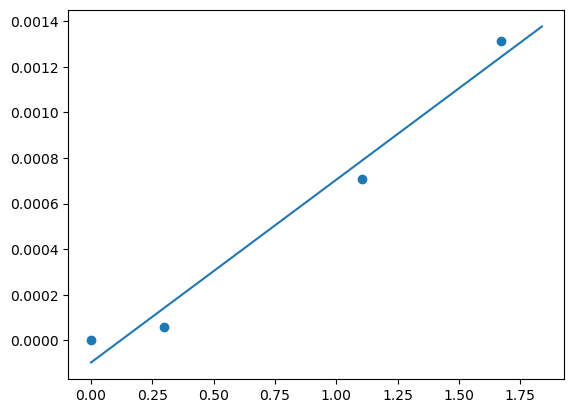

/Users/ssulheim/anaconda3/envs/pandas2/lib/python3.12/site-packages/scipy/optimize/_minpack_py.py:1010: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


M11 L-alanine CITRATE 0.0041026161864174725 inf inf


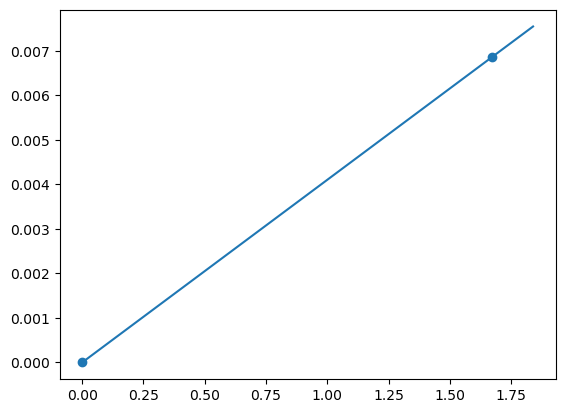

/Users/ssulheim/anaconda3/envs/pandas2/lib/python3.12/site-packages/scipy/optimize/_minpack_py.py:1010: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


M11 L-alanine ISOCITRATE 0.00031193714414818333 0.00011845922294903731 0.3797535021759517


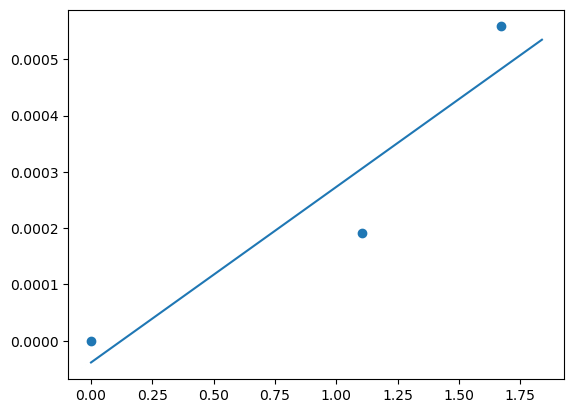

/Users/ssulheim/anaconda3/envs/pandas2/lib/python3.12/site-packages/scipy/optimize/_minpack_py.py:1010: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


M11 L-alanine TRANS-ACONITATE 1.8823451484561548e-05 4.462363335235912e-06 0.23706403360169168


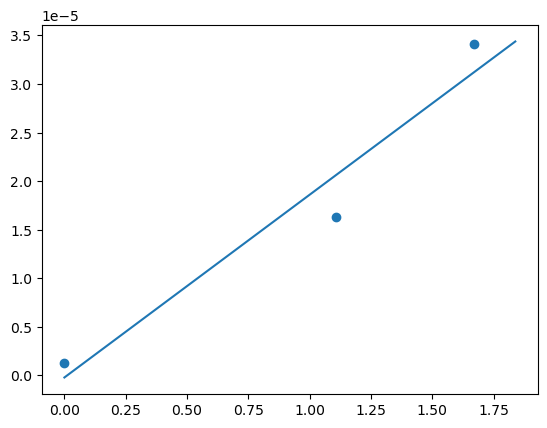

In [31]:
data = []
plot = True
data_rate = []

for m in dfl.M.unique():
    for met in dfl.Metabolite.unique():
        
        idx = (dfl.M == m) & (dfl.Metabolite == met) & (dfl.Timepoint != 4) & ~control_idx_l
        dfi = dfl.loc[idx,['Concentration', 'Hours', 'Carbon source', 'Timepoint']].copy()
        dfi.sort_values('Hours', inplace=True)
        # print(m, met)
        # print(dfi)
        dfi.dropna(axis = 0, inplace=True)
    
        if not len(dfi):
            continue
        cs = dfi['Carbon source'].values[0]  
        # if len(dfi) == 1:
        # Add medium concentrations
        medium_values = control_df.loc[control_df['Carbon source']==cs, met].values
        if np.isfinite(medium_values).sum() == 0:
            dfi.loc[-1,:] = [0, 0, cs, 0]
        else:
            dfi.loc[-1,:] = [np.nanmean(medium_values), 0, cs, 0]
            
        if (2 in dfi.Timepoint.values) and (3 in dfi.Timepoint.values):
            t3_value = dfi.loc[dfi.Timepoint == 3, 'Concentration'].values[0]
            t2_value = dfi.loc[dfi.Timepoint == 2, 'Concentration'].values[0]
            if  t3_value < t2_value:
                # Indicates that the matbolite is being reconsumed, discard last point from estimating rates
                dfi = dfi.loc[dfi.Timepoint != 3, :]

        # # If medium values are larger than values at t1
        # if len(dfi.loc[dfi.Timepoint > 0, :]) > 1:
            
        #     non_medium_conc = dfi.loc[dfi.Timepoint > 0,'Concentration'].values
        #     if (dfi.loc[-1, 'Concentration'] > non_medium_conc[0]) and (non_medium_conc[0] < non_medium_conc[1]):
        #         dfi.drop(index = [-1], inplace = True)
        #         print('Drop 0', m, met, cs)
                # The maximum value 
        # print(dfi)
        time_conc_dict = {key: (value['Hours'], value['Concentration']) for key, value in dfi[['Hours', 'Concentration']].to_dict(orient = 'index').items()}
        rel = M_to_rel[m]
        gdw = gdw_df[['Hours', rel]].copy()
        gdw.dropna(inplace=True)
        m_data = []
        for index, val_tuple in time_conc_dict.items():
            time, conc = val_tuple
            # Calculate cumulative OD
            tidx = gdw.Hours < time+0.5
            conc_mM = conc * 1e-3
            cum_dw = scipy.integrate.simpson(gdw.loc[tidx, rel], gdw.loc[tidx, 'Hours'])
            data.append([m, met, time, conc_mM, cum_dw, cs])
            m_data.append([time, conc_mM, cum_dw])

        m_df = pd.DataFrame(m_data, columns = ['Time', 'Concentration [mM]', 'Integral of biomass [gDW*h/L]'])
        popt, pcov = scipy.optimize.curve_fit(lambda x,a,b: a*x+b, m_df['Integral of biomass [gDW*h/L]'], 
                                              m_df['Concentration [mM]'])
        rate = popt[0]
        rate_std = np.sqrt(pcov[0,0])

        # Check rate without t0
        if len(m_df)>2:
            idx0 = m_df.Time == 0 
            popt0, pcov0 = scipy.optimize.curve_fit(lambda x,a,b: a*x+b, m_df.loc[~idx0, 'Integral of biomass [gDW*h/L]'], 
                                              m_df.loc[~idx0, 'Concentration [mM]'])
            if np.sign(rate)!= np.sign(popt0[0]):
                rate, rate_std = np.nan, np.nan
        data_rate.append([m, met, cs, rate, rate_std])
        if plot:
            print(m, cs, met, rate, rate_std, rate_std/np.abs(rate) )
            max_x = m_df['Integral of biomass [gDW*h/L]'].max()*1.1
            plt.scatter(m_df['Integral of biomass [gDW*h/L]'], m_df['Concentration [mM]'])
            x = np.linspace(0,max_x, 4)
            plt.plot(x, rate*x + popt[1])
            plt.show()
df_conc_biomass = pd.DataFrame(data, columns = ['M', 'Metabolite', 'Time', 'Concentration [mM]', 'Integral of biomass [gDW*h/L]', 'Carbon source'])
df_rate = pd.DataFrame(data_rate, columns = ['M', 'Metabolite', 'Carbon source', 'Rate [mmol/gDW/h]', 'Rate std'])

In [32]:
# data = []
# plot = True
# data_rate = []

# for m in dfl.M.unique():
#     for met in dfl.Metabolite.unique():
#         # print(met, m)
#         idx = (dfl.M == m) & (dfl.Metabolite == met) & (dfl.Timepoint != 4) & ~control_idx_l
#         dfi = dfl.loc[idx,['Concentration', 'Hours', 'Carbon source', 'Timepoint']].copy()
#         dfi.sort_values('Hours', inplace=True)
#         dfi.dropna(axis = 0, inplace=True)
    
#         if not len(dfi):
#             continue
#         cs = dfi['Carbon source'].values[0]  
#         # if len(dfi) == 1:
#         # Add medium concentrations
#         medium_values = control_df.loc[control_df['Carbon source']==cs, met].values
#         if np.isfinite(medium_values).sum() == 0:
#             dfi.loc[-1,:] = [0, 0, cs, 0]
#         else:
#             dfi.loc[-1,:] = [np.nanmean(medium_values), 0, cs, 0]
    
#         if (2 in dfi.Timepoint.values) and (3 in dfi.Timepoint.values):
#             t3_value = dfi.loc[dfi.Timepoint == 3, 'Concentration'].values[0]
#             t2_value = dfi.loc[dfi.Timepoint == 2, 'Concentration'].values[0]
#             if  t3_value < t2_value:
#                 # Indicates that the matbolite is being reconsumed, discard last point from estimating rates
#                 # And compensate by adding time 0
#                 dfi = dfi.loc[dfi.Timepoint != 3, :]
#                 dfi.loc[-1,:] = [medium_dict[cs][met], 0, cs, 0]
#         # print(dfi)
#         time_conc_dict = {key: (value['Hours'], value['Concentration']) for key, value in dfi[['Hours', 'Concentration']].to_dict(orient = 'index').items()}
#         rel = M_to_rel[m]
#         gdw = gdw_df[['Hours', rel]].copy()
#         gdw.dropna(inplace=True)
#         m_data = []
#         for index, val_tuple in time_conc_dict.items():
#             time, conc = val_tuple
#             # Calculate cumulative OD
#             tidx = gdw.Hours < time+0.5
#             conc_mM = conc * 1e-3
#             cum_dw = scipy.integrate.simpson(gdw.loc[tidx, rel], gdw.loc[tidx, 'Hours'])
#             data.append([m, met, time, conc_mM, cum_dw, cs])
#             m_data.append([time, conc_mM, cum_dw])

#         m_df = pd.DataFrame(m_data, columns = ['Time', 'Concentration [mM]', 'Integral of biomass [gDW*h/L]'])

#         # if len(m_df)>2:
#         #     # Then we don't need the medium samples
#         #     m_df = m_df.loc[m_df.Time > 0]
#         print(m, cs, met)
#         print(m_df)
#         popt, pcov = scipy.optimize.curve_fit(lambda x,a,b: a*x+b, m_df['Integral of biomass [gDW*h/L]'], 
#                                                   m_df['Concentration [mM]'])
#         rate = popt[0]
        
        
#         data_rate.append([m, met, cs, rate, pcov[0,0]])
#         if plot:
            
#             max_x = m_df['Integral of biomass [gDW*h/L]'].max()*1.1
#             plt.scatter(m_df['Integral of biomass [gDW*h/L]'], m_df['Concentration [mM]'])
#             x = np.linspace(0,max_x, 4)
#             plt.plot(x, rate*x + popt[1])
#             plt.show()
# df_conc_biomass = pd.DataFrame(data, columns = ['M', 'Metabolite', 'Time', 'Concentration [mM]', 'Integral of biomass [gDW*h/L]', 'Carbon source'])
# df_rate = pd.DataFrame(data_rate, columns = ['M', 'Metabolite', 'Carbon source', 'Rate [mmol/gDW/h]', 'Rate var'])

In [34]:
# idxsign = (df_rate['Rate [mmol/gDW/h]']>np.sqrt(df_rate['Rate var'])).sum()

Galactose PHENYLALANINE
LinregressResult(slope=1.4514460955336545e-05, intercept=-1.6068073438047428e-07, rvalue=0.8566746074128587, pvalue=0.0031808808287849305, stderr=3.303432720586654e-06, intercept_stderr=6.864074746575072e-06) [ 1.45144602e-05 -1.60678600e-07] [3.30343120e-06 6.86407537e-06]


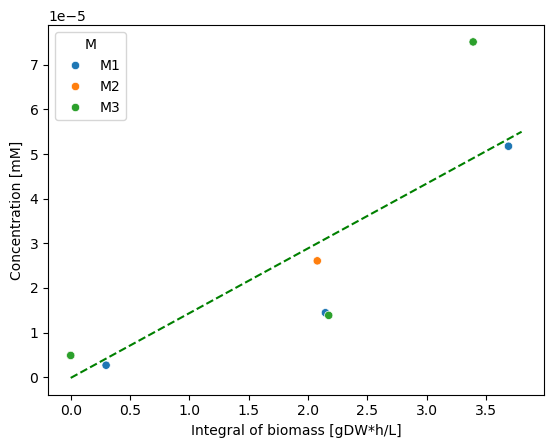

Galactose LEUCINE
LinregressResult(slope=0.00013320026709475648, intercept=-1.867682525761563e-05, rvalue=0.9326899374766894, pvalue=0.0007244253982983514, stderr=2.1028740848070854e-05, intercept_stderr=3.8945562181698885e-05) [ 1.33200267e-04 -1.86768260e-05] [2.10287412e-05 3.89455619e-05]


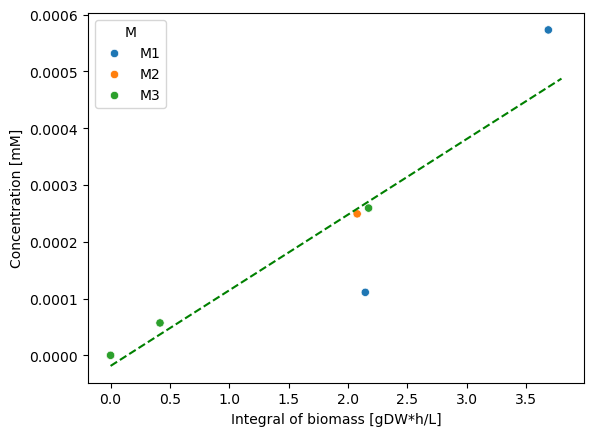

Galactose ISOLEUCINE
LinregressResult(slope=-1.5099023335153672e-05, intercept=0.00012641177855706966, rvalue=-0.8981417487168738, pvalue=0.0024442561324908535, stderr=3.0178022318243065e-06, intercept_stderr=6.319497456406544e-06) [-1.50990234e-05  1.26411779e-04] [3.01780226e-06 6.31949751e-06]


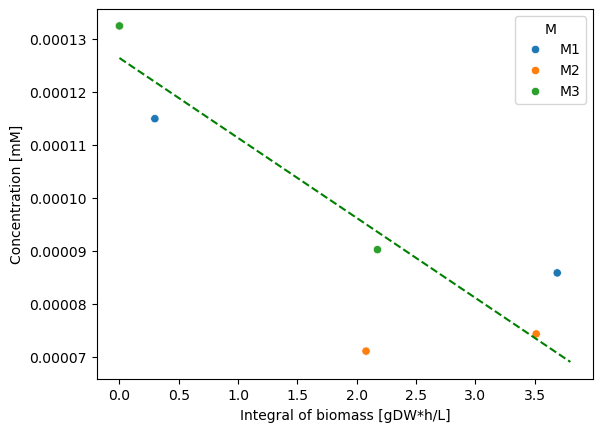

Galactose METHIONINE
LinregressResult(slope=3.5843943373627254e-06, intercept=4.693650502769264e-06, rvalue=0.5839297077275855, pvalue=0.22365783433487613, stderr=2.49158967368472e-06, intercept_stderr=4.841832811396759e-06) [3.58439432e-06 4.69365052e-06] [2.49158968e-06 4.84183280e-06]


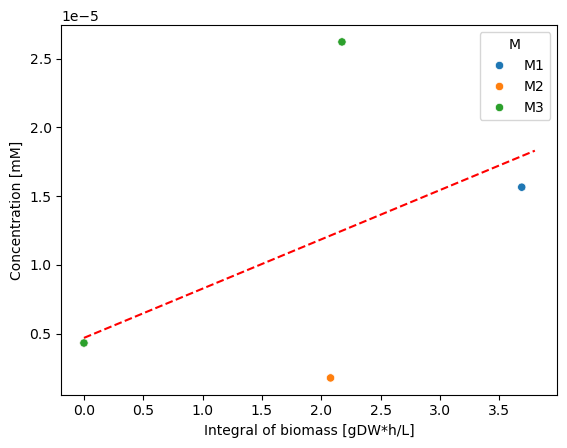

Galactose GAMMA-AMINOBUTYRATE
LinregressResult(slope=4.480467323157228e-05, intercept=0.00018128913153220733, rvalue=0.3221715113044769, pvalue=0.481001535580669, stderr=5.887826234895811e-05, intercept_stderr=0.00010905861728986428) [4.48046718e-05 1.81289133e-04] [5.88782623e-05 1.09058617e-04]


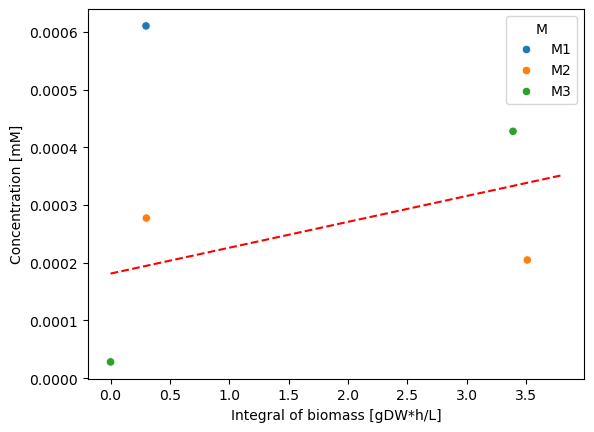

Galactose PROLINE
LinregressResult(slope=1.9838938793784138e-07, intercept=1.9466898372618907e-05, rvalue=0.018252261623669767, pvalue=0.9726246478898409, stderr=5.433746870747762e-06, intercept_stderr=8.197255499806746e-06) [1.98385118e-07 1.94669029e-05] [5.43374667e-06 8.19725557e-06]


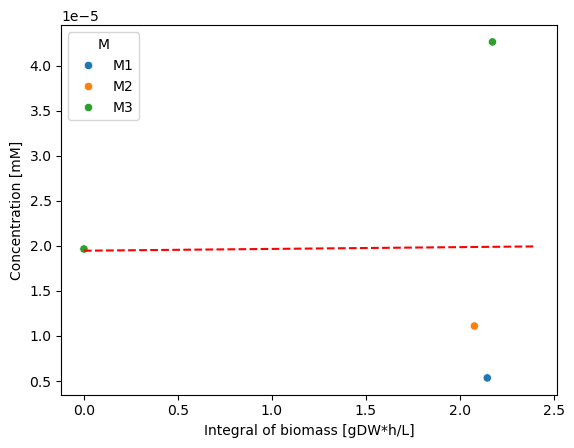

Galactose VALINE
LinregressResult(slope=1.1512794968911679e-05, intercept=1.2349010390253087e-05, rvalue=0.7358329828262835, pvalue=0.15636746474916502, stderr=6.1169390997136256e-06, intercept_stderr=1.37561917315668e-05) [1.15127949e-05 1.23490104e-05] [6.11693910e-06 1.37561917e-05]


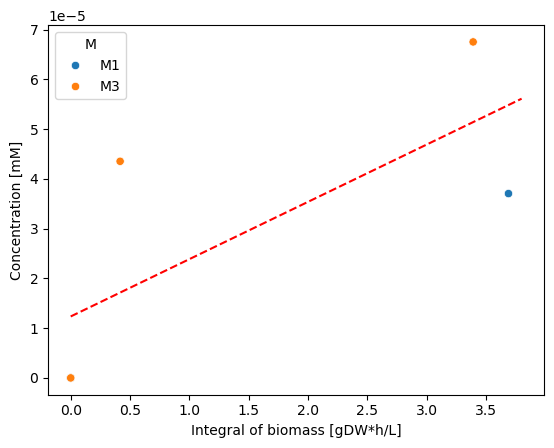

Galactose PIPECOLIC ACID
LinregressResult(slope=6.822026138761528e-06, intercept=2.9538289584102687e-06, rvalue=0.928277855742296, pvalue=0.00010609958527423475, stderr=9.662774280316636e-07, intercept_stderr=1.8775579672614184e-06) [6.82202614e-06 2.95382895e-06] [9.66277432e-07 1.87755798e-06]


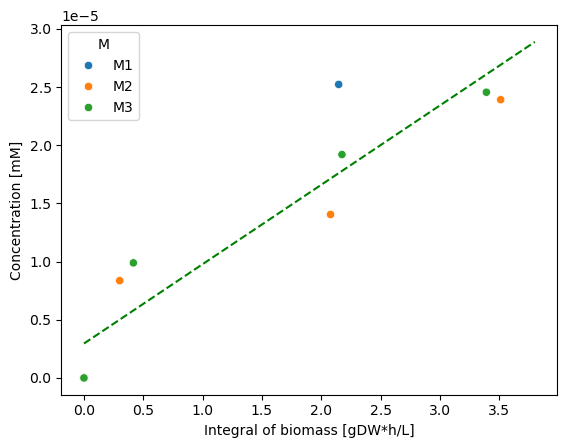

Galactose BETA-ALANINE
LinregressResult(slope=4.0500461624000935e-05, intercept=2.224545940914121e-05, rvalue=0.9021599699030682, pvalue=0.0008755759570351934, stderr=7.31996843230616e-06, intercept_stderr=1.4530033870687222e-05) [4.05004617e-05 2.22454594e-05] [7.31996831e-06 1.45300339e-05]


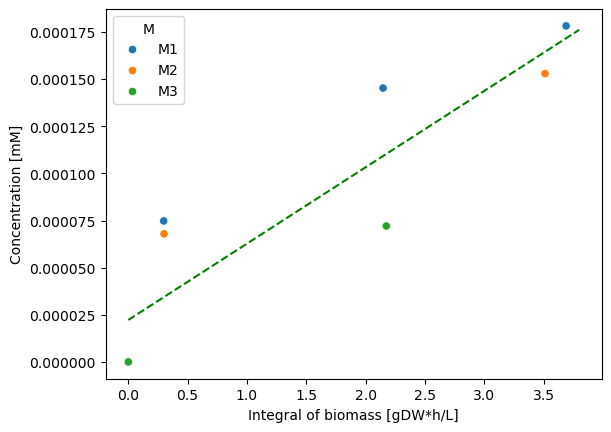

Galactose ALANINE
LinregressResult(slope=-0.0005838266083590763, intercept=0.003498571441386133, rvalue=-0.9770199485264788, pvalue=0.022980051473521224, stderr=9.006301462889167e-05, intercept_stderr=0.0002256684053810327) [-0.00058383  0.00349857] [9.00630145e-05 2.25668406e-04]


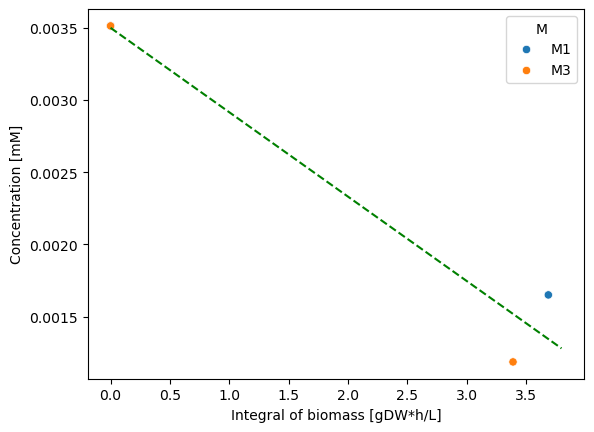

Galactose CREATINE
LinregressResult(slope=1.0287462926278718e-06, intercept=1.179752122529483e-06, rvalue=0.7013659991106287, pvalue=0.01617167252058324, stderr=3.4850645074536615e-07, intercept_stderr=7.52488137632775e-07) [1.02874629e-06 1.17975211e-06] [3.48506449e-07 7.52488133e-07]


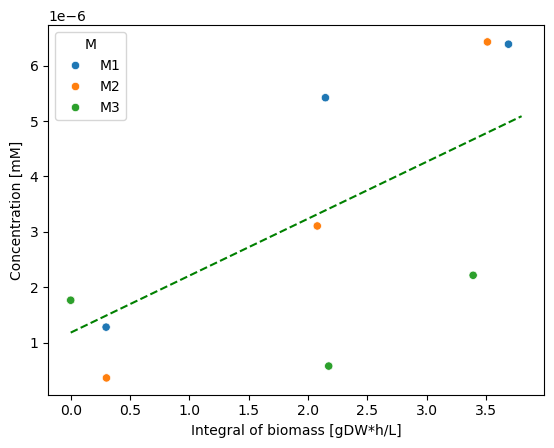

Galactose ALPHA-AMINOADIPATE
LinregressResult(slope=1.4536799239915992e-05, intercept=-2.2673073344932637e-06, rvalue=0.883063287215149, pvalue=0.008424959574685236, stderr=3.4546166324269373e-06, intercept_stderr=8.46771416698426e-06) [ 1.45367992e-05 -2.26730713e-06] [3.45461660e-06 8.46771406e-06]


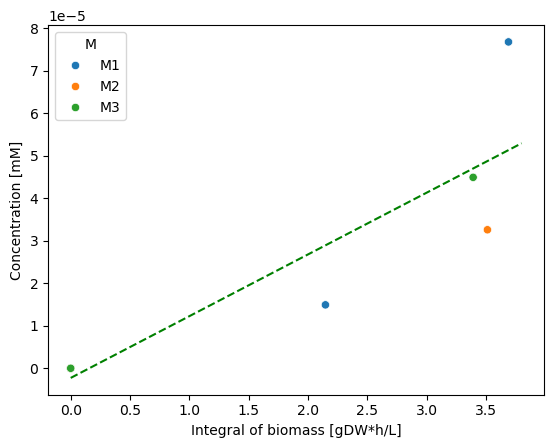

Galactose GLUTAMATE
LinregressResult(slope=0.0020875698116220765, intercept=0.0003153347770217538, rvalue=0.7945720936515339, pvalue=0.0034793944059365776, stderr=0.0005317366806125498, intercept_stderr=0.0010133968049237411) [0.00208757 0.00031533] [0.00053174 0.0010134 ]


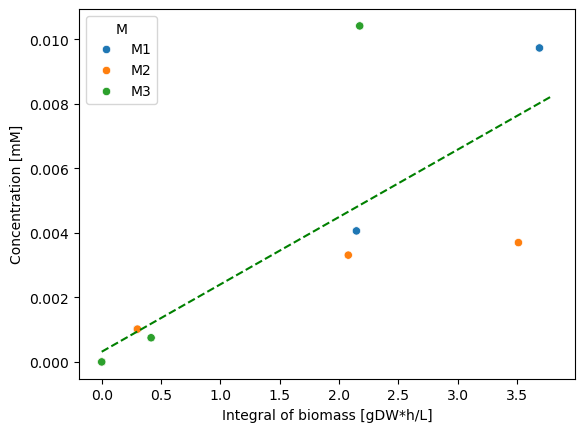

Galactose ASPARAGINE
LinregressResult(slope=9.884718700764301e-05, intercept=0.0003367796617421877, rvalue=0.3814982494242242, pvalue=0.27669174261742385, stderr=8.467835405453965e-05, intercept_stderr=0.0001407281310829663) [9.88471861e-05 3.36779661e-04] [8.46783547e-05 1.40728131e-04]


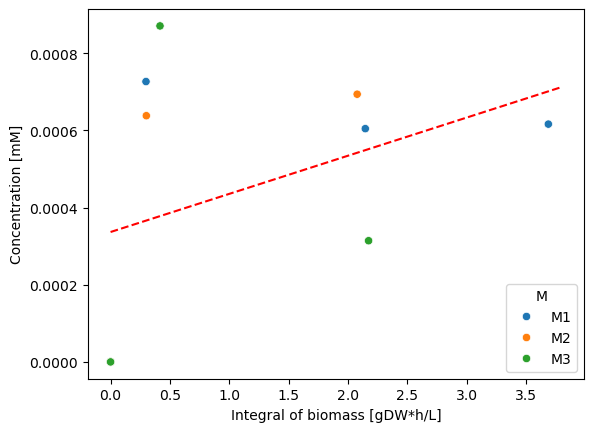

Galactose ASPARTATE
LinregressResult(slope=0.00012006307549735338, intercept=0.00011868934721556555, rvalue=0.92376400907294, pvalue=4.88698969833892e-05, stderr=1.6591402305041623e-05, intercept_stderr=3.5823823044121665e-05) [0.00012006 0.00011869] [1.65914023e-05 3.58238231e-05]


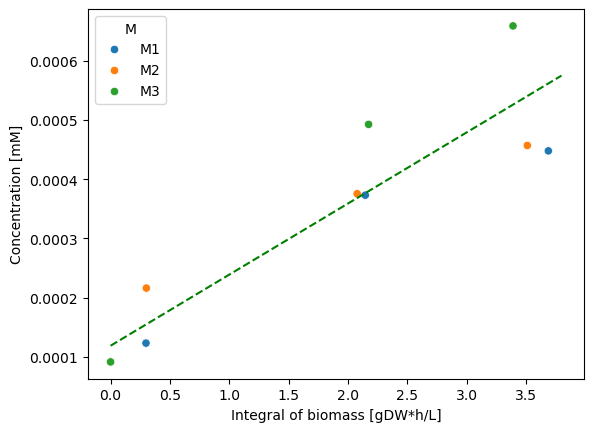

Galactose PYRUVATE
LinregressResult(slope=0.002037667400297993, intercept=0.00025849126801650094, rvalue=0.9760885323827744, pvalue=0.023911467617225624, stderr=0.0003208746473677288, intercept_stderr=0.0006793559176387759) [0.00203767 0.00025849] [0.00032087 0.00067936]


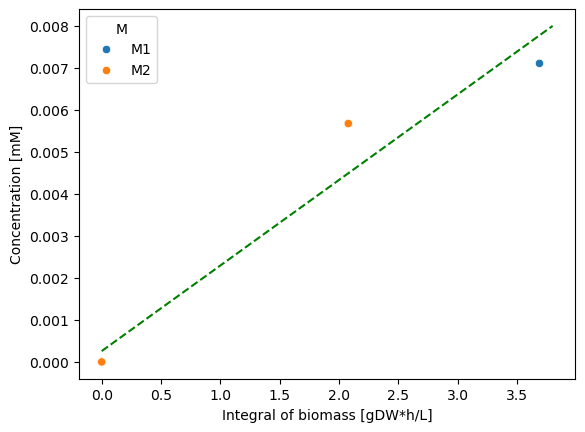

Galactose LACTATE
LinregressResult(slope=-0.0005074454312398616, intercept=0.002309590637389937, rvalue=-0.7039263547076434, pvalue=0.03430377365314698, stderr=0.00019352558409498622, intercept_stderr=0.0003305187017054639) [-0.00050745  0.00230959] [0.00019353 0.00033052]


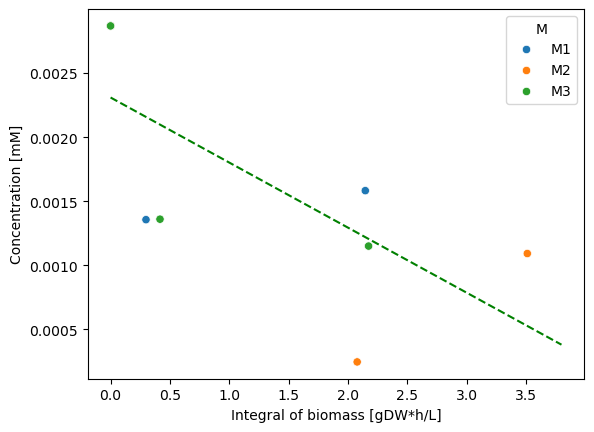

Galactose HEXOSES including Glucose and Fructose
LinregressResult(slope=-5.808332396534911, intercept=39.24910681689025, rvalue=-0.7750512070945779, pvalue=0.014152256821416322, stderr=1.7898610680264193, intercept_stderr=2.2330084988611634) [-5.80833245 39.24910686] [1.78986108 2.23300849]


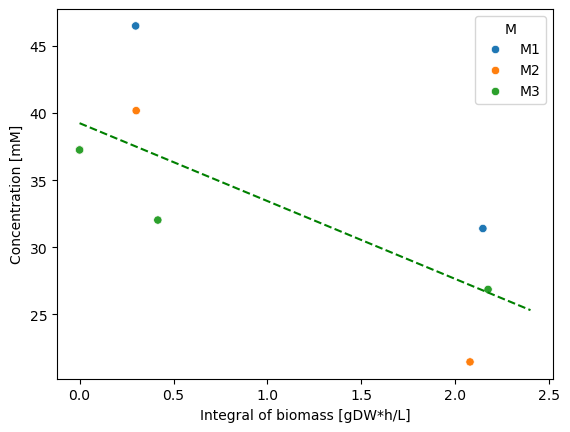

Galactose NAD
LinregressResult(slope=2.0082897559798304e-05, intercept=8.217322974370365e-06, rvalue=0.8749763487256386, pvalue=0.004438929356326857, stderr=4.536787314486865e-06, intercept_stderr=7.679163712294166e-06) [2.00828975e-05 8.21732306e-06] [4.53678736e-06 7.67916375e-06]


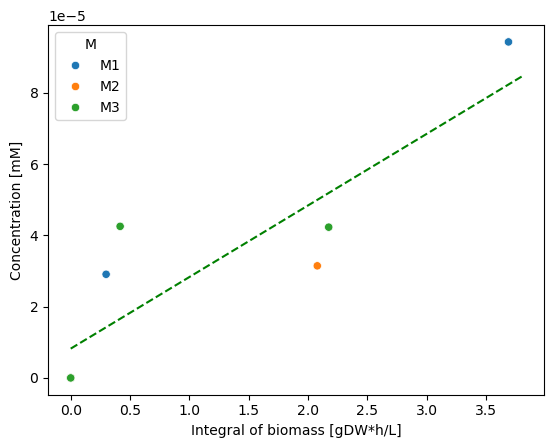

Galactose SUCCINATE
LinregressResult(slope=0.013366380192468793, intercept=-0.0013359906217815312, rvalue=0.5739920513126641, pvalue=0.10605240140106063, stderr=0.007207240765407698, intercept_stderr=0.01717394115388012) [ 0.01336638 -0.00133599] [0.00720724 0.01717394]


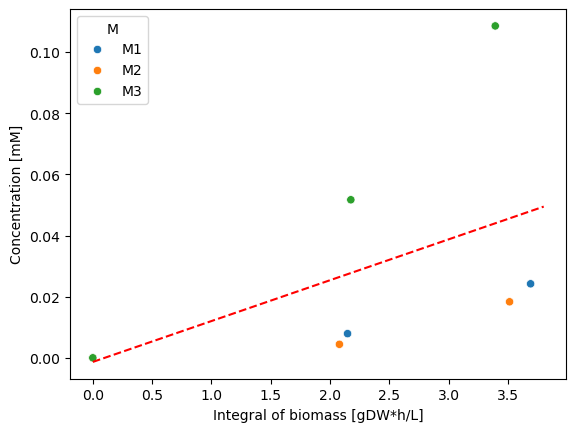

Galactose CIS-ACONITATE
LinregressResult(slope=0.00010150245945026754, intercept=-1.125386401038648e-06, rvalue=0.9931791485246535, pvalue=1.1494762585398928e-10, stderr=3.7682649987030787e-06, intercept_stderr=7.803138057770446e-06) [ 1.01502460e-04 -1.12538826e-06] [3.76826608e-06 7.80313961e-06]


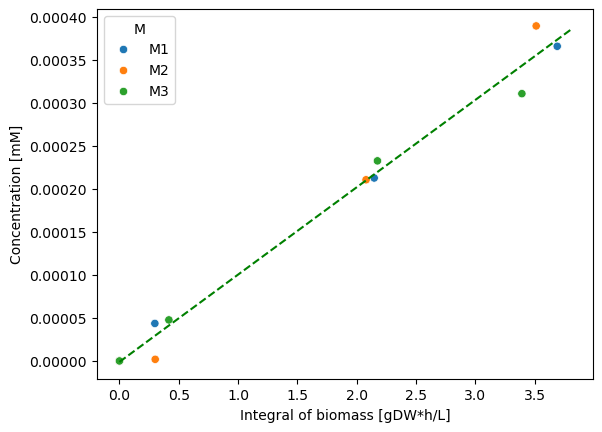

Galactose ISOCITRATE
LinregressResult(slope=4.6599437042390476e-05, intercept=5.349035488054612e-06, rvalue=0.8122306588365131, pvalue=0.014307368363559187, stderr=1.3662958345451237e-05, intercept_stderr=3.125196216461056e-05) [4.65994368e-05 5.34903630e-06] [1.36629579e-05 3.12519620e-05]


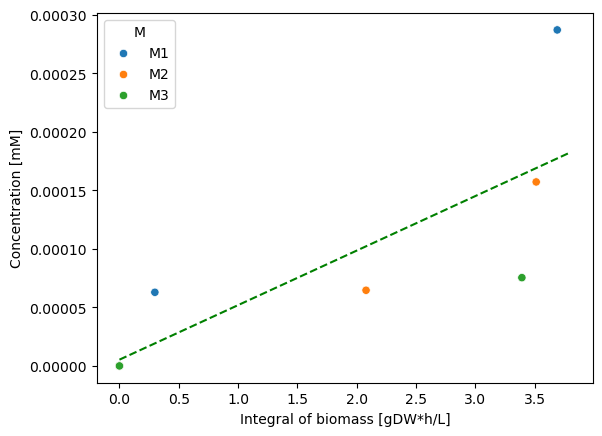

Galactose TRANS-ACONITATE
LinregressResult(slope=5.356096926472565e-06, intercept=-3.622402315557269e-07, rvalue=0.9721419191272552, pvalue=5.653027011231694e-07, stderr=4.30469297948907e-07, intercept_stderr=9.302252918898941e-07) [ 5.35609691e-06 -3.62240183e-07] [4.30469275e-07 9.30225293e-07]


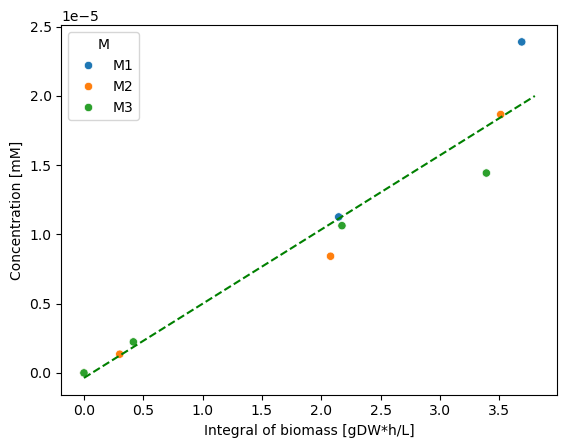

L-malate PHENYLALANINE
LinregressResult(slope=-1.4902293082722019e-05, intercept=3.213579275734075e-05, rvalue=-0.4598343561519958, pvalue=0.3588639093445174, stderr=1.438921023357909e-05, intercept_stderr=1.1244204866539012e-05) [-1.49022930e-05  3.21357927e-05] [1.43892101e-05 1.12442050e-05]


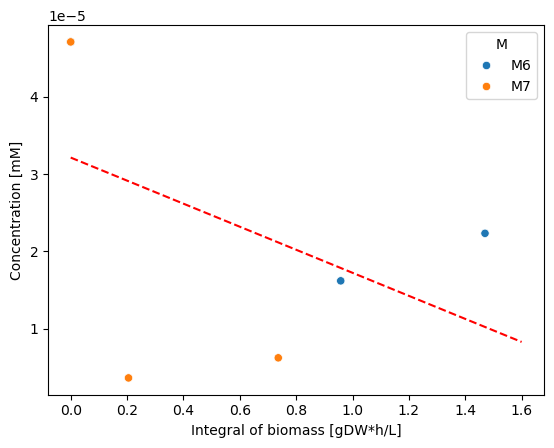

L-malate LEUCINE
LinregressResult(slope=7.131418931609746e-05, intercept=4.5530193859861655e-07, rvalue=0.998554998546392, pvalue=6.592378397746485e-05, stderr=2.2158253487184433e-06, intercept_stderr=1.5832340615388558e-06) [7.13141895e-05 4.55301744e-07] [2.21582622e-06 1.58323418e-06]


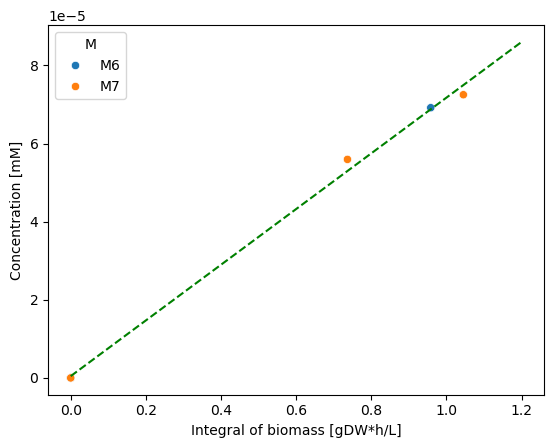

L-malate ISOLEUCINE
LinregressResult(slope=2.4368837736900054e-05, intercept=9.403314534725004e-05, rvalue=0.23901877439057162, pvalue=0.5686161745286309, stderr=4.04159778191712e-05, intercept_stderr=2.6717527731772624e-05) [2.43688386e-05 9.40331450e-05] [4.04159775e-05 2.67175277e-05]


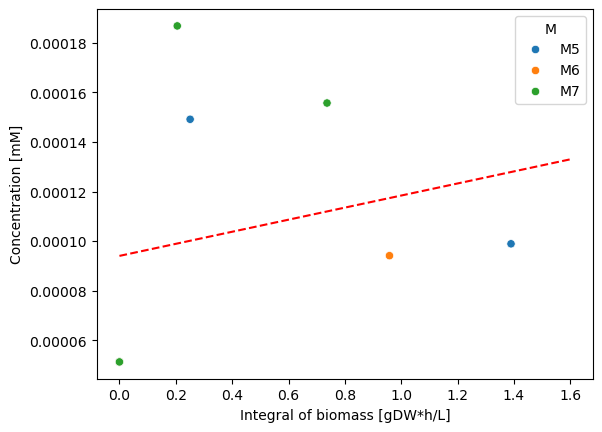

L-malate METHIONINE
LinregressResult(slope=4.424096917759282e-05, intercept=6.523304866890483e-06, rvalue=0.8995177028997379, pvalue=0.00039444240435429354, stderr=7.596899377663499e-06, intercept_stderr=5.233446561726695e-06) [4.42409692e-05 6.52330482e-06] [7.59689931e-06 5.23344652e-06]


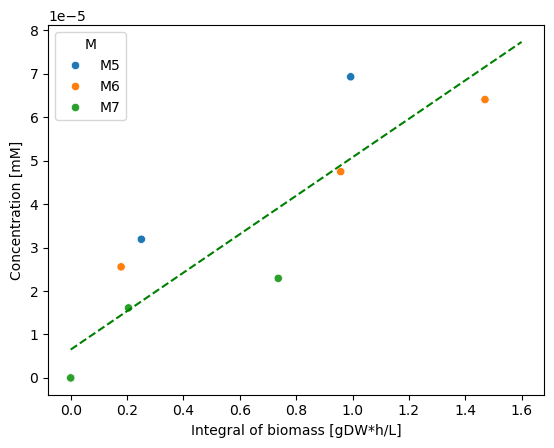

L-malate GAMMA-AMINOBUTYRATE
LinregressResult(slope=0.0012330019642421113, intercept=0.00019101382017238289, rvalue=0.7477542245526048, pvalue=0.02052693419176976, stderr=0.00041381669148598903, intercept_stderr=0.00022175811286973256) [0.001233   0.00019101] [0.00041382 0.00022176]


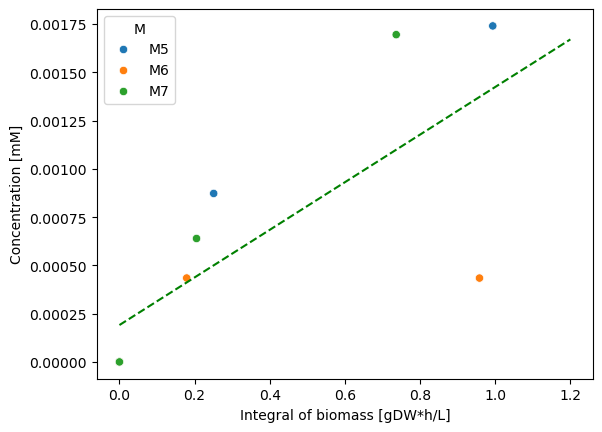

L-malate PROLINE
LinregressResult(slope=-2.1085602819601327e-05, intercept=4.0659182033039404e-05, rvalue=-0.8354230300362278, pvalue=0.009813879600217469, stderr=5.663130541035581e-06, intercept_stderr=4.998987792399411e-06) [-2.10856027e-05  4.06591819e-05] [5.66313052e-06 4.99898777e-06]


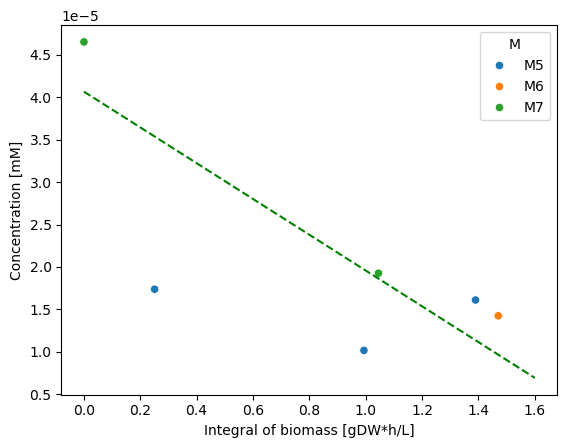

L-malate PIPECOLIC ACID
LinregressResult(slope=1.326630659750035e-05, intercept=5.422007946672068e-07, rvalue=0.8582883967010332, pvalue=0.003062338681091882, stderr=2.997968270598685e-06, intercept_stderr=2.760610268010343e-06) [1.32663065e-05 5.42200865e-07] [2.99796851e-06 2.76061022e-06]


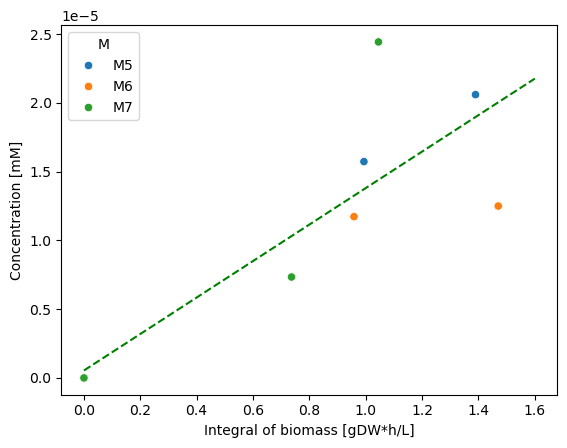

L-malate BETA-ALANINE
LinregressResult(slope=0.00014059967865445911, intercept=3.1745593879133847e-05, rvalue=0.7013032138607993, pvalue=0.01618534322576092, stderr=4.763908158809188e-05, intercept_stderr=3.711354378646785e-05) [1.40599678e-04 3.17455940e-05] [4.76390812e-05 3.71135438e-05]


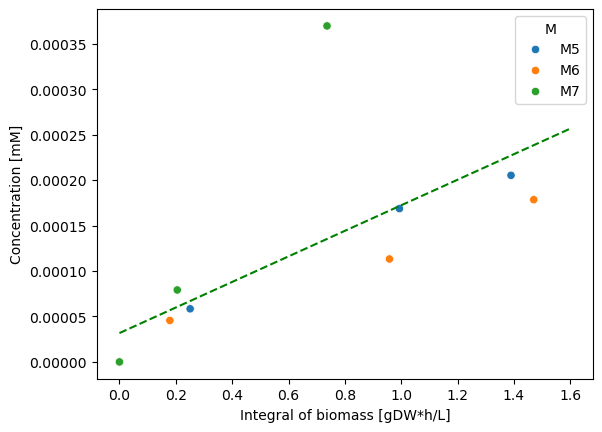

L-malate CREATINE
LinregressResult(slope=-1.1106243550527163e-07, intercept=1.8485018675512713e-06, rvalue=-0.1703953047312788, pvalue=0.7468807192418558, stderr=3.2113042927241473e-07, intercept_stderr=2.6996106534458144e-07) [-1.11062449e-07  1.84850188e-06] [3.21130434e-07 2.69961064e-07]


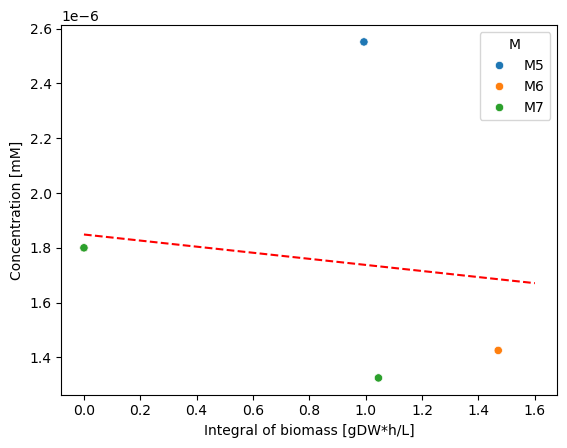

L-malate ALPHA-AMINOADIPATE
LinregressResult(slope=2.4935257314024296e-05, intercept=-1.2917767945344697e-06, rvalue=0.7711481705477893, pvalue=0.02505660459048026, stderr=8.404367566432028e-06, intercept_stderr=7.911277125006398e-06) [ 2.49352571e-05 -1.29177655e-06] [8.40436700e-06 7.91127673e-06]


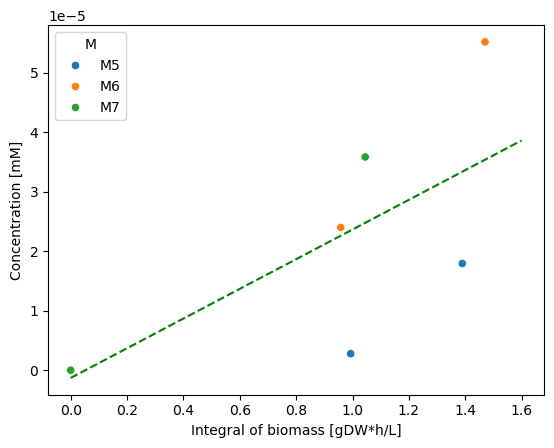

L-malate GLUTAMATE
LinregressResult(slope=0.003804340427415237, intercept=0.001780970738314742, rvalue=0.7127981525099574, pvalue=0.013817795889961876, stderr=0.0012477806882956464, intercept_stderr=0.0009090054798239447) [0.00380434 0.00178097] [0.00124778 0.00090901]


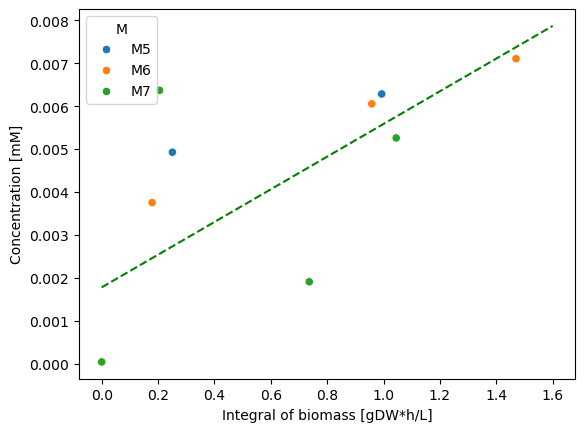

L-malate ASPARAGINE
LinregressResult(slope=0.00029499951295936183, intercept=7.552089326969643e-05, rvalue=0.9235082584197519, pvalue=0.00037795534798037506, stderr=4.631117475706579e-05, intercept_stderr=2.481745886573312e-05) [2.94999513e-04 7.55208929e-05] [4.63111747e-05 2.48174589e-05]


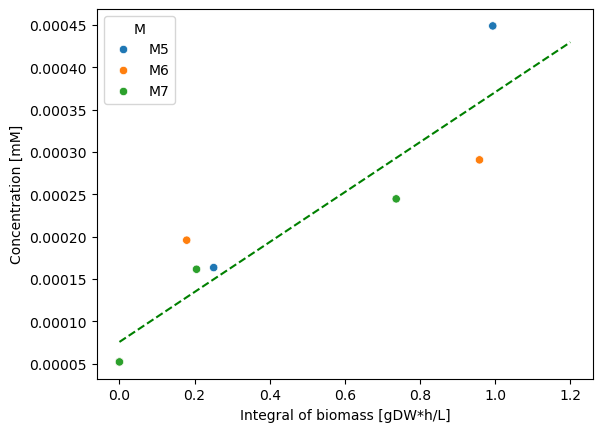

L-malate ASPARTATE
LinregressResult(slope=0.005243618210645816, intercept=0.0028445335326802027, rvalue=0.625607889056009, pvalue=0.07154373707048658, stderr=0.002471445682514459, intercept_stderr=0.0013244104017322146) [0.00524362 0.00284453] [0.00247145 0.00132441]


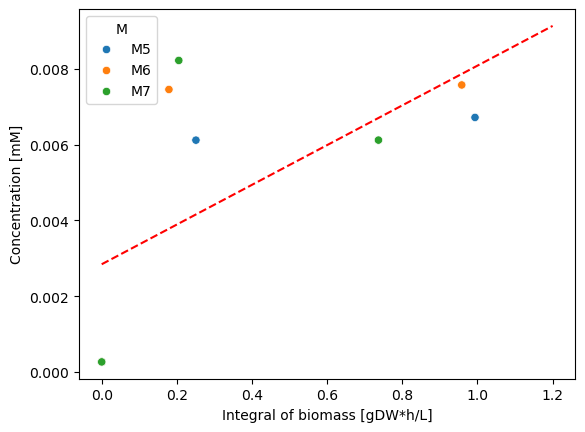

L-malate PYRUVATE
LinregressResult(slope=0.19076550811446755, intercept=0.015501245361778118, rvalue=0.8674261478923828, pvalue=0.0024478990286045804, stderr=0.041358900011421375, intercept_stderr=0.022163609650364475) [0.19076551 0.01550125] [0.0413589  0.02216361]


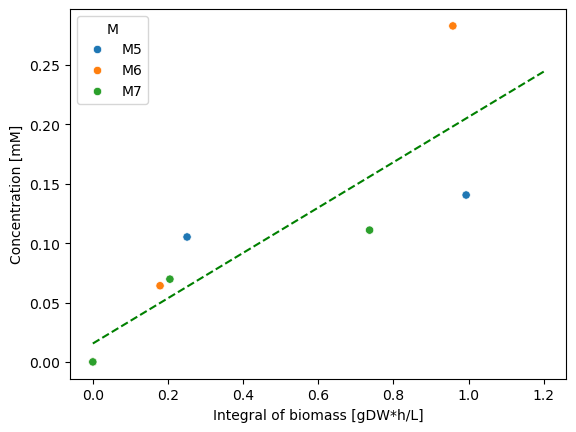

L-malate LACTATE
LinregressResult(slope=-0.0074261934002518805, intercept=0.010623586408077146, rvalue=-0.7891162942752142, pvalue=0.03488570022074928, stderr=0.0025851219776671505, intercept_stderr=0.0022314671625757914) [-0.00742619  0.01062359] [0.00258512 0.00223147]


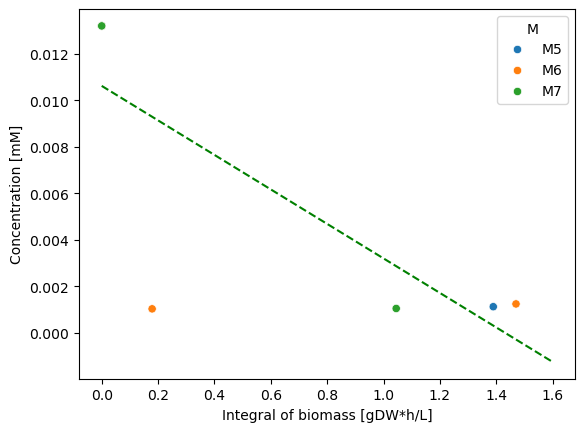

L-malate NAD
LinregressResult(slope=3.452827369383632e-05, intercept=1.1460621912276508e-05, rvalue=0.7213003127405961, pvalue=0.04343729962243946, stderr=1.3535667713627033e-05, intercept_stderr=1.0049798666122047e-05) [3.45282738e-05 1.14606218e-05] [1.35356679e-05 1.00497988e-05]


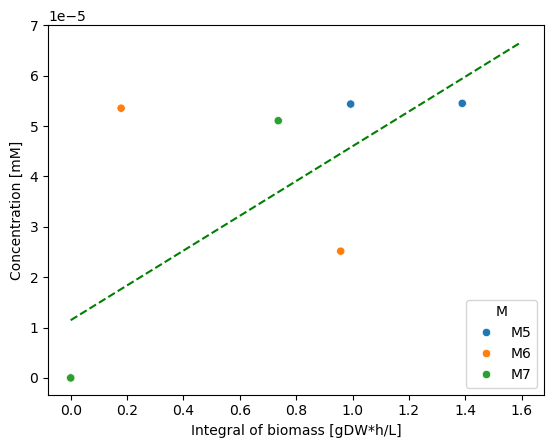

L-malate SUCCINATE
LinregressResult(slope=-0.13917537536234625, intercept=0.8193938919580422, rvalue=-0.30714510836477754, pvalue=0.38799683800386564, stderr=0.15246032789476832, intercept_stderr=0.1050287675477939) [-0.13917537  0.81939389] [0.15246033 0.10502877]


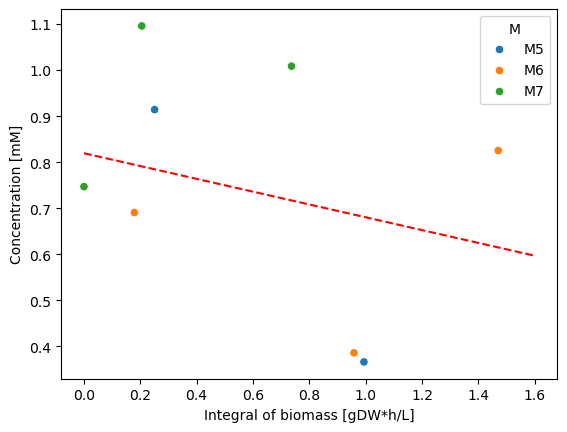

L-malate CIS-ACONITATE
LinregressResult(slope=0.0004192136326971219, intercept=-2.399387981698062e-05, rvalue=0.9811672769029155, pvalue=1.807737988906715e-08, stderr=2.609813511859926e-05, intercept_stderr=2.0998180549080343e-05) [ 4.19213633e-04 -2.39938801e-05] [2.60981357e-05 2.09981804e-05]


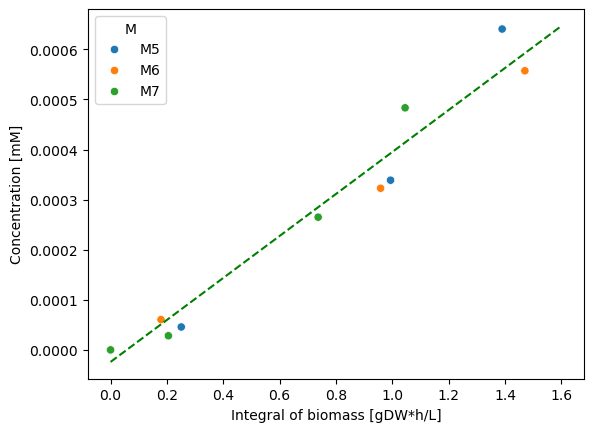

L-malate CITRATE
LinregressResult(slope=0.008201117630309864, intercept=-0.0005317363882769953, rvalue=0.6328858702234563, pvalue=0.17742067971283462, stderr=0.005016445650504324, intercept_stderr=0.004662749562240834) [ 0.00820112 -0.00053174] [0.00501645 0.00466275]


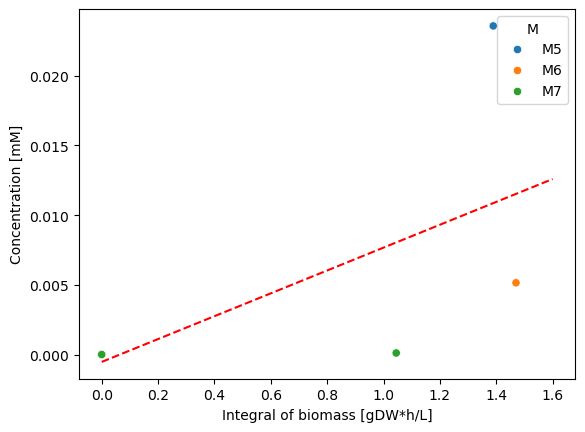

L-malate ISOCITRATE
LinregressResult(slope=0.00027624816974143146, intercept=-4.5246250424587026e-05, rvalue=0.7878524887966587, pvalue=0.020233241038586324, stderr=8.815839709036014e-05, intercept_stderr=8.298607893637009e-05) [ 2.76248169e-04 -4.52462502e-05] [8.81583976e-05 8.29860792e-05]


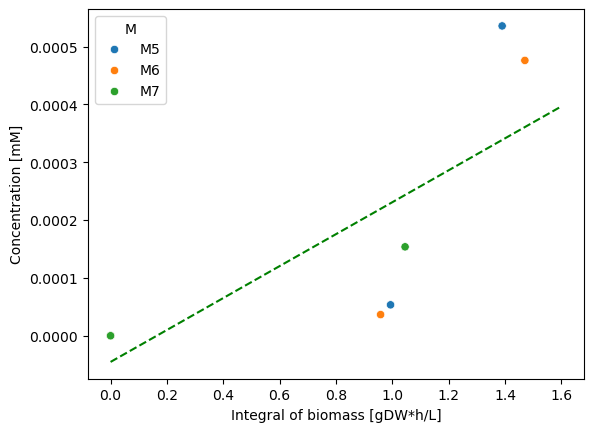

L-malate TRANS-ACONITATE
LinregressResult(slope=1.1875562987801688e-05, intercept=-2.6734494387967087e-07, rvalue=0.9686574181028552, pvalue=4.065260171254606e-06, stderr=1.0766919444693816e-06, intercept_stderr=9.431592326672865e-07) [ 1.18755630e-05 -2.67344924e-07] [1.07669184e-06 9.43159183e-07]


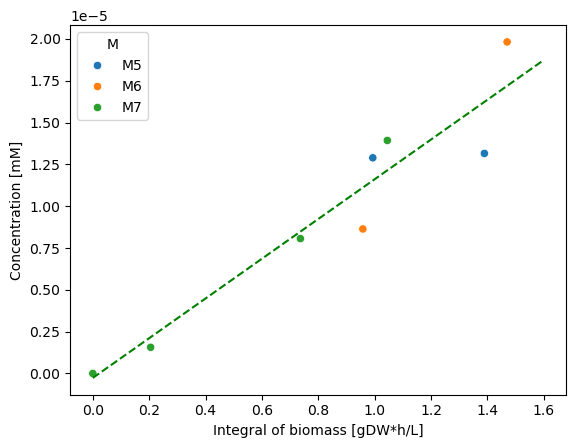

L-malate GLUTARATE
LinregressResult(slope=-0.0001844316202456825, intercept=0.003942720656109902, rvalue=-0.21803245641896896, pvalue=0.5195414557167501, stderr=0.00027517994112369223, intercept_stderr=0.00019646732031623372) [-0.00018443  0.00394272] [0.00027518 0.00019647]


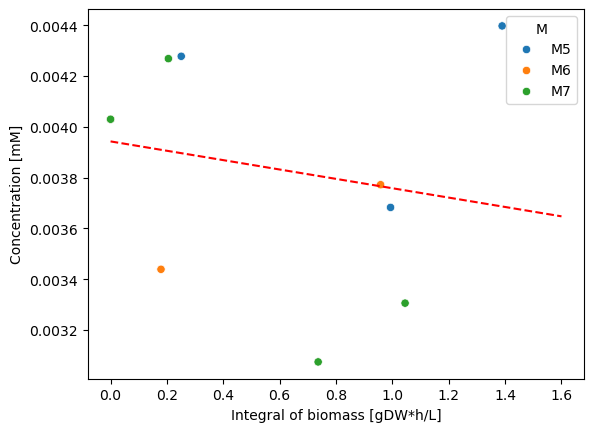

L-alanine PHENYLALANINE
LinregressResult(slope=1.3383816473329129e-05, intercept=4.771176884390897e-06, rvalue=0.5484636415370003, pvalue=0.08063204796502867, stderr=6.8015476416553845e-06, intercept_stderr=6.759531865498186e-06) [1.33838166e-05 4.77117681e-06] [6.80154758e-06 6.75953190e-06]


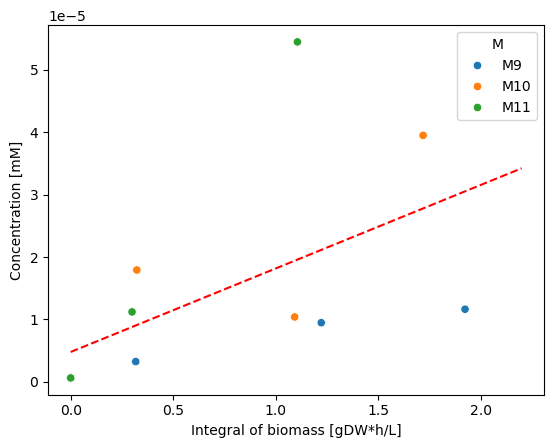

L-alanine LEUCINE
LinregressResult(slope=0.00048126459282983033, intercept=0.00040528378769447805, rvalue=0.7021721546681102, pvalue=0.010899981372466032, stderr=0.00015432088274196167, intercept_stderr=0.0001646431856333335) [0.00048126 0.00040528] [0.00015432 0.00016464]


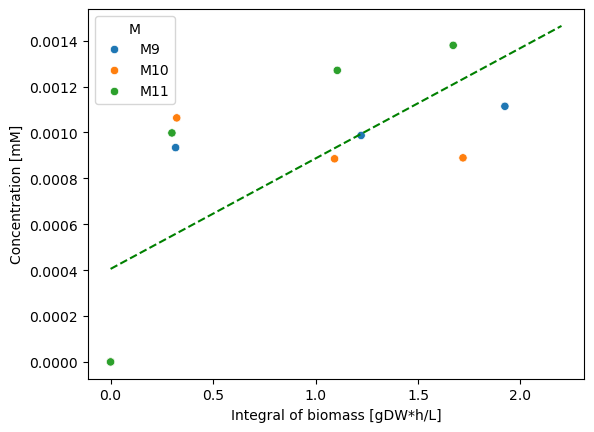

L-alanine ISOLEUCINE
LinregressResult(slope=0.0006905978205188296, intercept=7.83121338654815e-05, rvalue=0.9483888315272906, pvalue=8.75697998513386e-06, stderr=7.697100891973624e-05, intercept_stderr=7.323295984742799e-05) [6.90597821e-04 7.83121336e-05] [7.69710073e-05 7.32329594e-05]


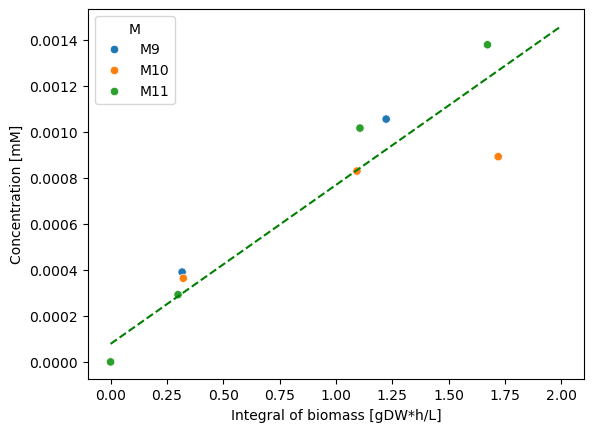

L-alanine METHIONINE
LinregressResult(slope=1.636218044721784e-05, intercept=1.085204609024941e-05, rvalue=0.6649298785188027, pvalue=0.025591492648363887, stderr=6.126464198542319e-06, intercept_stderr=6.442643656784032e-06) [1.63621802e-05 1.08520464e-05] [6.12646415e-06 6.44264369e-06]


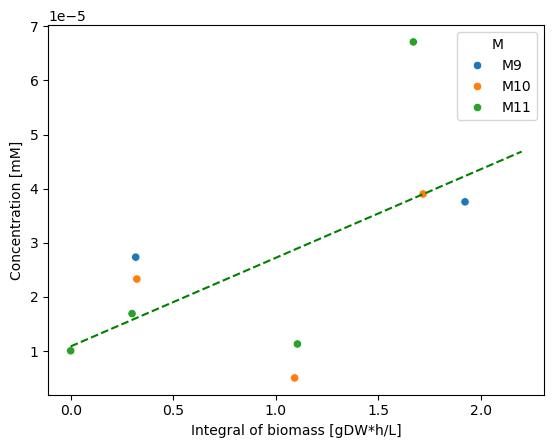

L-alanine GAMMA-AMINOBUTYRATE
LinregressResult(slope=0.008244718697952251, intercept=8.252279268061019e-05, rvalue=0.9808204190960462, pvalue=3.157532071971792e-06, stderr=0.0006192691317630568, intercept_stderr=0.0004233739932904221) [8.24471870e-03 8.25227886e-05] [0.00061927 0.00042337]


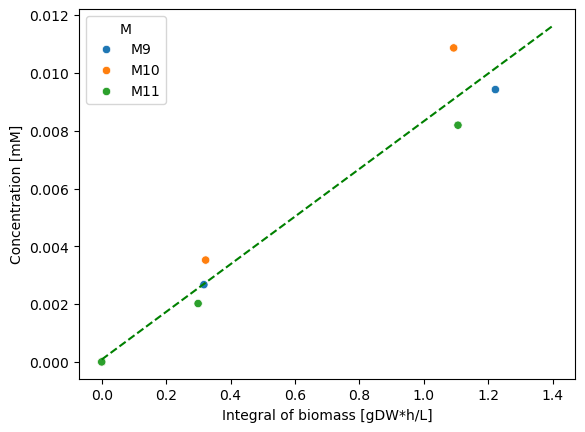

L-alanine PROLINE
LinregressResult(slope=0.0002917180769998642, intercept=9.24663574662285e-05, rvalue=0.8066420864712707, pvalue=0.00480761911677747, stderr=7.557088497883384e-05, intercept_stderr=6.395918039735611e-05) [2.91718077e-04 9.24663578e-05] [7.55708843e-05 6.39591809e-05]


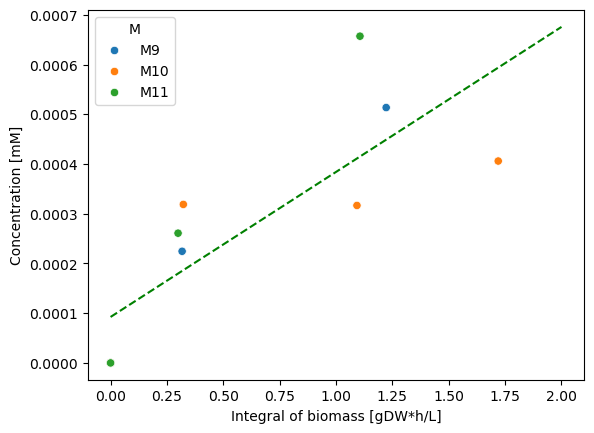

L-alanine VALINE
LinregressResult(slope=0.0028669971686928718, intercept=0.0031603380579833594, rvalue=0.620498323772574, pvalue=0.04165377685550013, stderr=0.001207804209843564, intercept_stderr=0.0011913645875192965) [0.002867   0.00316034] [0.0012078  0.00119136]


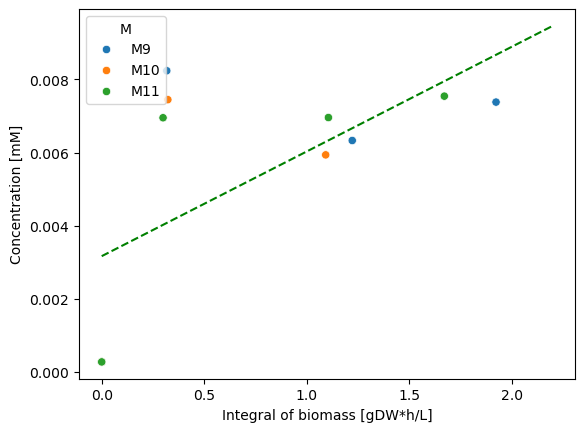

L-alanine PIPECOLIC ACID
LinregressResult(slope=2.0574061783957382e-05, intercept=9.963474777258482e-07, rvalue=0.9810454782492849, pvalue=1.8665741027402145e-08, stderr=1.2850929397968235e-06, intercept_stderr=1.3710509665554362e-06) [2.05740617e-05 9.96347658e-07] [1.28509278e-06 1.37105091e-06]


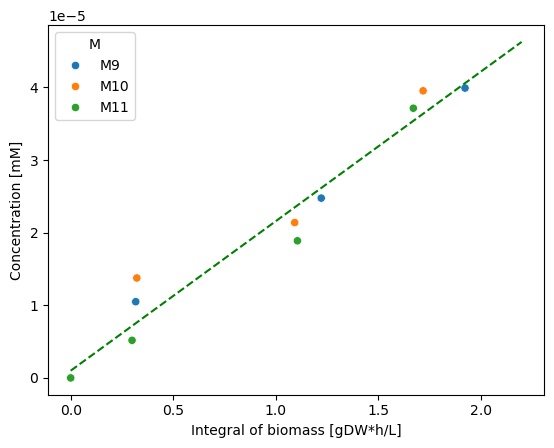

L-alanine BETA-ALANINE
LinregressResult(slope=0.0004214663889578779, intercept=-1.2561331516019027e-05, rvalue=0.9958071605665705, pvalue=1.565107518185644e-08, stderr=1.463363051375554e-05, intercept_stderr=1.7832372618230665e-05) [ 4.21466386e-04 -1.25613265e-05] [1.46336282e-05 1.78323714e-05]


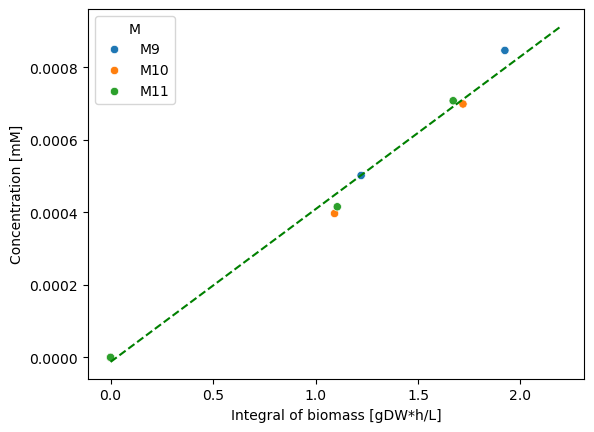

L-alanine ALANINE
LinregressResult(slope=-18.505199856139235, intercept=40.17663580681126, rvalue=-0.9920817697391716, pvalue=1.4434023736407985e-07, stderr=0.8854518192381532, intercept_stderr=0.6053543658955707) [-18.50519986  40.17663581] [0.88545182 0.60535436]


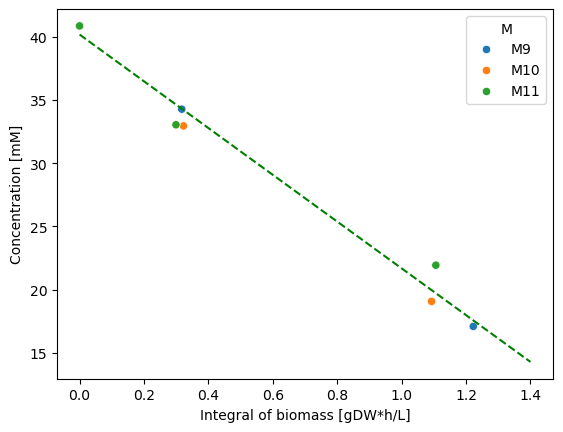

L-alanine CREATINE
LinregressResult(slope=-3.0258371767521717e-06, intercept=1.6504506624845642e-05, rvalue=-0.5246698185776135, pvalue=0.09751600885747694, stderr=1.6365294110003733e-06, intercept_stderr=1.557052380200709e-06) [-3.02583719e-06  1.65045066e-05] [1.63652940e-06 1.55705237e-06]


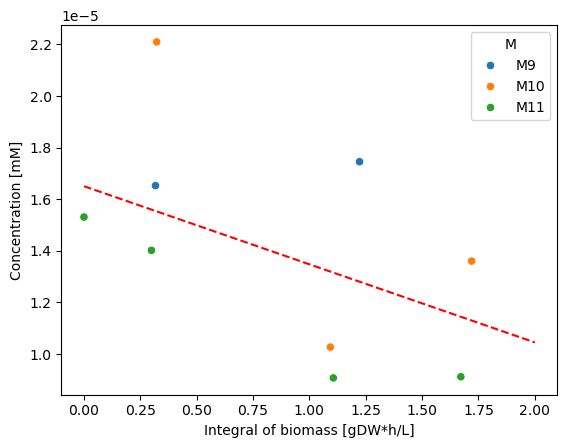

L-alanine ALPHA-AMINOADIPATE
LinregressResult(slope=6.26567525334387e-05, intercept=1.8470580981478791e-06, rvalue=0.9509427421857286, pvalue=2.387769395223123e-05, stderr=7.20679911043409e-06, intercept_stderr=7.1550297518608634e-06) [6.26567527e-05 1.84705801e-06] [7.20679959e-06 7.15502980e-06]


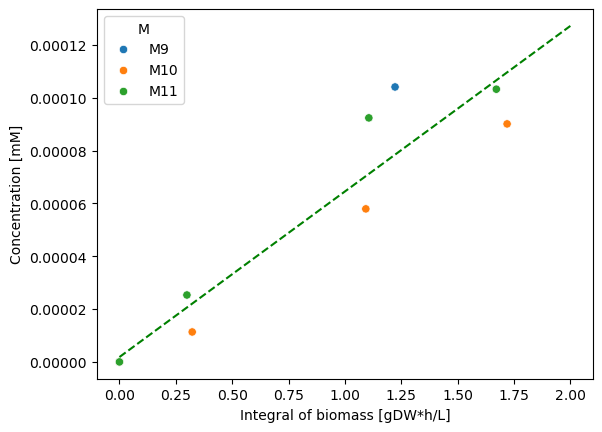

L-alanine GLUTAMATE
LinregressResult(slope=0.0017935647173529838, intercept=0.001147393492425311, rvalue=0.7012665002026112, pvalue=0.016193341009824887, stderr=0.0006077722163661165, intercept_stderr=0.0006040177735917969) [0.00179356 0.00114739] [0.00060777 0.00060402]


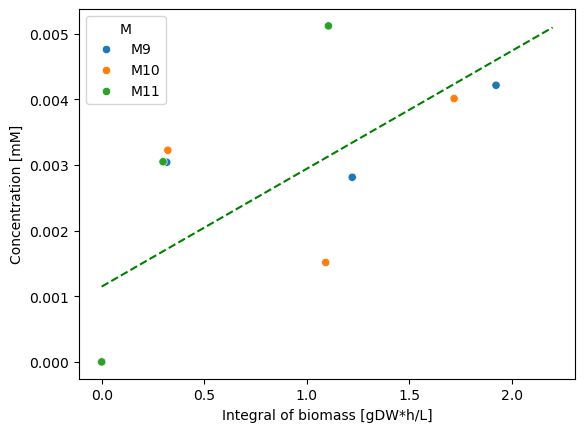

L-alanine ASPARAGINE
LinregressResult(slope=0.007486901326750941, intercept=0.002020305067024427, rvalue=0.8520343664083567, pvalue=0.003539263151554124, stderr=0.0017386050104650373, intercept_stderr=0.001188627219218406) [0.0074869  0.00202031] [0.00173861 0.00118863]


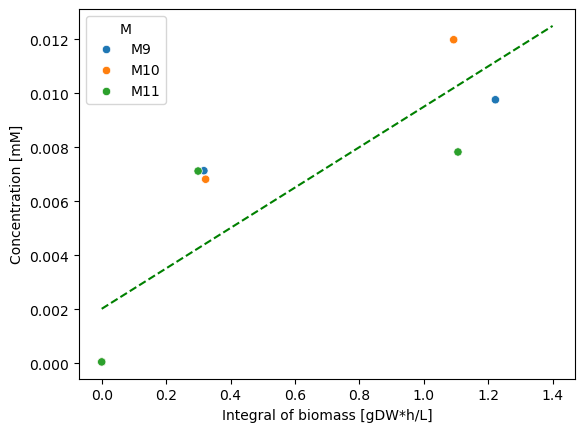

L-alanine ASPARTATE
LinregressResult(slope=3.585735843300216e-05, intercept=0.00029058725770606957, rvalue=0.2259677841165193, pvalue=0.504061902414638, stderr=5.152637124543762e-05, intercept_stderr=4.902402514218897e-05) [3.58573627e-05 2.90587255e-04] [5.15263689e-05 4.90240238e-05]


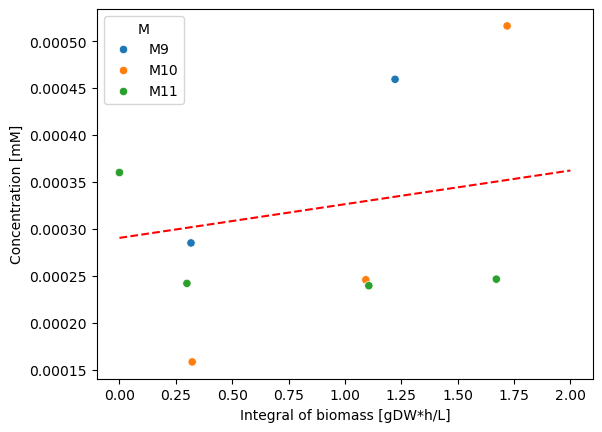

L-alanine LACTATE
LinregressResult(slope=0.00034169028871626044, intercept=0.0007579110323933556, rvalue=0.5702532897405446, pvalue=0.06698640943565728, stderr=0.0001640720929284507, intercept_stderr=0.00017253965656279703) [0.00034169 0.00075791] [0.00016407 0.00017254]


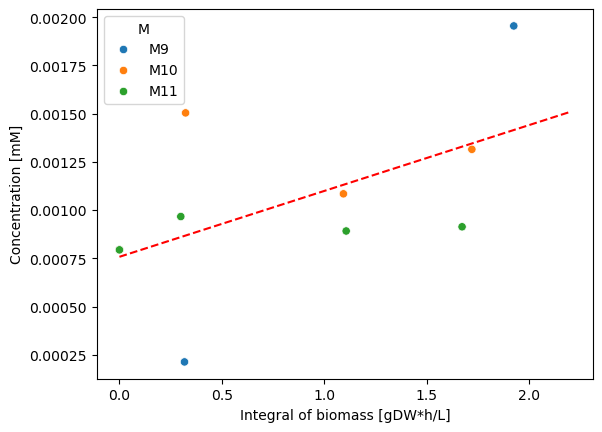

L-alanine NAD
LinregressResult(slope=6.585711342653785e-05, intercept=8.20943890763046e-06, rvalue=0.9549911605743605, pvalue=0.00022032132633614666, stderr=8.351202617244448e-06, intercept_stderr=5.1245543022156026e-06) [6.58571133e-05 8.20943900e-06] [8.35120238e-06 5.12455424e-06]


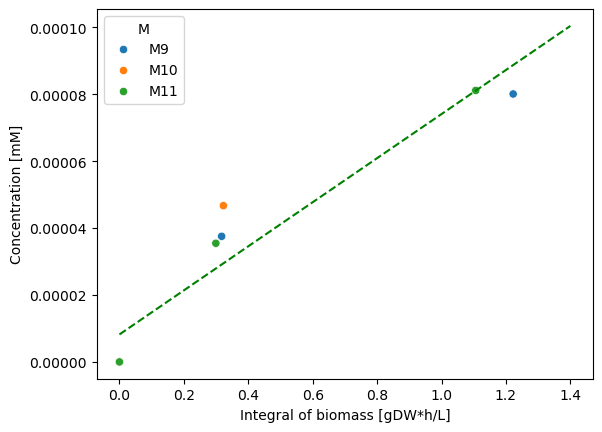

L-alanine SUCCINATE
LinregressResult(slope=0.005364494754516204, intercept=-1.7342647015628626e-05, rvalue=0.7151242390615798, pvalue=0.030339420490886115, stderr=0.00198186399478329, intercept_stderr=0.0024150765047955868) [ 5.36449478e-03 -1.73426815e-05] [0.00198187 0.00241508]


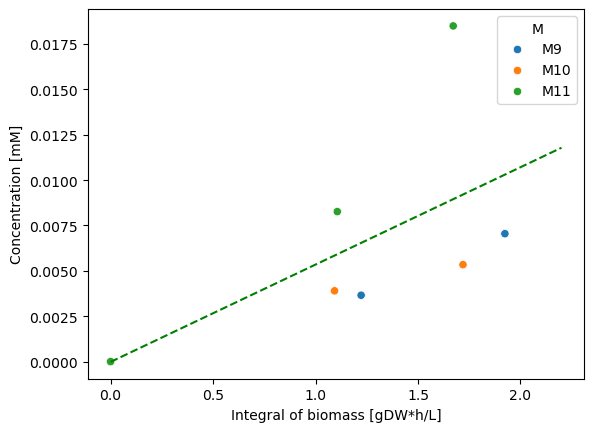

L-alanine CIS-ACONITATE
LinregressResult(slope=0.0008207480074629446, intercept=-0.00010947144688133303, rvalue=0.9683731226617905, pvalue=2.3632026340872846e-07, stderr=6.687271878452274e-05, intercept_stderr=7.134573919626822e-05) [ 0.00082075 -0.00010947] [6.68727200e-05 7.13457401e-05]


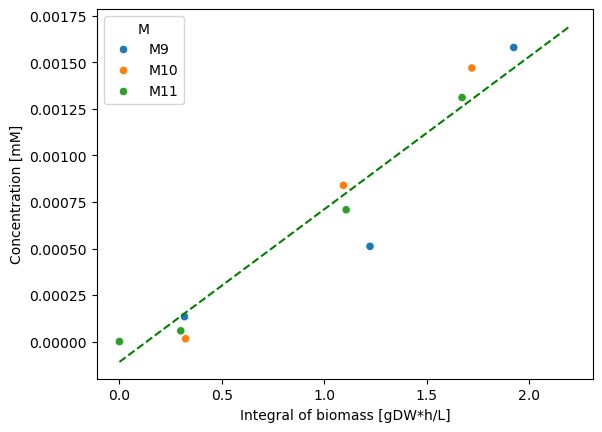

L-alanine CITRATE
LinregressResult(slope=0.0037979278347967877, intercept=0.00029615104297768145, rvalue=0.8816221397173284, pvalue=0.020190543419040956, stderr=0.0010165662216580782, intercept_stderr=0.0011170857536495547) [0.00379793 0.00029615] [0.00101657 0.00111709]


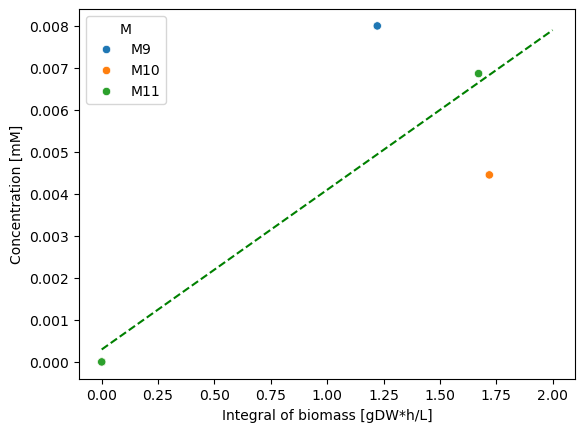

L-alanine ISOCITRATE
LinregressResult(slope=0.00035171114853916024, intercept=-5.4803574665961434e-05, rvalue=0.9200847393623101, pvalue=0.0004390424387580785, stderr=5.6595818525600167e-05, intercept_stderr=6.896700881121644e-05) [ 3.51711153e-04 -5.48035813e-05] [5.65958173e-05 6.89670078e-05]


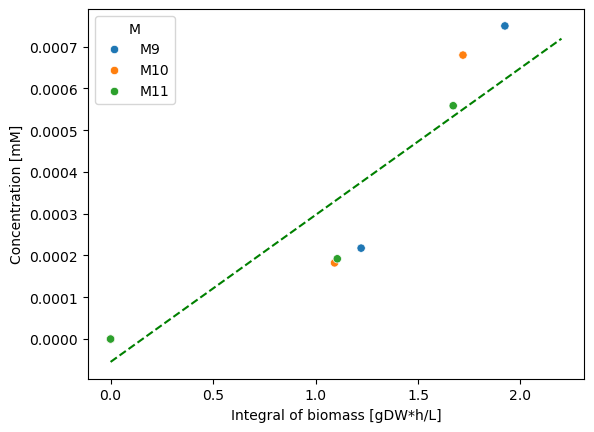

L-alanine TRANS-ACONITATE
LinregressResult(slope=1.931059820914534e-05, intercept=-1.994250878308106e-06, rvalue=0.8753492641708175, pvalue=0.0009062956088968843, stderr=3.7710115940198654e-06, intercept_stderr=4.375884652338296e-06) [ 1.93105983e-05 -1.99425095e-06] [3.77101153e-06 4.37588460e-06]


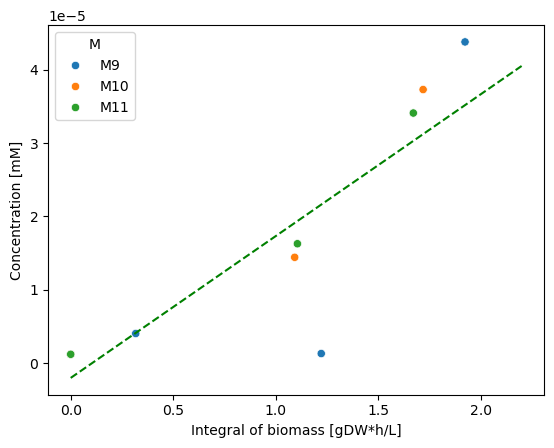

L-alanine TYROSINE
LinregressResult(slope=3.4965960533525136e-05, intercept=1.1116902822887301e-05, rvalue=0.6725395032385239, pvalue=0.1432887091586817, stderr=1.9238239134832664e-05, intercept_stderr=1.8109376990789293e-05) [3.49659606e-05 1.11169028e-05] [1.92382395e-05 1.81093771e-05]


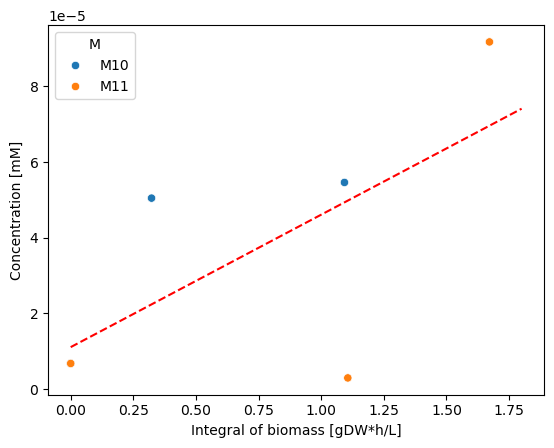

L-alanine GLUTAMINE
LinregressResult(slope=3.2216580372843586e-05, intercept=4.914744810652646e-05, rvalue=0.25792132236667503, pvalue=0.5765566606649692, stderr=5.3970806426895625e-05, intercept_stderr=5.764551412491064e-05) [3.22165786e-05 4.91474492e-05] [5.39708066e-05 5.76455140e-05]


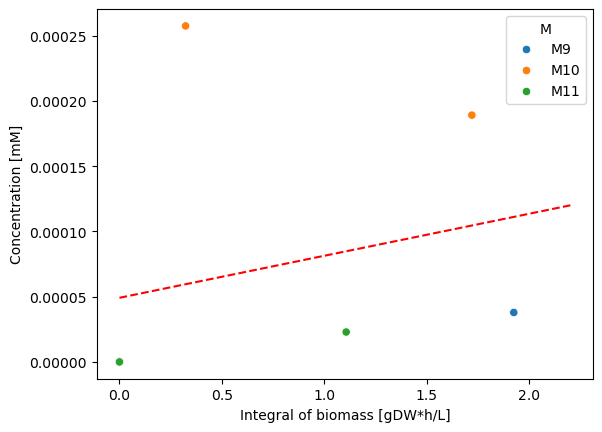

L-alanine LYSINE
LinregressResult(slope=0.002953149388620016, intercept=0.0019161486795401562, rvalue=0.5772340250189832, pvalue=0.10363766750474847, stderr=0.0015790015504928297, intercept_stderr=0.0010795115686465383) [0.00295315 0.00191615] [0.001579   0.00107951]


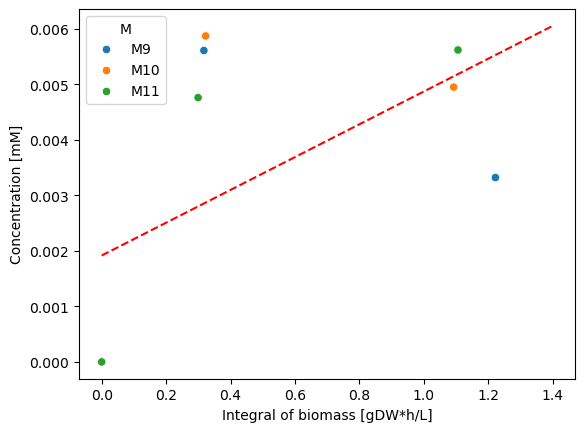

L-alanine ALPHA-AMINOBUTYRATE
LinregressResult(slope=0.19051853615325826, intercept=0.051052506378442, rvalue=0.947501955164764, pvalue=2.87463320220528e-06, stderr=0.020331416492491056, intercept_stderr=0.02169135583133635) [0.19051854 0.05105251] [0.02033142 0.02169136]


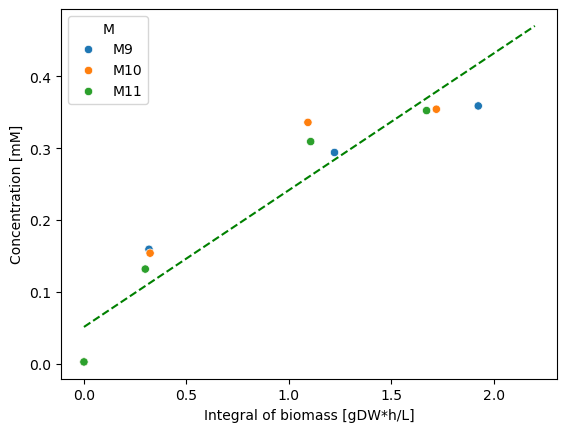

L-alanine GLYCINE
LinregressResult(slope=0.03674807850477763, intercept=0.008009505346937281, rvalue=0.9219940398041944, pvalue=5.40459367555895e-05, stderr=0.00514428687088067, intercept_stderr=0.004894457785420257) [0.03674808 0.00800951] [0.00514429 0.00489446]


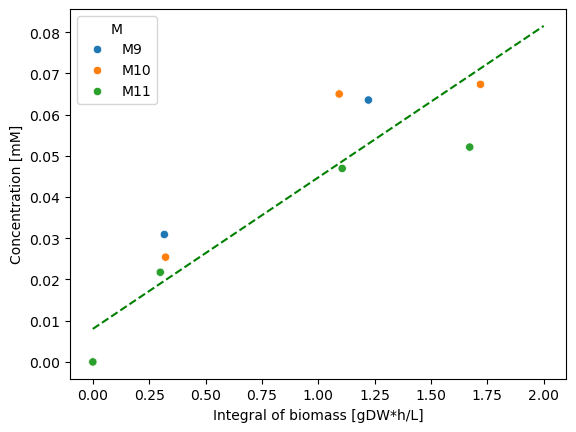

L-alanine SERINE
LinregressResult(slope=0.0006333073661321374, intercept=0.0001549198424298938, rvalue=0.8166630582866989, pvalue=0.003936301546893232, stderr=0.00015822999665735118, intercept_stderr=0.0001407099332253452) [0.00063331 0.00015492] [0.00015823 0.00014071]


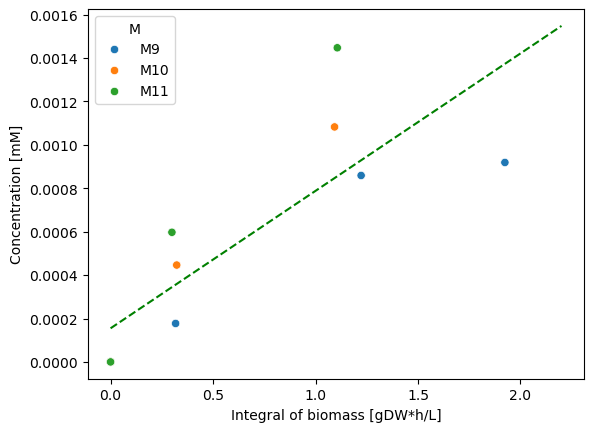

In [81]:
average_rate_data = []
for cs in df_conc_biomass['Carbon source'].unique():
    for m in df_conc_biomass.Metabolite.unique():
        idx = (df_conc_biomass['Carbon source'] == cs) & (df_conc_biomass.Metabolite==m)
        # nonmedium_idx = df_conc_biomass.Time >= 0
        # idx = idx & nonmedium_idx
        if len( df_conc_biomass.loc[idx, 'Concentration [mM]']) > 3:
            print(cs, m)
            ax = sns.scatterplot(data = df_conc_biomass.loc[idx,:], x = 'Integral of biomass [gDW*h/L]', 
                            y = 'Concentration [mM]', hue = 'M')
            popt, pcov = scipy.optimize.curve_fit(lambda x,a,b: (a*x)+b, 
                            df_conc_biomass.loc[idx, 'Integral of biomass [gDW*h/L]'], 
                            df_conc_biomass.loc[idx, 'Concentration [mM]'])
            perr = np.sqrt(np.diag(pcov))
            res = scipy.stats.linregress(df_conc_biomass.loc[idx, 'Integral of biomass [gDW*h/L]'], 
                                        df_conc_biomass.loc[idx, 'Concentration [mM]'])
            print(res, popt, perr)
            average_rate_data.append([cs, m, popt[0], perr[0], len(df_conc_biomass.loc[idx,:].M.unique()), len(df_conc_biomass.loc[idx,:]), res.pvalue])
            x_max = df_conc_biomass.loc[idx,'Integral of biomass [gDW*h/L]'].max()
            x_arr = np.arange(0, x_max+0.3, 0.2)
            yfit = popt[1]+popt[0]*x_arr
            if res.pvalue < 0.05:
                c = 'g'
            else:
                c = 'r'
            ax.plot(x_arr, yfit, ls = '--', c = c)
            plt.show()

average_rate_df = pd.DataFrame(average_rate_data, columns = ['Carbon source', 'Metabolite', 'Rate', 'Rate std', 'N bioreactors', 'N samples', 'pvalue'])

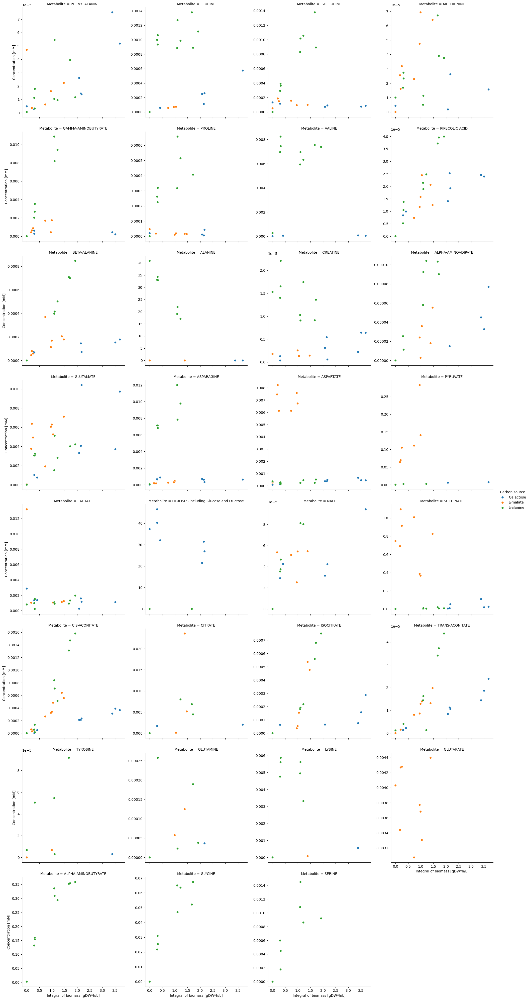

In [39]:
sns.relplot(data = df_conc_biomass, x = 'Integral of biomass [gDW*h/L]', y = 'Concentration [mM]', col = 'Metabolite', col_wrap=4, facet_kws={'sharey': False}, hue = 'Carbon source')
plt.show()

In [40]:
model_ez = cobra.io.read_sbml_model('../../models/e_coli/momentiJO1366.xml')
model_ez.id = 'moment-iJO1366'
model_ez.solver = 'gurobi'
model_ez.reactions.EX_glc__D_e.lower_bound = 0


Set parameter Username
Academic license - for non-commercial use only - expires 2024-12-19


In [83]:
cs_to_exchange = {
    'Galactose': 'EX_gal_e',
    'L-malate': 'EX_mal__L_e',
    'L-alanine': 'EX_ala__L_e'
}

In [84]:
measured_metabolite_ids = [f'{m_id}_c' for m_id in mapping_dict.values() if isinstance(m_id, str)]

In [85]:
uptake_rate = 5
sp_dict = {}
for cs, ex_id in cs_to_exchange.items():
    with model_ez as model:
        r_ex = model.reactions.get_by_id(ex_id)
        r_ex.lower_bound = - uptake_rate
        sp_dict[cs] = leakage.estimate_shadow_prices(model, delta = 0.01, metabolites=measured_metabolite_ids)
        

In [86]:
mv_df = pd.DataFrame(sp_dict)*-1

In [88]:
data = []
Nc = []
mass = []
for _, row in df_rate.iterrows():
    cs = row['Carbon source']
    met = row['Metabolite'].strip()
    bigg_id = mapping_dict[met]
    if isinstance(bigg_id, str):
        data.append(-sp_dict[cs][f'{bigg_id}_c'])

        m = model_ez.metabolites.get_by_id(f'{bigg_id}_c')
        Nc.append(m.elements['C'])
        mass.append(m.formula_weight)
    else:
        data.append(np.nan)
        Nc.append(np.nan)
        mass.append(np.nan)
        
df_rate['Metabolite value'] = data
df_rate['N carbons'] = Nc
df_rate['Mol weight'] = mass

In [89]:
df_rate = pd.read_csv('sintef_2023_rates_0824.csv', index_col=0)

In [90]:
df_rate['C-normalized rate'] = df_rate['Rate [mmol/gDW/h]']*df_rate['N carbons']
df_rate['C-normalized MV'] = df_rate['Metabolite value [gDW/mmol]']/df_rate['N carbons']

In [91]:
df_rate['M-normalized rate'] = df_rate['Rate [mmol/gDW/h]']*df_rate['Mol weight [g/mol]']
df_rate['M-normalized MV'] = df_rate['Metabolite value [gDW/mmol]']/df_rate['Mol weight [g/mol]']

In [92]:
df_rate['log10(rate)'] = np.log10(df_rate['Rate [mmol/gDW/h]'])
df_rate['log10(MV)'] = np.log10(df_rate['Metabolite value [gDW/mmol]'])
df_rate['log10(C-rate)'] = np.log10(df_rate['C-normalized rate'])
df_rate['log10(C-MV)'] = np.log10(df_rate['C-normalized MV'])
df_rate['log10(M-rate)'] = np.log10(df_rate['M-normalized rate'])
df_rate['log10(M-MV)'] = np.log10(df_rate['M-normalized MV'])

/Users/ssulheim/anaconda3/envs/pandas2/lib/python3.12/site-packages/pandas/core/arraylike.py:399: RuntimeWarning: invalid value encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)
/Users/ssulheim/anaconda3/envs/pandas2/lib/python3.12/site-packages/pandas/core/arraylike.py:399: RuntimeWarning: invalid value encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)
/Users/ssulheim/anaconda3/envs/pandas2/lib/python3.12/site-packages/pandas/core/arraylike.py:399: RuntimeWarning: invalid value encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)


In [93]:
### DEPRECATED
# This does not make sense and gives very noisy data
data = []
for _, row in average_rate_df.iterrows():
    cs = row['Carbon source']
    met = row['Metabolite']
    bigg_id = mapping_dict[met]
    if isinstance(bigg_id, str):
        data.append(-sp_dict[cs][f'{bigg_id}_c'])
    else:
        data.append(np.nan)
        
average_rate_df['Metabolite value'] = data

In [94]:
average_rate_df['log10(rate)'] = np.log10(average_rate_df['Rate'])
average_rate_df['log10(MV)'] = np.log10(average_rate_df['Metabolite value'])

/Users/ssulheim/anaconda3/envs/pandas2/lib/python3.12/site-packages/pandas/core/arraylike.py:399: RuntimeWarning: invalid value encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)


In [103]:

for cs in average_rate_df['Carbon source'].unique():
    idx = average_rate_df['Carbon source'] == cs
    nanidx = average_rate_df[['Rate', 'Metabolite value']].isna().any(axis=1)
    secretion_rates = (average_rate_df['Rate'] > 0) & (average_rate_df['Rate'] > average_rate_df['Rate std'])
    idx = idx&~nanidx&secretion_rates
    pcorr, ppval = st.pearsonr(np.log10(average_rate_df.loc[idx, 'Rate']), np.log10(average_rate_df.loc[idx, 'Metabolite value']))
    scorr, spval = st.spearmanr(np.log10(average_rate_df.loc[idx, 'Rate']), np.log10(average_rate_df.loc[idx, 'Metabolite value']))
    print(cs, pcorr, ppval, scorr, spval)
    print(idx.sum())

Galactose -0.561734035594444 0.03657528088811542 -0.6 0.02330841087999998
14
L-malate -0.5712986546144 0.04139903368453748 -0.5934065934065934 0.03252444027009699
13
L-alanine -0.6417541369737559 0.0017126778058268977 -0.5701298701298702 0.006966166514889725
21


<Axes: xlabel='log10(MV)', ylabel='log10(rate)'>

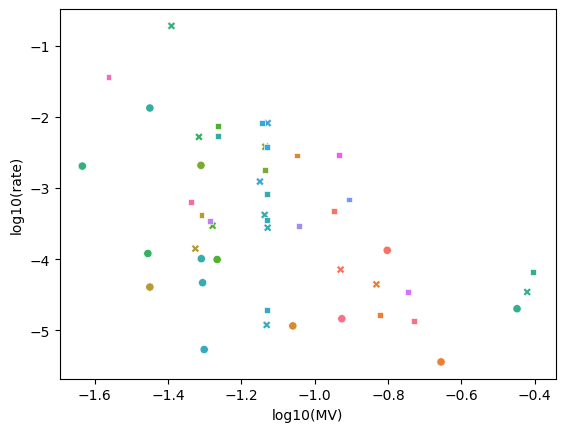

In [105]:
secretion_idx = (average_rate_df['Rate'] > 0) & (average_rate_df['Rate'] > average_rate_df['Rate std'])
sns.scatterplot(data=average_rate_df.loc[secretion_idx], y = 'log10(rate)', x = 'log10(MV)', hue = 'Metabolite', style = 'Carbon source', legend=False)


In [ ]:
# average_rate_df['log10(rate)'] = np.log10(average_rate_df['Rate'])
# average_rate_df['log10(MV)'] = np.log10(average_rate_df['Metabolite value'])

In [53]:
df_rate_i1 = df_rate.dropna()
# dfmean = df_rate_i1.groupby(['Carbon source', 'Metabolite']).mean().reset_index()
# idxsign = df_rate_i1['Rate [mmol/gDW/h]']>np.sqrt(df_rate_i1['Rate var'])

In [106]:
for cs in df_rate_i1['Carbon source'].unique():
    idx = df_rate_i1['Carbon source'] == cs
    # idx = idx & idxsign
    pcorr, ppval = st.pearsonr(df_rate_i1.loc[idx, 'log10(rate)'], df_rate_i1.loc[idx, 'log10(MV)'])
    scorr, spval = st.spearmanr(df_rate_i1.loc[idx, 'log10(rate)'], df_rate_i1.loc[idx, 'log10(MV)'])
    print(cs, pcorr, ppval, scorr, spval)

Galactose -0.5429344566978918 0.00011647589117059306 -0.5995783838881228 1.3466924654959984e-05
L-malate -0.5813702693926427 0.00012933531260528753 -0.707967028493031 6.643875540695383e-07
L-alanine -0.5885433064381392 3.1422006518395273e-07 -0.5746038065112039 6.865822475175945e-07


In [107]:
for cs in df_rate_i1['Carbon source'].unique():
    idx = df_rate_i1['Carbon source'] == cs
    pcorr, ppval = st.pearsonr(df_rate_i1.loc[idx, 'log10(C-rate)'], df_rate_i1.loc[idx, 'log10(C-MV)'])
    scorr, spval = st.spearmanr(df_rate_i1.loc[idx, 'log10(C-rate)'], df_rate_i1.loc[idx, 'log10(C-MV)'])
    print(cs, pcorr, ppval, scorr, spval)

Galactose -0.3911082867344255 0.007894579321659883 -0.18912875196470988 0.21339708235876514
L-malate -0.39804122993904706 0.013325392711518131 -0.41127215794910316 0.010311803041827928
L-alanine -0.3808471970887253 0.0019051404024515075 -0.28617918268302645 0.021877639018358135


In [108]:
for cs in df_rate_i1['Carbon source'].unique():
    idx = df_rate_i1['Carbon source'] == cs
    pcorr, ppval = st.pearsonr(df_rate_i1.loc[idx, 'log10(M-rate)'], df_rate_i1.loc[idx, 'log10(M-MV)'])
    scorr, spval = st.spearmanr(df_rate_i1.loc[idx, 'log10(M-rate)'], df_rate_i1.loc[idx, 'log10(M-MV)'])
    print(cs, pcorr, ppval, scorr, spval)

Galactose -0.45298852533649814 0.0017800596823032938 -0.38096217042071834 0.009827818545396374
L-malate -0.447352892979619 0.004862213849636753 -0.43276225204615043 0.006653354643788772
L-alanine -0.4682434498399261 9.545833451448997e-05 -0.469136810683344 9.217911472756412e-05


In [111]:
less_than_2 = (df_rate_i1.groupby(['Carbon source', 'Metabolite'])['M'].count() < 2).to_dict()
less_than_3 = (df_rate_i1.groupby(['Carbon source', 'Metabolite'])['M'].count() < 3).to_dict()

In [60]:
df_rate_i1_mean = df_rate_i1.groupby(['Carbon source', 'Metabolite']).mean(['Rate [mmol/gDW/h]', 'Metabolite value [gDW/mmol]']).reset_index()
df_rate_i1_mean['log10(rate)'] = np.log10(df_rate_i1_mean['Rate [mmol/gDW/h]'])
df_rate_i1_mean['log10(MV)'] = np.log10(df_rate_i1_mean['Metabolite value [gDW/mmol]'])

In [116]:
df_rate_i1_mean_r2 = df_rate_i1_mean.copy()
df_rate_i1_mean_r3 = df_rate_i1_mean.copy()
remove2 = []
remove3 = []
for i, row in df_rate_i1_mean_r.iterrows():
    if less_than_2[row['Carbon source'], row['Metabolite']]:
        remove2.append(i)
    if less_than_3[row['Carbon source'], row['Metabolite']]:
        remove3.append(i)
    
df_rate_i1_mean_r2.drop(index = remove2, inplace=True)
df_rate_i1_mean_r3.drop(index = remove3, inplace=True)

print("If only counting those with rates estimated in all three parallels")
for cs in df_rate_i1_mean_r3['Carbon source'].unique():
    idx = df_rate_i1_mean_r3['Carbon source'] == cs
    pcorr, ppval = st.pearsonr(df_rate_i1_mean_r3.loc[idx, 'log10(rate)'], df_rate_i1_mean_r3.loc[idx, 'log10(MV)'])
    scorr, spval = st.spearmanr(df_rate_i1_mean_r3.loc[idx, 'log10(rate)'], df_rate_i1_mean_r3.loc[idx, 'log10(MV)'])
    print(cs, pcorr, ppval, scorr, spval)

print("If only counting those with rates estimated in at least two parallels")
for cs in df_rate_i1_mean_r2['Carbon source'].unique():
    idx = df_rate_i1_mean_r2['Carbon source'] == cs
    pcorr, ppval = st.pearsonr(df_rate_i1_mean_r2.loc[idx, 'log10(rate)'], df_rate_i1_mean_r2.loc[idx, 'log10(MV)'])
    scorr, spval = st.spearmanr(df_rate_i1_mean_r2.loc[idx, 'log10(rate)'], df_rate_i1_mean_r2.loc[idx, 'log10(MV)'])
    print(cs, pcorr, ppval, scorr, spval)
    
print("If counting all estimated rates")
for cs in df_rate_i1_mean['Carbon source'].unique():
    idx = df_rate_i1_mean['Carbon source'] == cs
    pcorr, ppval = st.pearsonr(df_rate_i1_mean.loc[idx, 'log10(rate)'], df_rate_i1_mean.loc[idx, 'log10(MV)'])
    scorr, spval = st.spearmanr(df_rate_i1_mean.loc[idx, 'log10(rate)'], df_rate_i1_mean.loc[idx, 'log10(MV)'])
    print(cs, pcorr, ppval, scorr, spval)

If only counting those with rates estimated in all three parallels
Galactose -0.51238538253262 0.050836488906149425 -0.47857142857142854 0.07113080825563321
L-alanine -0.5495060280685354 0.008072053783706748 -0.4703557312252965 0.027168310320796737
L-malate -0.698767986005819 0.011463832254526199 -0.7762237762237763 0.0029928636801859797
If only counting those with rates estimated in at least two parallels
Galactose -0.5880107261464211 0.005055618660747172 -0.6610389610389611 0.0011040228328465572
L-alanine -0.5033053321025954 0.008766601815349677 -0.455042735042735 0.019503823561301006
L-malate -0.6356621492936481 0.0060979727378009845 -0.7720588235294118 0.00028201264704692656
If counting all estimated rates
Galactose -0.5880107261464211 0.005055618660747172 -0.6610389610389611 0.0011040228328465572
L-alanine -0.5033053321025954 0.008766601815349677 -0.455042735042735 0.019503823561301006
L-malate -0.6356621492936481 0.0060979727378009845 -0.7720588235294118 0.00028201264704692656


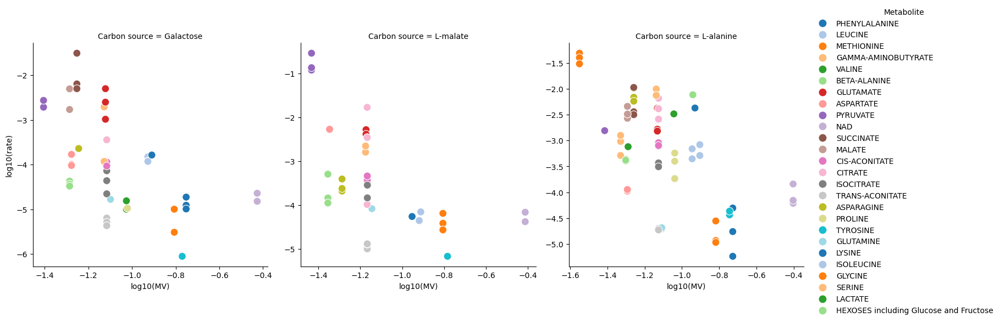

In [62]:
sns.relplot(data = df_rate_i1, y = 'log10(rate)', x = 'log10(MV)', col = 'Carbon source', facet_kws={'sharey': False, 'sharex': False}, hue = 'Metabolite', s = 100, palette = 'tab20')#
plt.show()

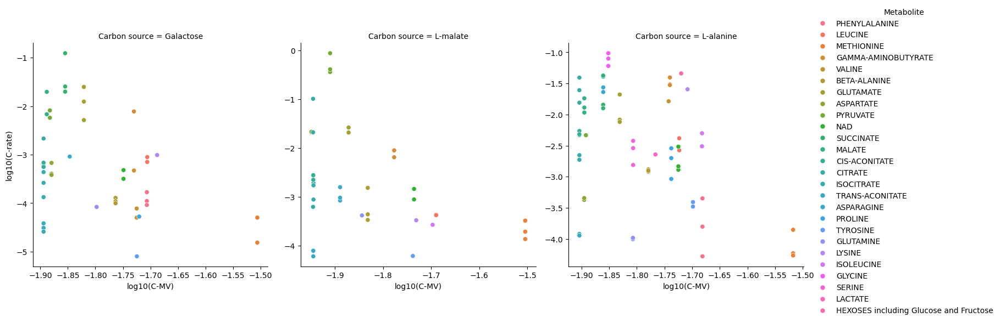

In [63]:
sns.relplot(data = df_rate_i1, y = 'log10(C-rate)', x = 'log10(C-MV)', col = 'Carbon source', facet_kws={'sharey': False, 'sharex': False}, hue = 'Metabolite')#
plt.show()

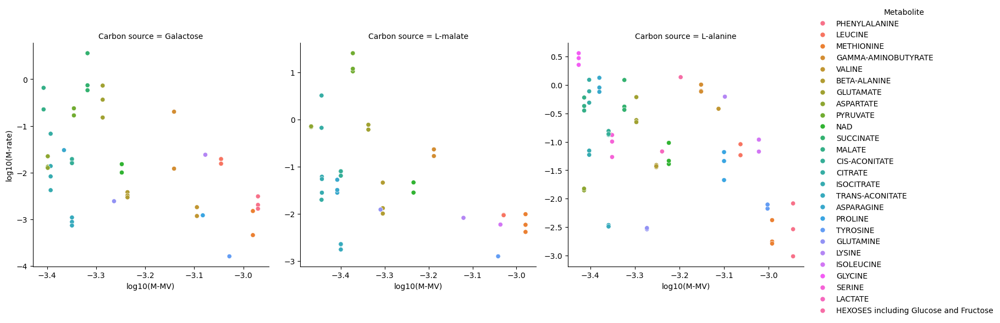

In [64]:
sns.relplot(data = df_rate_i1, y = 'log10(M-rate)', x = 'log10(M-MV)', col = 'Carbon source', facet_kws={'sharey': False, 'sharex': False}, hue = 'Metabolite')#
plt.show()

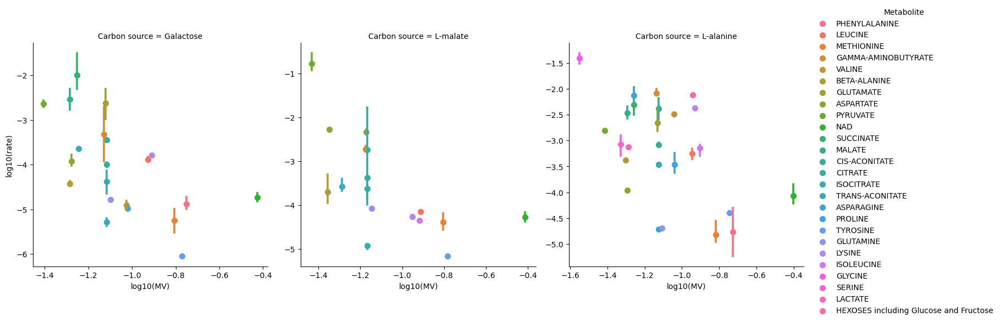

In [65]:
sns.lmplot(data = df_rate_i1, y = 'log10(rate)', x = 'log10(MV)', col = 'Carbon source', facet_kws={'sharey': False, 'sharex': False}, hue = 'Metabolite', x_estimator=np.mean)#
plt.show()

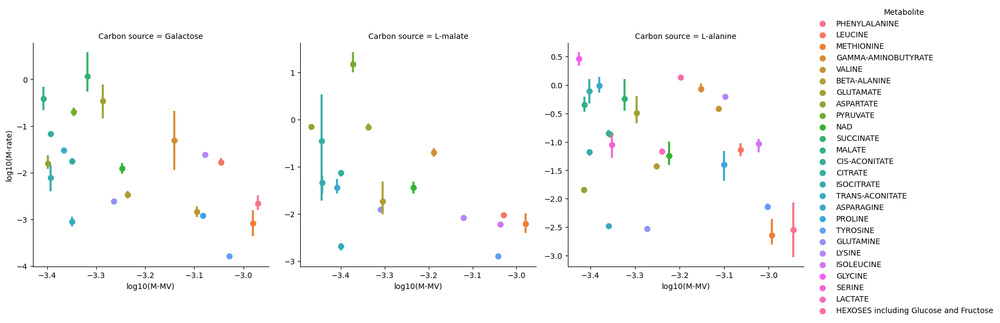

In [66]:
sns.lmplot(data = df_rate_i1, y = 'log10(M-rate)', x = 'log10(M-MV)', col = 'Carbon source', facet_kws={'sharey': False, 'sharex': False}, hue = 'Metabolite', x_estimator=np.mean)#
plt.show()

In [80]:
df_rate.loc[df_rate.isna().any(axis = 1)].head(20)

,M,Metabolite,Carbon source,Rate [mmol/gDW/h],Rate std,Metabolite value [gDW/mmol],N carbons,Mol weight [g/mol],Turnover [mmol/gDW/h],BiGG ID,...,C-normalized rate,C-normalized MV,M-normalized rate,M-normalized MV,log10(rate),log10(MV),log10(C-rate),log10(C-MV),log10(M-rate),log10(M-MV)
2,M1,ISOLEUCINE,Galactose,-0.000011,3.484218e-06,0.131459,6.0,131.17292,0.074633,ile__L,...,-0.000066,0.021910,-0.001437,0.001002,NaN,-0.881209,NaN,-1.659360,NaN,-2.999053
5,M1,PROLINE,Galactose,-0.000007,inf,0.095190,5.0,115.13046,0.056786,pro__L,...,-0.000033,0.019038,-0.000768,0.000827,NaN,-1.021410,NaN,-1.720380,NaN,-3.082600
7,M1,PIPECOLIC ACID,Galactose,0.000012,inf,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,-4.929951,NaN,NaN,NaN,NaN,NaN
9,M1,ALANINE,Galactose,-0.000505,inf,0.047586,3.0,89.09318,0.258510,ala__L,...,-0.001514,0.015862,-0.044963,0.000534,NaN,-1.322520,NaN,-1.799641,NaN,-3.272365
10,M1,CREATINE,Galactose,0.000001,2.768463e-07,NaN,7.0,161.19890,0.000000,crn,...,0.000010,NaN,0.000232,NaN,-5.841758,NaN,-4.996660,NaN,-3.634396,NaN
11,M1,ALPHA-AMINOADIPATE,Galactose,0.000020,9.235149e-06,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,-4.700026,NaN,NaN,NaN,NaN,NaN
13,M1,ASPARAGINE,Galactose,NaN,NaN,0.056945,4.0,132.11792,0.061924,asn__L,...,NaN,0.014236,NaN,0.000431,NaN,-1.244544,NaN,-1.846604,NaN,-3.365505
16,M1,LACTATE,Galactose,NaN,NaN,0.051713,3.0,89.07000,0.000000,lac__L,...,NaN,0.017238,NaN,0.000581,NaN,-1.286402,NaN,-1.763523,NaN,-3.236133
17,M1,HEXOSES including Glucose and Fructose,Galactose,-4.650595,4.610325e+00,0.103446,6.0,180.15588,0.000000,fru,...,-27.903568,0.017241,-837.831966,0.000574,NaN,-0.985286,NaN,-1.763437,NaN,-3.240934
27,M2,ISOLEUCINE,Galactose,NaN,NaN,0.131459,6.0,131.17292,0.074633,ile__L,...,NaN,0.021910,NaN,0.001002,NaN,-0.881209,NaN,-1.659360,NaN,-2.999053


In [ ]:
df_rate_i = average_rate_df.dropna()


In [ ]:
df_rate_i.loc[df_rate_i['Carbon source'] == 'L-malate'].sort_values('Rate')

In [ ]:
for cs in df_rate_i['Carbon source'].unique():
    idx = df_rate_i1['Carbon source'] == cs
    pcorr, ppval = st.pearsonr(df_rate_i1.loc[idx, 'log10(rate)'], df_rate_i1.loc[idx, 'log10(MV)'])
    scorr, spval = st.spearmanr(df_rate_i1.loc[idx, 'log10(rate)'], df_rate_i1.loc[idx, 'log10(MV)'])
    print(cs, pcorr, ppval, scorr, spval)

In [ ]:
sns.relplot(data = df_rate_i1, y = 'log10(rate)', x = 'log10(MV)', col = 'Carbon source', facet_kws={'sharey': False, 'sharex': False}, hue = 'Metabolite', s = 100)#
plt.show()

In [ ]:
sns.lmplot(data = df_rate_i1, y = 'log10(rate)', x = 'log10(MV)', col = 'Carbon source', facet_kws={'sharey': False, 'sharex': False})#
plt.show()

In [ ]:
l = sns.lmplot(data = df_rate_i1, y = 'log10(rate)', x = 'log10(MV)', col = 'Carbon source', facet_kws={'sharey': False, 'sharex': False}, hue = 'Metabolite')#
plt.show()

In [ ]:
import matplotlib

In [ ]:
color_dict = {}
for x in l.axes[0][0].get_children():
    if type(x) == matplotlib.collections.PathCollection:
        color_dict[x.get_label().strip()] = x.get_facecolor()
            

In [ ]:
dfl['Metabolite'] = dfl['Metabolite'].str.strip()

In [ ]:
control_df.columns

In [ ]:
data = []
carbon_source = 'Galactose'
timepoint = 'T3'

mean_medium_conc = control_df.loc[control_df['Class 1']==carbon_source].mean(numeric_only=True)
mean_medium_conc.index = [x.strip() for x in mean_medium_conc.index]
mean_medium_conc.fillna(0, inplace = True)

for met, bigg_id in mapping_dict.items():
    if not isinstance(bigg_id, str):
        continue
    idx = (dfl['Carbon source'] == carbon_source) & (dfl['Metabolite'] == met) & (dfl.Timepoint == 3)
    conc = dfl.loc[idx, 'Concentration'].values
    mmci = mean_medium_conc[met]
    for x in conc:
        dx = x-mmci
        # if x> 1e3:
        #     continue
        if dx < 0:
            continue
        if not np.isnan(x):
            data.append([met,dx, -sp_dict[carbon_source][f'{bigg_id}_c']])

In [ ]:
dfi = pd.DataFrame(data, columns = ['Metabolite', 'Concentration', 'Metabolite value'])

In [ ]:
dfi['log10(Concentration)'] = np.log10(dfi['Concentration'])
dfi['log10(mv)'] = np.log10(dfi['Metabolite value'])


In [ ]:
sns.relplot(data = dfi, x = 'log10(mv)', y = 'log10(Concentration)', hue = 'Metabolite', palette=color_dict, s = 50)
plt.show()

In [ ]:
print(st.pearsonr(dfi['log10(mv)'], dfi['log10(Concentration)']))
print(st.spearmanr(dfi['log10(mv)'], dfi['log10(Concentration)']))

# PCA

In [ ]:
from sklearn.decomposition import PCA
from sklearn.impute import SimpleImputer


In [ ]:
df_rate_i1.columns

In [ ]:
df_rate_w = df_rate_i1.pivot(index = 'M', columns = 'Metabolite', values = ['log10(rate)'])

In [ ]:
sid_to_cs =  {
    'M1': 'Galactose',
    'M2': 'Galactose',
    'M3': 'Galactose',
    'M5': 'L-malate',
    'M6': 'L-malate',
    'M7': 'L-malate',
    'M9': 'L-alanine',
    'M10': 'L-alanine',
    'M11': 'L-alanine'
    }

In [ ]:
pca = PCA(n_components=4)
X = df_rate_w
X_std =X.std(axis=0)
X_std[X_std==0]=1
Xi = (X-X.mean(axis = 0))/X_std
Xi.fillna(0, inplace=True)
# Xi.fillna(Xi.min(axis=0), inplace=True)
# imputer = SimpleImputer()
# Xi = imputer.fit_transform(X)
fit = pca.fit(Xi)
fitT = pca.fit_transform(Xi)
print(fit.explained_variance_ratio_)
pca_df_s = pd.DataFrame(fitT, columns = ['PCA 1', 'PCA 2', 'PCA 3', 'PCA 4'])
pca_df_s['SID'] = Xi.index
# pca_df_s['Strain'] = pca_df_s['SID'].map(cid_dict_s)
pca_df_s['Carbon Source'] = pca_df_s['SID'].map(sid_to_cs)
# pca_df_s['Type'] = pca_df_s['SID'].map(cid_dict_t)
# pca_df_s['OD'] = [cid_strain_cs_od[strain, met] for met in pca_df_s['Carbon_Source']]
# df_list.append(pca_df_s)

# pca_df = pd.concat(df_list)
sns.relplot(data = pca_df_s, x = 'PCA 1', y = 'PCA 2', hue = 'Carbon Source', palette='tab20', s = 100, facet_kws={'sharey': False, 'sharex': False})#, hue_order=['S','A'])
plt.show()